<a href="https://colab.research.google.com/github/Aelnabawy/CausalFeatureTransformation/blob/main/Epigentics_Code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Epigentics-Genomic Analysis

## Package and Data Loading and Preparation

### Package Import

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 13.6 gigabytes of available RAM

Not using a high-RAM runtime


In [ ]:
! pip install scikeras[tensorflow]
! pip install econml
! pip install dowhy
! pip install sklearn-contrib-lightning
! pip install numpy==1.25
! pip install pandas==2.2.2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 42.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 51.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 66.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 532.9/532.9 kB 29.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 259.4/259.4 kB 13.7 MB/s eta 0:00:00
  Attempting uninstall: slicer
    Found existing installation: slicer 0.0.8
    Uninstalling slicer-0.0.8:
      Successfully uninstalled slicer-0.0.8
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.6.1
    Uninstalling scikit-learn-1.6.1:
      Successfully uninstalled scikit-learn-1.6.1
  Attempting uninstall: shap
    Found existing

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 398.4/398.4 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.0/193.0 kB 13.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 38.7 MB/s eta 0:00:00
ERROR: Operation cancelled by user
^C


In [ ]:
import os
from google.colab import drive
import sys
import pandas as pd
import random as python_random
import tensorflow as tf
import numpy as np
from itertools import compress
import matplotlib.pyplot as plt
from scipy.stats import kstest, anderson
from scipy.stats import shapiro
#import conorm
import statsmodels
import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.multivariate.manova import MANOVA
#from sklearn.ensemble import IsolationForest
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as shc
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy import cluster
from scipy.spatial import distance
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
#from sklearn.cluster import KMeans
from sklearn.impute import KNNImputer
import seaborn as sns
#from pca import pca
from scipy.stats import skew
from scipy.stats import kurtosis
#import researchpy as rp
from sklearn.model_selection import KFold, cross_val_score
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.naive_bayes import GaussianNB
#from deepforest import CascadeForestClassifier
from sklearn.metrics import accuracy_score
from tensorflow.keras import models, layers, utils, backend as K
import matplotlib.pyplot as plt
#import shap
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import itertools
from tensorflow.keras.layers import Dropout
from sklearn.model_selection import StratifiedKFold,RepeatedStratifiedKFold
#from glmpca import glmpca
from sklearn.pipeline import make_pipeline
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier, NeighborhoodComponentsAnalysis
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import KernelPCA
from sklearn.decomposition import FastICA
from sklearn.manifold import TSNE
from sklearn.decomposition import NMF
import statistics
import keras
#from dowhy import CausalModel
#import econml
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import cross_validate
from sklearn.metrics import confusion_matrix
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score,roc_auc_score,jaccard_score,precision_recall_curve

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
os.chdir("/content/drive/MyDrive/Epigentics-Genomics Study")

###Data Loading

In [ ]:
CancerType="Kidney"
# Head-Neck Kidney LSCC LUAD Pancreas

####Load Epigenetics Data

In [ ]:
Epigentetics_File="Methylation_Meta_Value"
# Methylation_Beta_Value_Matrix   miRNA_Matrix   Methylation_Meta_Value   miRNA_Matrix_Pre-processed

In [ ]:
#EpigenticsExpressed_data = pd.read_csv(CancerType+" "+ Epigentetics_File+".csv", index_col=0)
#EpigenticsExpressed_data = pd.read_csv(CancerType+" "+ Epigentetics_File+"_Samples_Cleaned.csv", index_col=0)
#EpigenticsExpressed_data = pd.read_csv(CancerType+" "+ Epigentetics_File+"_Genes_Cleaned.csv", index_col=0)
EpigenticsExpressed_data = pd.read_csv(CancerType+" "+Epigentetics_File+".csv", index_col=0)
#EpigenticsExpressed_data = pd.read_csv(CancerType+" "+Epigentetics_File+"_Multi_intervention.csv", index_col=0)

In [ ]:
EpigenticsExpressed_data

,C3L-00004-01,C3L-00004-06,C3L-00010-01,C3L-00010-06,C3L-00011-01,C3L-00011-06,C3L-00026-01,C3L-00026-06,C3L-00079-01,C3L-00079-06,...,C3N-01646-01,C3N-01646-10,C3N-01648-01;C3N-01648-02,C3N-01648-08,C3N-01649-02,C3N-01649-10,C3N-01651-01,C3N-01651-10,C3N-01808-02;C3N-01808-03,C3N-01808-06
Indexing,,,,,,,,,,,,,,,,,,,,,
cg18478105,-5.785168,-6.276034,-5.351631,-6.291599,-5.743440,-6.159450,-5.596292,-5.899627,-5.160757,-6.228283,...,-5.958420,-5.986252,-5.700642,-5.883704,-6.276147,-6.140593,-5.816292,-5.936775,-6.614911,-6.294138
cg01763666,2.487407,-0.219341,0.530624,0.677189,3.527047,4.212560,0.265702,0.739943,2.777422,3.707878,...,0.909338,0.672927,1.739491,0.415304,5.492249,2.921785,3.442466,3.125907,5.289178,0.506059
cg25813447,-3.889264,-4.409189,-4.182749,-4.428114,-2.068412,-1.009974,-1.810368,-0.992612,-3.906368,-4.207081,...,-3.868222,-4.798759,-2.000647,-4.438080,-4.796063,-4.743538,-3.656521,-4.415871,-4.442494,-4.672657
cg07779434,-5.135386,-5.546612,-4.800951,-5.212473,-2.147733,-1.701385,-1.846498,-1.525290,-4.555543,-5.583044,...,-5.467895,-5.490239,-4.994753,-5.045191,-5.859521,-5.571605,-5.006953,-5.279207,-6.088854,-5.719762
cg13417420,-5.789408,-5.329232,-5.205913,-5.458536,-5.478749,-5.417384,-5.367173,-5.338638,-5.248310,-5.685041,...,-5.331724,-5.595871,-4.938072,-5.156045,-5.651439,-5.609784,-5.669233,-5.533255,-5.829256,-5.739476
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg23079522,3.865213,2.951942,3.319760,2.857714,3.503121,2.917251,3.382474,3.130347,3.785767,3.204590,...,3.710605,3.096249,3.355126,3.544913,3.054481,3.587739,3.562948,3.090992,3.691874,3.045623
cg16818145,4.524754,3.910294,4.627524,4.056513,3.784416,4.375296,4.515236,4.090901,4.504026,3.868880,...,3.738252,3.394002,3.436629,3.512253,4.689772,3.718788,4.401291,3.166923,4.862335,3.355161
cg14585103,1.089045,2.047055,0.440905,1.959216,2.451601,2.304201,3.311537,2.264515,2.010204,2.736584,...,1.661002,2.516115,1.123514,2.148271,1.495071,1.883533,3.558330,0.877057,1.387981,1.238064


#####Data Transpose

In [ ]:
EpigenticsExpressed_transpose = EpigenticsExpressed_data.transpose()

In [ ]:
EpigenticsExpressed_transpose

Indexing,cg18478105,cg01763666,cg25813447,cg07779434,cg13417420,cg24133276,cg11073926,cg15998406,cg11890956,cg14361409,...,cg21078934,cg06889756,cg02455706,cg21822051,cg10615271,cg23079522,cg16818145,cg14585103,cg10633746,cg12623625
C3L-00004-01,-5.785168,2.487407,-3.889264,-5.135386,-5.789408,-4.203091,-3.475515,-0.300726,-6.005600,-3.876512,...,-1.384338,2.024516,1.253778,2.964538,4.177410,3.865213,4.524754,1.089045,-2.623168,1.149964
C3L-00004-06,-6.276034,-0.219341,-4.409189,-5.546612,-5.329232,-4.654919,-4.659182,-1.407206,-6.063077,-6.351231,...,-2.593604,3.332800,1.854876,2.984637,3.802902,2.951942,3.910294,2.047055,-2.797184,1.619435
C3L-00010-01,-5.351631,0.530624,-4.182749,-4.800951,-5.205913,-4.101288,-3.203912,-2.072401,-5.316058,-4.365527,...,-3.585302,2.434843,1.958200,3.176796,3.964204,3.319760,4.627524,0.440905,-2.603898,1.594204
C3L-00010-06,-6.291599,0.677189,-4.428114,-5.212473,-5.458536,-5.025395,-4.592734,-1.489424,-5.028916,-6.290827,...,-1.475035,3.202443,2.485499,3.311747,4.579651,2.857714,4.056513,1.959216,-2.723089,1.840272
C3L-00011-01,-5.743440,3.527047,-2.068412,-2.147733,-5.478749,-4.903468,-3.331213,-0.329546,-5.672607,-3.953553,...,-2.368505,2.342966,3.247245,2.587702,4.635245,3.503121,3.784416,2.451601,-2.883188,1.513081
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C3N-01649-10,-6.140593,2.921785,-4.743538,-5.571605,-5.609784,-5.350250,-4.171362,-0.491076,-6.057490,-6.400316,...,-1.915287,3.234196,1.853502,2.891201,3.537681,3.587739,3.718788,1.883533,-3.039401,1.889977
C3N-01651-01,-5.816292,3.442466,-3.656521,-5.006953,-5.669233,-4.554595,-3.693316,0.240313,-5.249978,-3.057223,...,-4.203587,-0.530421,1.702273,2.701336,4.451213,3.562948,4.401291,3.558330,-3.282667,1.342666
C3N-01651-10,-5.936775,3.125907,-4.415871,-5.279207,-5.533255,-4.961074,-4.385820,-1.026092,-5.319298,-5.412187,...,-2.552493,2.776578,1.543632,2.370275,3.892140,3.090992,3.166923,0.877057,-2.894107,1.500139
C3N-01808-02;C3N-01808-03,-6.614911,5.289178,-4.442494,-6.088854,-5.829256,-4.900937,-5.789744,0.536264,-6.175239,-5.180816,...,-0.230538,3.187923,3.630691,2.949346,4.312963,3.691874,4.862335,1.387981,-4.047164,1.849805


####Load Genomics/Proteomics Data

In [ ]:
CancerType="Kidney"
# Head-Neck Kidney LSCC LUAD Pancreas

In [ ]:
Impacted_Omics_File="_Proteomics_Imputed"
#RNASeq_Matrix  _Proteomics_Imputed

In [ ]:
Impacted_Omics_data = pd.read_csv(CancerType+Impacted_Omics_File+".csv", index_col=0)

In [ ]:
Impacted_Omics_data

,C3L-00081-01,C3L-00081-06,C3L-00415-03,C3L-00415-06,C3L-00445-01,C3L-00568-01,C3L-00568-06,C3L-00603-02,C3L-00603-06,C3L-00904-01,...,C3N-03877-03,C3N-03880-03,C3N-03882-01,C3N-03882-03,C3N-03886-03,C3N-04124-01;C3N-04124-02,C3N-04124-03,C3N-04127-03,C3N-04155-01,C3N-04162-03
A1BG,-0.86,0.10,-0.840000,0.390000,-0.30,-0.34,0.46,-0.810000,1.44000,-0.58,...,-0.090000,0.49,-1.18,-0.18,-0.38,-0.90,0.20,0.460000,-0.43,-1.22
A2M,-1.89,0.01,-1.270000,0.290000,-1.32,-0.74,1.04,-0.830000,1.89000,-0.64,...,-0.100000,0.45,-1.50,0.19,-0.48,-1.44,0.23,0.330000,-1.41,-1.60
A2ML1,-0.29,-2.16,2.020000,-1.170000,-1.61,-1.70,-1.56,-2.310000,-1.70000,1.91,...,-1.320000,-1.19,-0.18,-1.54,-3.21,1.20,-1.01,-2.010000,-1.72,-0.03
A4GALT,0.09,-0.29,0.425485,-0.042973,0.97,-0.23,0.01,0.190751,0.36713,0.52,...,-0.105915,0.14,0.63,-0.27,1.15,0.33,-0.93,0.003494,0.48,0.16
AAAS,0.30,-0.11,-0.020000,-0.200000,0.08,0.14,-0.03,0.630000,0.38000,0.21,...,-0.220000,-0.36,0.38,-0.15,0.22,0.12,-0.18,-0.060000,0.23,0.37
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZXDC,0.87,-0.31,0.290000,-0.870000,0.50,-0.04,-0.20,0.980000,-0.65000,0.32,...,-0.120000,-0.04,0.07,-0.43,1.42,0.24,-0.16,-0.950000,0.63,0.18
ZYG11B,0.06,0.11,-0.290000,0.200000,0.37,0.05,0.28,0.080000,0.35000,-0.32,...,-0.090000,0.09,0.15,0.29,0.05,-0.13,0.47,0.340000,0.14,-0.15
ZYX,-0.21,0.56,-0.570000,0.120000,-0.37,-0.25,0.41,-0.610000,0.34000,-0.52,...,0.370000,0.86,-0.91,0.54,-0.67,-0.33,0.39,0.450000,-0.70,-0.99
ZZEF1,-0.14,0.24,0.080000,0.220000,-0.20,0.10,0.25,0.270000,0.29000,0.00,...,0.240000,0.27,-0.43,0.19,0.13,0.06,0.32,0.290000,-0.19,-0.18


In [ ]:
Impacted_Omics_data=Impacted_Omics_data.transpose()
Impacted_Omics_data

,A1BG,A2M,A2ML1,A4GALT,AAAS,AACS,AADAC,AADAT,AAGAB,AAK1,...,ZSWIM9,ZUP1,ZW10,ZWILCH,ZWINT,ZXDC,ZYG11B,ZYX,ZZEF1,ZZZ3
C3L-00081-01,-0.86,-1.89,-0.29,0.090000,0.30,-0.09,-1.64,-0.550000,0.40,0.15,...,0.18,0.220000,0.28,0.21,0.378004,0.87,0.06,-0.21,-0.14,-0.05
C3L-00081-06,0.10,0.01,-2.16,-0.290000,-0.11,-0.60,-0.19,-0.160000,-0.48,0.02,...,0.16,0.140000,-0.16,-0.42,-0.632329,-0.31,0.11,0.56,0.24,0.11
C3L-00415-03,-0.84,-1.27,2.02,0.425485,-0.02,1.01,2.57,1.000000,-0.02,-0.08,...,0.15,-0.040000,0.26,-0.22,0.590000,0.29,-0.29,-0.57,0.08,-0.02
C3L-00415-06,0.39,0.29,-1.17,-0.042973,-0.20,-0.18,0.42,-0.280000,-0.07,-0.01,...,0.39,-0.150000,-0.07,-0.32,0.200000,-0.87,0.20,0.12,0.22,0.10
C3L-00445-01,-0.30,-1.32,-1.61,0.970000,0.08,0.56,-0.38,-0.910000,0.57,-0.06,...,-0.31,0.217584,0.26,0.66,1.160000,0.50,0.37,-0.37,-0.20,0.30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C3N-04124-01;C3N-04124-02,-0.90,-1.44,1.20,0.330000,0.12,0.30,2.49,-0.132264,0.17,0.40,...,0.10,0.030499,0.22,0.24,-0.170000,0.24,-0.13,-0.33,0.06,-0.17
C3N-04124-03,0.20,0.23,-1.01,-0.930000,-0.18,-0.50,0.55,0.140413,-0.33,0.14,...,0.20,-0.268878,-0.12,-0.43,-0.430000,-0.16,0.47,0.39,0.32,0.03
C3N-04127-03,0.46,0.33,-2.01,0.003494,-0.06,-0.35,0.64,-0.103527,-0.35,0.10,...,-0.60,-0.070266,-0.18,-0.69,-0.810000,-0.95,0.34,0.45,0.29,0.07
C3N-04155-01,-0.43,-1.41,-1.72,0.480000,0.23,0.20,2.94,0.256906,0.44,0.21,...,-0.19,-0.060000,0.41,0.84,-0.110000,0.63,0.14,-0.70,-0.19,-0.11


####Load Clinical Data

In [ ]:
ClinicalData = pd.read_csv(CancerType+" "+"Proteomics Clinical.csv", index_col=0)
ClinicalData.set_index("Case Submitter ID",inplace=True)
ClinicalData2=pd.read_csv(CancerType+" "+"Full_Clinical_Multi_intervention.csv", index_col=0)
ClinicalData2.index.name = 'Case Submitter ID'
ClinicalData2['Sample ID']=ClinicalData[ClinicalData['Label']==1]['Sample Submitter ID']
ClinicalData2=ClinicalData2.dropna()
ClinicalData2.set_index("Sample ID",inplace=True)

In [ ]:
ClinicalData2

,gender,race,vital_status,year_of_birth,age_at_diagnosis,ajcc_pathologic_n,ajcc_pathologic_stage,ajcc_pathologic_t,last_known_disease_status,progression_or_recurrence,...,tumor_focality,tumor_grade,alcohol_history,alcohol_intensity,tobacco_smoking_status,bmi,disease_response,height,weight,Label
Sample ID,,,,,,,,,,,,,,,,,,,,,
C3L-00004-01,0.0,0.0,0.0,1949.0,24825.0,2.0,0.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,24.0,0.0,167.0,67.0,1.0
C3L-00010-01,0.0,0.0,0.0,1933.0,30635.0,2.0,0.0,0.0,1.0,1.0,...,0.0,1.0,1.0,2.0,1.0,31.0,0.0,178.0,97.0,1.0
C3L-00011-01,1.0,0.0,0.0,1948.0,24990.0,0.0,3.0,7.0,1.0,1.0,...,0.0,2.0,0.0,0.0,0.0,27.0,0.0,162.0,71.0,1.0
C3L-00026-01,0.0,0.0,0.0,1949.0,24549.0,2.0,0.0,1.0,1.0,1.0,...,0.0,1.0,1.0,2.0,4.0,31.0,0.0,188.0,109.0,1.0
C3L-00079-01,0.0,0.0,1.0,1964.0,19213.0,2.0,1.0,3.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,34.0,0.0,168.0,95.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C3N-01646-01,0.0,0.0,1.0,1960.0,20598.0,0.0,2.0,6.0,0.0,0.0,...,0.0,2.0,1.0,2.0,4.0,29.0,0.0,180.0,93.0,1.0
C3N-01648-01;C3N-01648-02,0.0,0.0,0.0,1970.0,17215.0,2.0,0.0,1.0,1.0,1.0,...,0.0,2.0,1.0,2.0,1.0,29.0,0.0,172.0,87.0,1.0
C3N-01649-02,1.0,0.0,0.0,1956.0,22179.0,2.0,1.0,3.0,0.0,0.0,...,0.0,2.0,1.0,2.0,2.0,28.0,0.0,163.0,74.0,1.0


In [ ]:
#ClinicalData = pd.read_csv(CancerType+" "+"Label_Multi_intervention_Selected.csv", index_col=0)
#ClinicalData = pd.read_csv(CancerType+" "+"Full_Clinical_Multi_intervention_Selected.csv", index_col=0)

In [ ]:
Label=ClinicalData2['last_known_disease_status']

In [ ]:
#ClinicalData.set_index("Sample Submitter ID",inplace=True)
ClinicalData=ClinicalData[ClinicalData['Label']==1]
ClinicalData.index.name = 'Indexing'
#ClinicalData.to_csv(CancerType+"_"+ Epigentetics_File+"Label_Multi_intervention.csv", index=False)

In [ ]:
EpigenticsExpressed_transpose['Label']=ClinicalData['Label']
EpigenticsExpressed_transpose=EpigenticsExpressed_transpose.dropna()
EpigenticsExpressed_transpose=EpigenticsExpressed_transpose. iloc[:,:-1]

In [ ]:
EpigenticsExpressed_transpose

Indexing,cg01763666,cg13417420,cg11073926,cg15998406,cg14361409,cg00376553,cg12898275,cg24176744,cg07469408,cg08730728,...,cg23267890,cg16488035,cg05087982,cg27337209,cg06889756,cg02455706,cg10615271,cg23079522,cg16818145,cg10633746
C3L-00004-01,2.487407,-5.789408,-3.475515,-0.300726,-3.876512,1.015594,-5.779911,-5.627392,-5.773165,-5.435931,...,0.826769,4.020940,2.014042,4.136700,2.024516,1.253778,4.177410,3.865213,4.524754,-2.623168
C3L-00010-01,0.530624,-5.205913,-3.203912,-2.072401,-4.365527,0.859945,-5.303964,-5.800306,-5.853102,-5.070045,...,-0.551662,3.567266,2.163373,4.318630,2.434843,1.958200,3.964204,3.319760,4.627524,-2.603898
C3L-00011-01,3.527047,-5.478749,-3.331213,-0.329546,-3.953553,2.112468,-5.541930,-5.856118,-5.206860,-5.237149,...,1.819511,3.503548,2.949997,4.695619,2.342966,3.247245,4.635245,3.503121,3.784416,-2.883188
C3L-00026-01,0.265702,-5.367173,-3.290269,-0.682654,-4.852364,2.123924,-5.551979,-5.661573,-5.927278,-5.066067,...,0.493833,3.901392,2.624363,4.394014,3.683751,3.572267,4.263106,3.382474,4.515236,-2.561394
C3L-00079-01,2.777422,-5.248310,-3.073834,-1.181367,-4.061648,1.580999,-5.430736,-5.626454,-5.896735,-5.051348,...,1.266186,3.636228,2.666447,4.144809,2.869979,1.670918,3.940449,3.785767,4.504026,-2.581414
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C3N-01646-01,0.909338,-5.331724,-4.526856,-1.112928,-1.955740,1.103005,-5.713857,-6.293166,-6.364867,-5.445231,...,0.784849,3.688034,2.364520,4.066761,2.215944,1.702769,4.713575,3.710605,3.738252,-3.481743
C3N-01648-01;C3N-01648-02,1.739491,-4.938072,-3.805434,-2.824350,-1.646403,-0.259264,-5.384671,-5.611387,-6.051026,-5.131841,...,0.979188,3.031330,0.853621,2.373481,1.152381,0.649828,3.899051,3.355126,3.436629,-3.729837
C3N-01649-02,5.492249,-5.651439,-5.050448,-0.174161,-6.192656,2.137472,-6.149627,-6.209862,-6.597856,-5.389057,...,0.646092,3.482332,2.609230,4.260230,1.874792,3.326118,4.348266,3.054481,4.689772,-3.181434
C3N-01651-01,3.442466,-5.669233,-3.693316,0.240313,-3.057223,1.931098,-5.613588,-5.997813,-5.979568,-5.180511,...,1.643593,3.244132,2.260756,4.002666,-0.530421,1.702273,4.451213,3.562948,4.401291,-3.282667


In [ ]:
EpigenticsExpressed_transpose

Indexing,cg18478105,cg01763666,cg25813447,cg07779434,cg13417420,cg24133276,cg11073926,cg15998406,cg11890956,cg14361409,...,cg21078934,cg06889756,cg02455706,cg21822051,cg10615271,cg23079522,cg16818145,cg14585103,cg10633746,cg12623625
Case Submitter ID,,,,,,,,,,,,,,,,,,,,,
C3L-00412,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
C3L-00893,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
C3N-02572,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
C3N-00560,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
C3N-00737,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C3N-02002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
C3N-00704,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
C3N-01414,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


####Load Integration Data

#####DNA Methylation Target Genes

In [ ]:
CancerType="LUAD"
Epigentetics_File="Methylation_Meta_Value"
EpigenticsExpressed_data = pd.read_csv(CancerType+" "+Epigentetics_File+".csv", index_col=0)
EpigenticsExpressed_transpose = EpigenticsExpressed_data.transpose()
EpigenticsExpressed_transpose

Indexing,cg18478105,cg01763666,cg25813447,cg07779434,cg13417420,cg24133276,cg11073926,cg15998406,cg11890956,cg14361409,...,cg21078934,cg06889756,cg02455706,cg21822051,cg10615271,cg23079522,cg16818145,cg14585103,cg10633746,cg12623625
C3L-00001-02,-5.758416,2.397045,-0.780867,-1.261963,-4.832787,-4.566735,-3.708741,-1.210635,-5.602037,-1.659576,...,-4.089141,2.162491,2.829079,1.657342,4.475564,3.514606,3.615534,1.525974,-2.834873,0.675396
C3L-00001-06,-5.936969,2.289207,-1.207288,0.350963,-3.388188,-5.348513,-4.145251,-2.680886,-3.881224,-3.434339,...,-3.628111,1.824427,2.702188,2.799409,1.303125,2.395801,4.113326,2.426306,-4.338622,1.774305
C3L-00009-01,-5.674759,3.217435,-4.460894,-5.230072,-4.891851,-5.365705,-4.855552,-0.768610,-5.532634,-3.750945,...,-3.649800,2.786019,2.439850,2.283561,4.333120,3.746671,3.519799,0.707677,-3.489288,0.878587
C3L-00009-06,-6.105653,3.222220,-2.162795,-5.450245,-4.921962,-5.990681,-5.248067,-1.564838,-5.529460,-5.239319,...,-3.515974,2.783781,2.074352,1.690218,1.865434,2.540180,3.561177,2.504536,-2.841178,0.433951
C3L-00080-01,-5.421674,2.422294,-4.077811,-4.570761,0.381079,-4.530197,-3.168394,-0.401722,-4.795603,-3.504261,...,-4.051108,2.291520,2.663535,2.831078,1.762915,3.921513,4.143591,1.897334,-2.696036,0.968451
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C3N-02587-03,-6.348899,3.171546,-0.917045,-1.161059,-4.893538,-5.597992,-5.252409,-1.218782,-6.016335,-4.548492,...,-3.147571,2.179645,1.212115,1.287916,4.008407,2.392122,3.084119,2.602358,-3.119513,1.092739
C3N-02588-01;C3N-02588-02,-5.655660,3.418380,-3.903502,-4.762234,-2.448568,-5.457758,-4.337011,-0.840065,-5.374610,-4.892034,...,-3.603924,0.551855,-1.569625,0.021205,3.905465,-0.814477,5.393983,-0.086535,-1.406443,5.524942
C3N-02588-03,-6.056433,2.917419,-4.622611,-5.636962,-5.023345,-5.471624,-4.890824,-1.627626,-5.832354,-5.089628,...,-3.825710,2.073596,1.244545,1.587499,4.015928,3.021908,2.512768,2.743636,-3.067652,1.020984
C3N-02729-01;C3N-02729-02,-6.545159,4.702431,-4.862374,-5.838720,-5.589862,-5.888843,-5.106613,-2.718050,-6.117159,-5.933994,...,-4.132707,3.770555,3.638397,2.709626,3.498534,2.888117,3.696306,2.948126,-3.637475,1.340739


In [ ]:
Integrated_Genes = pd.read_csv("CanMethdb_"+CancerType+".csv")

In [ ]:
CanMethdb_cpgs = Integrated_Genes['t_Keys'].unique()

In [ ]:
EpigenticsExpressed_transpose=EpigenticsExpressed_transpose[EpigenticsExpressed_transpose.columns.intersection(CanMethdb_cpgs)]
EpigenticsExpressed_transpose

Indexing,cg01763666,cg13417420,cg11073926,cg15998406,cg14361409,cg00376553,cg12898275,cg24176744,cg07469408,cg08730728,...,cg23267890,cg16488035,cg05087982,cg27337209,cg06889756,cg02455706,cg10615271,cg23079522,cg16818145,cg10633746
C3L-00004-01,2.487407,-5.789408,-3.475515,-0.300726,-3.876512,1.015594,-5.779911,-5.627392,-5.773165,-5.435931,...,0.826769,4.020940,2.014042,4.136700,2.024516,1.253778,4.177410,3.865213,4.524754,-2.623168
C3L-00004-06,-0.219341,-5.329232,-4.659182,-1.407206,-6.351231,-0.578504,-5.777517,-5.317374,-6.079349,-5.262767,...,-0.585296,4.182315,2.565663,4.036173,3.332800,1.854876,3.802902,2.951942,3.910294,-2.797184
C3L-00010-01,0.530624,-5.205913,-3.203912,-2.072401,-4.365527,0.859945,-5.303964,-5.800306,-5.853102,-5.070045,...,-0.551662,3.567266,2.163373,4.318630,2.434843,1.958200,3.964204,3.319760,4.627524,-2.603898
C3L-00010-06,0.677189,-5.458536,-4.592734,-1.489424,-6.290827,-1.071509,-5.627509,-5.535456,-6.086574,-4.987161,...,-0.947951,3.788534,2.907208,4.405953,3.202443,2.485499,4.579651,2.857714,4.056513,-2.723089
C3L-00011-01,3.527047,-5.478749,-3.331213,-0.329546,-3.953553,2.112468,-5.541930,-5.856118,-5.206860,-5.237149,...,1.819511,3.503548,2.949997,4.695619,2.342966,3.247245,4.635245,3.503121,3.784416,-2.883188
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C3N-01649-10,2.921785,-5.609784,-4.171362,-0.491076,-6.400316,-0.390250,-6.005345,-5.229942,-6.251635,-5.558105,...,-0.776270,4.430094,3.291470,4.178184,3.234196,1.853502,3.537681,3.587739,3.718788,-3.039401
C3N-01651-01,3.442466,-5.669233,-3.693316,0.240313,-3.057223,1.931098,-5.613588,-5.997813,-5.979568,-5.180511,...,1.643593,3.244132,2.260756,4.002666,-0.530421,1.702273,4.451213,3.562948,4.401291,-3.282667
C3N-01651-10,3.125907,-5.533255,-4.385820,-1.026092,-5.412187,-0.064435,-5.691584,-5.862615,-6.051263,-5.212339,...,-0.256399,4.096864,2.232796,3.146310,2.776578,1.543632,3.892140,3.090992,3.166923,-2.894107
C3N-01808-02;C3N-01808-03,5.289178,-5.829256,-5.789744,0.536264,-5.180816,2.244531,-5.902897,-6.256756,-6.508511,-5.419495,...,-0.853727,4.118864,3.311294,4.494813,3.187923,3.630691,4.312963,3.691874,4.862335,-4.047164


In [ ]:
EpigenticsExpressed_transpose=EpigenticsExpressed_transpose.transpose()
EpigenticsExpressed_transpose.to_csv(CancerType+" "+ Epigentetics_File+"_Multi_intervention.csv", index=True)

In [ ]:
EpigenticsExpressed_transpose

Indexing,cg01763666,cg13417420,cg11073926,cg15998406,cg14361409,cg00376553,cg12898275,cg24176744,cg07469408,cg08730728,...,cg23267890,cg16488035,cg05087982,cg27337209,cg06889756,cg02455706,cg10615271,cg23079522,cg16818145,cg10633746
C3L-00004-01,2.487407,-5.789408,-3.475515,-0.300726,-3.876512,1.015594,-5.779911,-5.627392,-5.773165,-5.435931,...,0.826769,4.020940,2.014042,4.136700,2.024516,1.253778,4.177410,3.865213,4.524754,-2.623168
C3L-00010-01,0.530624,-5.205913,-3.203912,-2.072401,-4.365527,0.859945,-5.303964,-5.800306,-5.853102,-5.070045,...,-0.551662,3.567266,2.163373,4.318630,2.434843,1.958200,3.964204,3.319760,4.627524,-2.603898
C3L-00011-01,3.527047,-5.478749,-3.331213,-0.329546,-3.953553,2.112468,-5.541930,-5.856118,-5.206860,-5.237149,...,1.819511,3.503548,2.949997,4.695619,2.342966,3.247245,4.635245,3.503121,3.784416,-2.883188
C3L-00026-01,0.265702,-5.367173,-3.290269,-0.682654,-4.852364,2.123924,-5.551979,-5.661573,-5.927278,-5.066067,...,0.493833,3.901392,2.624363,4.394014,3.683751,3.572267,4.263106,3.382474,4.515236,-2.561394
C3L-00079-01,2.777422,-5.248310,-3.073834,-1.181367,-4.061648,1.580999,-5.430736,-5.626454,-5.896735,-5.051348,...,1.266186,3.636228,2.666447,4.144809,2.869979,1.670918,3.940449,3.785767,4.504026,-2.581414
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C3N-01646-01,0.909338,-5.331724,-4.526856,-1.112928,-1.955740,1.103005,-5.713857,-6.293166,-6.364867,-5.445231,...,0.784849,3.688034,2.364520,4.066761,2.215944,1.702769,4.713575,3.710605,3.738252,-3.481743
C3N-01648-01;C3N-01648-02,1.739491,-4.938072,-3.805434,-2.824350,-1.646403,-0.259264,-5.384671,-5.611387,-6.051026,-5.131841,...,0.979188,3.031330,0.853621,2.373481,1.152381,0.649828,3.899051,3.355126,3.436629,-3.729837
C3N-01649-02,5.492249,-5.651439,-5.050448,-0.174161,-6.192656,2.137472,-6.149627,-6.209862,-6.597856,-5.389057,...,0.646092,3.482332,2.609230,4.260230,1.874792,3.326118,4.348266,3.054481,4.689772,-3.181434
C3N-01651-01,3.442466,-5.669233,-3.693316,0.240313,-3.057223,1.931098,-5.613588,-5.997813,-5.979568,-5.180511,...,1.643593,3.244132,2.260756,4.002666,-0.530421,1.702273,4.451213,3.562948,4.401291,-3.282667


In [ ]:
x=pow(2,EpigenticsExpressed_transpose)
x=x.transpose()
x.to_csv(CancerType+" "+ Epigentetics_File+"_Integration_LIMMA.csv", index=True)

In [ ]:
x

Case Submitter ID,C3L-00001,C3L-00009,C3L-00080,C3L-00083,C3L-00093,C3L-00094,C3L-00095,C3L-00140,C3L-00144,C3L-00263,...,C3N-02158,C3N-02380,C3N-02421,C3N-02422,C3N-02424,C3N-02529,C3N-02572,C3N-02586,C3N-02588,C3N-02729
Indexing,,,,,,,,,,,,,,,,,,,,,
cg01763666,5.267232,9.301315,5.360226,15.555067,21.060060,2.251901,4.328826,4.428061,6.732756,5.139374,...,25.500221,18.025998,17.404130,16.187008,4.098541,5.975206,16.874920,15.502663,10.691407,26.035903
cg13417420,0.035090,0.033683,1.302315,0.045428,0.047254,0.024677,0.044558,0.026786,0.031615,0.032680,...,0.032697,0.026780,0.423714,0.026295,0.022375,0.022746,0.026187,0.024245,0.183192,0.020763
cg11073926,0.076482,0.034541,0.111229,0.015577,0.020045,0.092068,0.103948,0.088541,0.095099,0.058594,...,0.018390,0.026374,0.038241,0.040227,0.038413,0.043526,0.042062,0.044787,0.049480,0.029024
cg11890956,0.020588,0.021603,0.036006,0.014278,0.016490,0.022745,0.017913,0.028267,0.026720,0.025398,...,0.018841,0.016332,0.014059,0.015029,0.017231,0.017192,0.014436,0.019099,0.024104,0.014406
cg14361409,0.316532,0.074277,0.088128,0.041694,0.031020,0.179704,0.266942,0.160372,0.209584,0.174043,...,0.070561,0.089545,0.039974,0.037935,0.315724,0.126164,0.126230,0.062989,0.033678,0.016356
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg02455706,7.106205,5.425855,6.335836,2.398976,5.890043,3.715162,2.047746,3.739851,4.718469,1.554190,...,4.897719,9.446878,4.270900,11.244037,1.953544,3.015583,5.595790,5.317072,0.336896,12.452787
cg10615271,22.247385,20.155751,3.393831,8.304795,14.346296,18.336255,11.701748,16.454202,16.701565,18.905642,...,2.006544,6.763295,19.722157,13.881258,16.309570,4.891173,10.959400,12.777186,14.985190,11.302220
cg23079522,11.428834,13.423331,15.152807,6.293086,6.885603,9.189006,12.024670,12.041450,9.983997,13.742055,...,7.423424,6.359259,9.215414,10.342908,9.191362,8.990318,7.642907,8.421398,0.568615,7.403038


In [ ]:
gene_stat = pd.read_csv(CancerType+"_Methylation_Beta_Value_Matrix_Genes_Statistics.csv",index_col=0)
integrated_set=gene_stat.loc[gene_stat.index.intersection(CanMethdb_cpgs) ]
cleaned_genes=len(integrated_set[integrated_set['to-remove']==1])
print("Number of cleaned features: ",cleaned_genes)

Number of cleaned features:  26100


#####miRNA Target Genes

In [ ]:
Epigentetics_File="miRNA_Matrix_Pre-processed"
EpigenticsExpressed_transpose = pd.read_csv(CancerType+" "+Epigentetics_File+".csv", index_col=0)

In [ ]:
Integrated_Genes = pd.read_csv("MicroRNA_Target_Sites-HomoSpaiens.csv", index_col=0)
Integrated_Genes

Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.


,miRNA,Species (miRNA),Target Gene,Target Gene (Entrez Gene ID),Species (Target Gene),Target Site,Experiments,Support Type,References (PMID)
miRTarBase ID,,,,,,,,,
MIRT003105,hsa-mir-122,Homo sapiens,SLC7A1,6541.0,Homo sapiens,CAAACACCATTGTCACACTCCA,Luciferase reporter assay//Western blot,Functional MTI,17179747.0
MIRT003105,hsa-mir-122,Homo sapiens,SLC7A1,6541.0,Homo sapiens,GGGATTGAAATTGTGCATACTCCA,Luciferase reporter assay,Functional MTI,16777601.0
MIRT003112,hsa-mir-122,Homo sapiens,ADAM17,6868.0,Homo sapiens,GGTTGCGCCACTACACTCCAGCCTGGGTGAC,Luciferase reporter assay//qRT-PCR,Functional MTI,19296470.0
MIRT003111,hsa-mir-122,Homo sapiens,NUMBL,9253.0,Homo sapiens,TGTGGCAACGTTTTACAGTCTTG,Luciferase reporter assay//qRT-PCR,Functional MTI,19296470.0
MIRT003107,hsa-mir-122,Homo sapiens,FOXJ3,22887.0,Homo sapiens,TAACTGTTGTGTGATTTGGACGGCTTTTTGCATATTTGTGTCAGTT...,Luciferase reporter assay//qRT-PCR,Functional MTI,19296470.0
...,...,...,...,...,...,...,...,...,...
MIRT755162,hsa-mir-302f,Homo sapiens,UQCC3,790955.0,Homo sapiens,CUCACUGCAACCUCCGCCCCUGGGUUCCA,CLIP-Seq dataset analysis,NaN,26701625.0
MIRT755276,hsa-mir-9500,Homo sapiens,ADGRF2,222611.0,Homo sapiens,UCCUUCUUCCCUCCCUCCCUCCCU,CLIP-Seq dataset analysis,NaN,26701625.0
MIRT755276,hsa-mir-9500,Homo sapiens,ADGRF2,222611.0,Homo sapiens,CCUUCCUUCCUUCUUCCCUCCCUCCCUCCCU,CLIP-Seq dataset analysis,NaN,27292025.0


In [ ]:
miRNA_genes = Integrated_Genes['miRNA'].unique()

In [ ]:
EpigenticsExpressed_transpose=EpigenticsExpressed_transpose[EpigenticsExpressed_transpose.columns.intersection(miRNA_genes)]

In [ ]:
EpigenticsExpressed_transpose

,hsa-let-7a-2,hsa-let-7b,hsa-let-7c,hsa-let-7d,hsa-let-7e,hsa-let-7f-1,hsa-let-7f-2,hsa-let-7g,hsa-let-7i,hsa-mir-100,...,hsa-mir-940,hsa-mir-942,hsa-mir-943,hsa-mir-944,hsa-mir-95,hsa-mir-9500,hsa-mir-96,hsa-mir-98,hsa-mir-99a,hsa-mir-99b
C3L-00977-02,16.760259,15.916603,12.827949,14.465575,13.341434,16.938613,17.019841,16.914001,16.449183,15.167494,...,5.334357,8.070391,0.071696,9.440393,11.423678,-0.357509,8.974080,13.358256,13.223336,14.200654
C3L-00994-04,17.306063,16.015497,15.108463,15.333801,14.428713,17.857206,17.943560,17.906513,17.506799,16.826275,...,6.379681,7.056759,0.071696,9.747305,15.314543,-0.357509,7.943053,14.686750,15.753493,15.223896
C3L-00994-07,17.009302,15.876516,15.729468,14.508696,13.098285,17.074819,17.172961,17.358153,15.610850,16.517674,...,4.172086,6.212410,0.071696,8.380188,14.771607,-0.357509,7.548774,13.216212,16.607310,13.921405
C3L-00995-02,16.462902,15.729147,14.436345,13.751980,13.076266,16.315040,16.407697,16.763696,15.808684,15.267625,...,5.612659,6.056759,0.071696,8.869124,11.767337,-0.357509,7.765266,12.908103,14.765342,13.993140
C3L-00995-06,17.472241,16.569967,16.200117,15.207912,13.919271,17.634801,17.741062,17.835078,16.602420,16.454041,...,4.027696,6.623343,1.071696,8.330148,16.207920,-0.357509,8.524527,13.959136,17.061842,14.990217
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C3N-04278-01,16.519858,15.538156,13.446927,13.871795,12.523673,16.428478,16.513243,17.104176,16.214762,14.688805,...,3.867231,7.967298,0.071696,11.344923,11.565474,-0.357509,8.389118,12.913089,13.997335,13.205062
C3N-04278-05,17.684763,15.981774,16.483027,14.482636,12.768448,17.388114,17.471653,17.820998,15.369238,16.079460,...,4.867231,7.808261,0.071696,9.628116,13.309293,-0.357509,8.848549,13.505719,17.020269,13.404101
C3N-04279-01,16.051311,15.366468,10.512642,13.972353,11.990150,16.100158,16.238562,15.713538,15.300448,12.590406,...,4.587124,6.797373,2.879051,10.222253,11.960110,-0.357509,9.046417,12.754156,11.370965,13.032241
C3N-04280-03,16.830422,15.730213,14.672107,13.666122,13.028449,16.234888,16.334206,16.409141,14.827010,14.044473,...,5.303331,6.382335,0.071696,10.950044,11.080869,-0.357509,9.296008,12.738136,14.739300,13.332332


In [ ]:
Impacted_Proteomics_data = pd.read_csv(CancerType+"_Proteomics_Imputed.csv", index_col=0)

In [ ]:
Impacted_Proteomics_data_transpose=Impacted_Proteomics_data.transpose()
Impacted_Proteomics_data_transpose

,A1BG,A2M,A2ML1,A4GALT,AAAS,AACS,AADAC,AADAT,AAGAB,AAK1,...,ZSCAN25,ZSWIM8,ZW10,ZWILCH,ZWINT,ZXDC,ZYG11B,ZYX,ZZEF1,ZZZ3
C3L-00977-02,-0.34,-0.51,-0.70,-0.241604,0.04,-0.34,-0.910000,0.030960,0.18,-0.11,...,0.150000,0.01,-0.06,0.49,0.500000,0.080621,-0.09,0.06,-0.01,-0.120000
C3L-00994-04,0.27,0.84,-1.92,-0.117976,-0.04,-0.59,-1.070000,-0.045642,-0.16,0.24,...,0.130000,0.21,-0.14,-0.07,0.380000,-0.096125,0.26,0.20,0.00,-0.150000
C3L-00994-07,0.56,0.68,1.21,0.303788,-0.06,-0.01,-0.300000,0.345443,-0.10,-0.18,...,0.340000,0.25,-0.16,-0.31,-0.530000,-0.329838,0.62,-0.41,-0.03,-0.440000
C3L-00995-02,-0.17,-0.31,0.39,-0.082785,-0.02,-0.13,-2.640000,0.003734,0.33,0.54,...,0.113672,0.16,0.12,0.03,0.230677,-0.290000,-0.07,0.53,0.21,-0.095147
C3L-00995-06,1.26,1.74,-1.43,0.372580,-0.19,-0.31,-2.430000,0.282737,-0.49,-0.21,...,0.558378,-0.31,0.05,-1.11,-0.125054,-1.220000,0.78,0.01,0.22,0.200879
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C3N-04278-01,-0.67,-0.35,-1.39,0.170000,0.14,-0.47,-1.400000,-0.001248,0.69,0.00,...,0.010000,0.17,0.34,0.60,0.760000,0.240000,-0.34,-0.03,0.21,0.050000
C3N-04278-05,0.11,0.43,1.13,-0.210000,-0.07,0.82,1.960000,0.187023,0.12,-0.13,...,-0.380000,0.63,0.20,-0.49,-0.560000,0.160000,0.05,-0.48,0.24,0.070000
C3N-04279-01,-0.44,-0.49,-1.54,0.091417,0.34,0.26,-1.004378,-0.159861,0.21,0.29,...,0.171540,0.23,0.01,0.53,0.372321,0.360000,0.11,-0.35,0.07,0.000000
C3N-04280-03,-0.40,-0.86,1.47,0.197925,-0.08,0.07,-0.813823,0.000703,0.27,0.25,...,0.040589,0.16,0.46,-0.40,-0.125872,-0.570000,0.04,-0.05,0.17,-1.070000


In [ ]:
Selected_miRNA=Integrated_Genes[EpigenticsExpressed_transpose.columns.intersection(miRNA_genes)Integrated_Genes['miRNA'].isin()]

In [ ]:
Selected_miRNA

,miRNA,Species (miRNA),Target Gene,Target Gene (Entrez Gene ID),Species (Target Gene),Target Site,Experiments,Support Type,References (PMID)
miRTarBase ID,,,,,,,,,
MIRT003105,hsa-mir-122,Homo sapiens,SLC7A1,6541.0,Homo sapiens,CAAACACCATTGTCACACTCCA,Luciferase reporter assay//Western blot,Functional MTI,17179747.0
MIRT003105,hsa-mir-122,Homo sapiens,SLC7A1,6541.0,Homo sapiens,GGGATTGAAATTGTGCATACTCCA,Luciferase reporter assay,Functional MTI,16777601.0
MIRT003112,hsa-mir-122,Homo sapiens,ADAM17,6868.0,Homo sapiens,GGTTGCGCCACTACACTCCAGCCTGGGTGAC,Luciferase reporter assay//qRT-PCR,Functional MTI,19296470.0
MIRT003111,hsa-mir-122,Homo sapiens,NUMBL,9253.0,Homo sapiens,TGTGGCAACGTTTTACAGTCTTG,Luciferase reporter assay//qRT-PCR,Functional MTI,19296470.0
MIRT003107,hsa-mir-122,Homo sapiens,FOXJ3,22887.0,Homo sapiens,TAACTGTTGTGTGATTTGGACGGCTTTTTGCATATTTGTGTCAGTT...,Luciferase reporter assay//qRT-PCR,Functional MTI,19296470.0
...,...,...,...,...,...,...,...,...,...
MIRT755162,hsa-mir-302f,Homo sapiens,UQCC3,790955.0,Homo sapiens,CUCACUGCAACCUCCGCCCCUGGGUUCCA,CLIP-Seq dataset analysis,NaN,26701625.0
MIRT755276,hsa-mir-9500,Homo sapiens,ADGRF2,222611.0,Homo sapiens,UCCUUCUUCCCUCCCUCCCUCCCU,CLIP-Seq dataset analysis,NaN,26701625.0
MIRT755276,hsa-mir-9500,Homo sapiens,ADGRF2,222611.0,Homo sapiens,CCUUCCUUCCUUCUUCCCUCCCUCCCUCCCU,CLIP-Seq dataset analysis,NaN,27292025.0


In [ ]:
Integrated_Protomics=Impacted_Proteomics_data_transpose[Impacted_Proteomics_data_transpose.columns.intersection(Selected_miRNA['Target Gene'])]


NameError: name 'Selected_miRNA' is not defined

In [ ]:
Integrated_Protomics

,A1BG,A2ML1,A4GALT,AAAS,AACS,AADAC,AAGAB,AAK1,AAMP,AAR2,...,ZSCAN18,ZSCAN25,ZSWIM8,ZW10,ZWILCH,ZWINT,ZYG11B,ZYX,ZZEF1,ZZZ3
C3L-00977-02,-0.34,-0.70,-0.241604,0.04,-0.34,-0.910000,0.18,-0.11,-0.24,0.33,...,-0.14,0.150000,0.01,-0.06,0.49,0.500000,-0.09,0.06,-0.01,-0.120000
C3L-00994-04,0.27,-1.92,-0.117976,-0.04,-0.59,-1.070000,-0.16,0.24,0.29,0.29,...,-0.25,0.130000,0.21,-0.14,-0.07,0.380000,0.26,0.20,0.00,-0.150000
C3L-00994-07,0.56,1.21,0.303788,-0.06,-0.01,-0.300000,-0.10,-0.18,-0.20,0.18,...,-0.17,0.340000,0.25,-0.16,-0.31,-0.530000,0.62,-0.41,-0.03,-0.440000
C3L-00995-02,-0.17,0.39,-0.082785,-0.02,-0.13,-2.640000,0.33,0.54,-0.28,0.17,...,-1.14,0.113672,0.16,0.12,0.03,0.230677,-0.07,0.53,0.21,-0.095147
C3L-00995-06,1.26,-1.43,0.372580,-0.19,-0.31,-2.430000,-0.49,-0.21,-0.21,-0.26,...,-0.16,0.558378,-0.31,0.05,-1.11,-0.125054,0.78,0.01,0.22,0.200879
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C3N-04278-01,-0.67,-1.39,0.170000,0.14,-0.47,-1.400000,0.69,0.00,0.16,0.15,...,-0.47,0.010000,0.17,0.34,0.60,0.760000,-0.34,-0.03,0.21,0.050000
C3N-04278-05,0.11,1.13,-0.210000,-0.07,0.82,1.960000,0.12,-0.13,0.33,-0.34,...,0.61,-0.380000,0.63,0.20,-0.49,-0.560000,0.05,-0.48,0.24,0.070000
C3N-04279-01,-0.44,-1.54,0.091417,0.34,0.26,-1.004378,0.21,0.29,-0.30,0.13,...,-0.81,0.171540,0.23,0.01,0.53,0.372321,0.11,-0.35,0.07,0.000000
C3N-04280-03,-0.40,1.47,0.197925,-0.08,0.07,-0.813823,0.27,0.25,0.22,0.21,...,-0.49,0.040589,0.16,0.46,-0.40,-0.125872,0.04,-0.05,0.17,-1.070000


##Data Preperation

###NA to remove statistics

In [ ]:
from decimal import *

feature_nacount = pd.DataFrame(columns=['Feature_name','zero_count','to-remove'])
count=0
for coln in EpigenticsExpressed_transpose.columns:
  countNAN=EpigenticsExpressed_transpose[coln].isna().sum()
  if(countNAN> (EpigenticsExpressed_transpose.shape[0]//2)):
  #gene_nacount.loc[len(gene_nacount.index)]= [coln, countNAN]
    feature_nacount = feature_nacount.append({'Feature_name': coln, 'zero_count': countNAN,'to-remove': 1 }, ignore_index=True)
  else:
    feature_nacount = feature_nacount.append({'Feature_name': coln, 'zero_count': countNAN,'to-remove': 0 }, ignore_index=True)
print(feature_nacount)

exported_analysis=feature_nacount
#exported_analysis.to_csv(CancerType+"_"+ Epigentetics_File+"_Genes_Statistics.csv", index=False)
#exported_analysis.to_csv(CancerType+"_"+ Epigentetics_File+"_Samples_Statistics.csv", index=False)

<ipython-input-91-d1d9fdd8bb19>:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  feature_nacount = feature_nacount.append({'Feature_name': coln, 'zero_count': countNAN,'to-remove': 0 }, ignore_index=True)
<ipython-input-91-d1d9fdd8bb19>:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  feature_nacount = feature_nacount.append({'Feature_name': coln, 'zero_count': countNAN,'to-remove': 0 }, ignore_index=True)
<ipython-input-91-d1d9fdd8bb19>:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  feature_nacount = feature_nacount.append({'Feature_name': coln, 'zero_count': countNAN,'to-remove': 0 }, ignore_index=True)
<ipython-input-91-d1d9fdd8bb19>:11: FutureWarning: The frame.append method is deprecated and will be removed from p

     Feature_name zero_count to-remove
0    C3L-00977-02        639         0
1    C3L-00987-01        609         0
2    C3L-00994-04        639         0
3    C3L-00994-07        638         0
4    C3L-00995-02        735         0
..            ...        ...       ...
108  C3N-04278-01        422         0
109  C3N-04278-05        426         0
110  C3N-04279-01        751         0
111  C3N-04280-03        761         0
112  C3N-04611-01        520         0

[113 rows x 3 columns]


<ipython-input-91-d1d9fdd8bb19>:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  feature_nacount = feature_nacount.append({'Feature_name': coln, 'zero_count': countNAN,'to-remove': 0 }, ignore_index=True)
<ipython-input-91-d1d9fdd8bb19>:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  feature_nacount = feature_nacount.append({'Feature_name': coln, 'zero_count': countNAN,'to-remove': 0 }, ignore_index=True)
<ipython-input-91-d1d9fdd8bb19>:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  feature_nacount = feature_nacount.append({'Feature_name': coln, 'zero_count': countNAN,'to-remove': 0 }, ignore_index=True)
<ipython-input-91-d1d9fdd8bb19>:11: FutureWarning: The frame.append method is deprecated and will be removed from p

In [ ]:
EpigenticsExpressed_data

,C3L-00977-02,C3L-00994-04,C3L-00994-07,C3L-00995-02,C3L-00995-06,C3L-00997-04,C3L-00997-07,C3L-00999-01,C3L-00999-06,C3L-01138-01,...,C3N-03933-06,C3N-04152-01,C3N-04275-04,C3N-04276-01,C3N-04277-02,C3N-04278-01,C3N-04278-05,C3N-04279-01,C3N-04280-03,C3N-04611-01
Indexing,,,,,,,,,,,,,,,,,,,,,
cg18478105,0.012626,0.014906,0.014510,0.015399,0.013908,0.017109,0.012828,0.013203,0.015117,0.018070,...,0.019245,0.014852,0.013952,0.011918,0.015610,0.014953,0.014547,0.014236,0.011586,0.011951
cg01763666,0.914581,0.918423,0.882015,0.867917,0.949835,0.890494,0.768425,0.875552,0.919531,0.931303,...,0.851506,0.952089,0.845396,0.909067,0.847936,0.922079,0.910654,0.925066,0.953451,0.900608
cg25813447,0.047227,0.050498,0.032431,0.085295,0.030964,0.038895,0.034164,0.061547,0.032962,0.065844,...,0.302963,0.040516,0.188307,0.038229,0.079721,0.035090,0.029948,0.037341,0.065546,0.090541
cg07779434,0.023351,0.021675,0.024179,0.023850,0.019401,0.029855,0.017091,0.019742,0.019167,0.033553,...,0.360566,0.026868,0.017537,0.021107,0.031147,0.028162,0.020568,0.025943,0.024970,0.018727
cg13417420,0.023730,0.021899,0.032039,0.022890,0.020058,0.019972,0.020855,0.034764,0.047964,0.057594,...,0.113161,0.018308,0.068904,0.516156,0.035912,0.021260,0.077371,0.016604,0.201926,0.019101
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg23079522,0.903276,0.899765,0.910847,0.885154,0.862922,0.909548,0.903593,0.895049,0.852292,0.923263,...,0.892143,0.941305,0.909128,0.925511,0.888194,0.932384,0.915505,0.937853,0.914562,0.926515
cg16818145,0.920748,0.858768,0.862576,0.908736,0.837374,0.905947,0.875059,0.901175,0.862909,0.887487,...,0.876285,0.913713,0.911302,0.937268,0.892328,0.919203,0.914496,0.934948,0.935104,0.900553
cg14585103,0.677534,0.800066,0.593078,0.724198,0.821898,0.387990,0.672150,0.553892,0.609044,0.715111,...,0.775289,0.284314,0.591058,0.430673,0.608286,0.461193,0.480845,0.375231,0.427410,0.626170


###Data Cleaning

####Samples removal

#####Bulk of samples

In [ ]:
#EpigenticsExpressed_Statistics_Sample = pd.read_csv(CancerType+"_"+ Epigentetics_File+"_Samples_Statistics.csv", index_col=0)
EpigenticsExpressed_Statistics_Sample = pd.read_csv(CancerType+"_"+ "Methylation_Beta_Value_Matrix"+"_Samples_Statistics.csv", index_col=0)
Removed_samples= EpigenticsExpressed_Statistics_Sample[EpigenticsExpressed_Statistics_Sample['to-remove']==1].index
EpigenticsExpressed_data = EpigenticsExpressed_data.drop(columns=Removed_samples)
EpigenticsExpressed_data.to_csv(CancerType+" "+ Epigentetics_File+"_Samples_Cleaned.csv", index=True)
#EpigenticsExpressed_transpose= EpigenticsExpressed_transpose.drop(columns=Removed_samples)
#EpigenticsExpressed_transpose.to_csv(CancerType+" "+ Epigentetics_File+"_Samples_Cleaned.csv", index=True)

#####By sample

In [ ]:
CancerType="Head-Neck"
EpigenticsExpressed_Statistics_Sample = pd.read_csv(CancerType+" miRNA_Matrix.csv", index_col=0)

In [ ]:
removedsample = EpigenticsExpressed_Statistics_Sample.drop(columns="C3L-00987-01")

In [ ]:
removedsample.to_csv(CancerType+" miRNA_Matrix.csv", index=True)

####Gene removal

In [ ]:
EpigenticsExpressed_Statistics_Genes = pd.read_csv(CancerType+"_"+ Epigentetics_File+"_Genes_Statistics.csv", index_col=0)
Removed_genes= EpigenticsExpressed_Statistics_Genes[EpigenticsExpressed_Statistics_Genes['to-remove']==1].index
EpigenticsExpressed_transpose = EpigenticsExpressed_transpose.drop(columns=Removed_genes)
EpigenticsExpressed_transpose = EpigenticsExpressed_transpose.transpose()
EpigenticsExpressed_transpose.to_csv(CancerType+" "+ Epigentetics_File+"_Genes_Cleaned.csv", index=True)

##Preprocessing


### DNA Methylation Pre-processing

##### Transform to Meta Value

In [ ]:
DNA_Methylation_Matrix_Meta_Value = pd.DataFrame(np.log2(EpigenticsExpressed_transpose/(1-EpigenticsExpressed_transpose)))
DNA_Methylation_Matrix_Meta_Value.columns=EpigenticsExpressed_transpose.columns
DNA_Methylation_Matrix_Meta_Value.index=EpigenticsExpressed_transpose.index
DNA_Methylation_Matrix_Meta_Value=DNA_Methylation_Matrix_Meta_Value.transpose()
DNA_Methylation_Matrix_Meta_Value

,C3L-00081-01,C3L-00081-06,C3L-00415-03,C3L-00415-06,C3L-00445-01,C3L-00568-01,C3L-00568-06,C3L-00603-02,C3L-00603-06,C3L-00904-01,...,C3N-03877-03,C3N-03880-03,C3N-03882-01,C3N-03882-03,C3N-03886-03,C3N-04124-01;C3N-04124-02,C3N-04124-03,C3N-04127-03,C3N-04155-01,C3N-04162-03
Indexing,,,,,,,,,,,,,,,,,,,,,
cg18478105,-5.896641,-6.492271,-5.992754,-6.480340,-6.792649,-6.130444,-6.056981,-6.338618,-6.478938,-6.043949,...,-6.176254,-6.362082,-6.285589,-6.022006,-6.085189,-6.189025,-6.556468,-6.194466,-6.370344,-6.087530
cg01763666,3.414161,4.886509,2.366816,3.617830,4.820806,2.799774,3.720783,2.708168,3.079911,2.640867,...,3.719160,3.276943,4.347542,3.999597,3.810656,3.509708,3.790187,2.799874,4.190463,5.572735
cg25813447,-1.485207,-1.068367,-0.939918,-1.303778,-2.237621,-1.011022,-0.861843,-3.878468,-4.543576,-0.498237,...,-3.790012,-4.187535,-4.909727,-4.519557,-4.423394,-3.638517,-4.236747,-4.546863,-3.805679,-3.257090
cg07779434,-1.720103,-1.006969,-1.192845,-1.471877,-5.876916,-1.304295,-1.951613,-5.535138,-5.711301,-5.240284,...,-5.571868,-5.421614,-5.544435,-5.409605,-5.510909,-5.133025,-5.471600,-5.294125,-5.826053,-5.480590
cg13417420,-5.583828,-4.883110,-4.150790,-4.538758,-0.148419,-4.670699,-3.748162,-5.811444,-4.529198,-3.388053,...,-5.188532,-5.417437,-5.078248,-5.114688,0.832876,0.804153,-2.607932,-4.213204,-5.166251,-0.543874
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg23079522,4.443640,2.224725,3.952535,NaN,3.784971,3.918178,2.182197,4.719673,2.638825,3.669515,...,2.463229,2.252585,4.745898,2.452778,4.149127,3.851163,2.361382,2.957174,4.133386,4.150018
cg16818145,3.653122,3.440621,3.772108,2.283036,3.340664,3.479675,3.218246,3.501122,3.302689,3.781356,...,2.427153,2.550410,3.298673,3.093629,4.269625,3.626395,3.296679,2.723542,3.482893,3.746691
cg14585103,-1.071748,3.244839,-0.046007,2.440764,NaN,-0.004435,2.387552,-0.689442,2.648509,0.539585,...,2.487090,2.907006,-2.099472,NaN,-1.081861,0.609199,2.342414,3.238160,NaN,-0.544263


#####Imputation

In [ ]:
imputer = KNNImputer(n_neighbors=5)
EpigenticsExpressed_Imputed = imputer.fit_transform(DNA_Methylation_Matrix_Meta_Value)
EpigenticsExpressed_Imputed=pd.DataFrame(EpigenticsExpressed_Imputed)
EpigenticsExpressed_Imputed.columns=EpigenticsExpressed_transpose.index
EpigenticsExpressed_Imputed.index=EpigenticsExpressed_transpose.columns
EpigenticsExpressed_Imputed

In [ ]:
EpigenticsExpressed_Imputed=EpigenticsExpressed_Imputed.transpose()

In [ ]:
EpigenticsExpressed_Imputed.to_csv(CancerType+" "+ "Methylation_Meta_Value.csv", index=True)

###RNASeq Preprocessing

####Normalization using Log2(TMM)

In [ ]:
RNASEQ = pd.read_csv(CancerType+" RNASeq_Matrix.csv", index_col=0)

In [ ]:
RNASEQ=RNASEQ.transpose()

In [ ]:
RNASEQ = np.log2(conorm.tmm(RNASEQ+1))
RNASEQ

Indexing,TSPAN6,TNMD,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,NFYA,...,ACTL10,AC119733.1,AC020765.6,AC010980.1,AC004233.4,AL451106.1,AC008763.4,AC006486.3,AL391628.1,AP006621.6
C3L-00001-02,10.316846,6.047960,9.444789,9.832815,8.573005,7.754942,12.893231,9.502065,8.660086,10.099142,...,-0.37726,-0.37726,2.498490,5.255996,1.827332,-0.37726,-0.267327,-0.37726,4.146024,3.811366
C3L-00001-06,10.197994,6.410530,9.236740,9.666305,8.044554,9.659082,14.436901,9.713488,10.496081,9.693552,...,-0.37726,-0.37726,1.913528,3.545503,-0.172668,-0.37726,-0.267327,-0.37726,2.409058,2.396329
C3L-00009-01,10.597746,5.562533,9.914562,9.945871,9.081616,10.120181,12.766245,11.189446,13.313696,10.960402,...,-0.37726,-0.37726,-0.086472,5.130465,0.827332,-0.37726,-0.267327,-0.37726,2.631451,2.133295
C3L-00009-06,9.137034,5.047960,9.721025,9.988233,8.464945,11.698462,13.292137,10.536343,10.742079,10.147764,...,-0.37726,-0.37726,3.083453,2.407999,0.827332,-0.37726,0.732673,-0.37726,3.730986,3.396329
C3L-00080-01,9.729807,4.562533,9.874028,9.458673,9.405634,8.895565,11.701741,11.045521,9.187677,10.259282,...,-0.37726,-0.37726,1.913528,4.333998,-0.172668,-0.37726,-0.267327,-0.37726,5.801376,2.981291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C3N-02587-03,9.934283,6.328068,9.565844,9.996802,8.631303,11.223091,13.515406,9.892433,10.376660,10.091706,...,-0.37726,-0.37726,0.913528,1.671033,-0.172668,-0.37726,0.732673,-0.37726,3.283527,3.133295
C3N-02588-01;C3N-02588-02,11.938671,6.700037,9.992368,10.375689,10.000998,9.881474,13.046776,10.996486,13.481086,11.546725,...,-0.37726,-0.37726,0.913528,6.840958,-0.172668,-0.37726,0.732673,-0.37726,4.467952,3.396329
C3N-02588-03,9.731364,6.562533,9.473901,9.702677,8.225757,10.450087,14.043473,9.970364,10.121817,9.771641,...,-0.37726,-0.37726,2.720882,3.086071,0.827332,-0.37726,-0.267327,-0.37726,4.072023,2.396329
C3N-02729-01;C3N-02729-02,10.363783,5.562533,10.469656,10.867271,8.652572,8.591443,13.243370,10.057676,9.480638,10.931534,...,-0.37726,-0.37726,2.235456,3.893426,1.412294,-0.37726,-0.267327,-0.37726,3.524535,3.718257


In [ ]:
RNASEQ['Label']=Label
RNASEQ=RNASEQ.dropna()
RNASEQ=RNASEQ. iloc[:,:-1]

In [ ]:
RNASEQ

Indexing,TSPAN6,TNMD,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,NFYA,...,ACTL10,AC119733.1,AC020765.6,AC010980.1,AC004233.4,AL451106.1,AC008763.4,AC006486.3,AL391628.1,AP006621.6
C3L-00001-02,10.316846,6.047960,9.444789,9.832815,8.573005,7.754942,12.893231,9.502065,8.660086,10.099142,...,-0.37726,-0.37726,2.498490,5.255996,1.827332,-0.37726,-0.267327,-0.37726,4.146024,3.811366
C3L-00001-06,10.197994,6.410530,9.236740,9.666305,8.044554,9.659082,14.436901,9.713488,10.496081,9.693552,...,-0.37726,-0.37726,1.913528,3.545503,-0.172668,-0.37726,-0.267327,-0.37726,2.409058,2.396329
C3L-00009-01,10.597746,5.562533,9.914562,9.945871,9.081616,10.120181,12.766245,11.189446,13.313696,10.960402,...,-0.37726,-0.37726,-0.086472,5.130465,0.827332,-0.37726,-0.267327,-0.37726,2.631451,2.133295
C3L-00009-06,9.137034,5.047960,9.721025,9.988233,8.464945,11.698462,13.292137,10.536343,10.742079,10.147764,...,-0.37726,-0.37726,3.083453,2.407999,0.827332,-0.37726,0.732673,-0.37726,3.730986,3.396329
C3L-00080-01,9.729807,4.562533,9.874028,9.458673,9.405634,8.895565,11.701741,11.045521,9.187677,10.259282,...,-0.37726,-0.37726,1.913528,4.333998,-0.172668,-0.37726,-0.267327,-0.37726,5.801376,2.981291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C3N-02587-03,9.934283,6.328068,9.565844,9.996802,8.631303,11.223091,13.515406,9.892433,10.376660,10.091706,...,-0.37726,-0.37726,0.913528,1.671033,-0.172668,-0.37726,0.732673,-0.37726,3.283527,3.133295
C3N-02588-01;C3N-02588-02,11.938671,6.700037,9.992368,10.375689,10.000998,9.881474,13.046776,10.996486,13.481086,11.546725,...,-0.37726,-0.37726,0.913528,6.840958,-0.172668,-0.37726,0.732673,-0.37726,4.467952,3.396329
C3N-02588-03,9.731364,6.562533,9.473901,9.702677,8.225757,10.450087,14.043473,9.970364,10.121817,9.771641,...,-0.37726,-0.37726,2.720882,3.086071,0.827332,-0.37726,-0.267327,-0.37726,4.072023,2.396329
C3N-02729-01;C3N-02729-02,10.363783,5.562533,10.469656,10.867271,8.652572,8.591443,13.243370,10.057676,9.480638,10.931534,...,-0.37726,-0.37726,2.235456,3.893426,1.412294,-0.37726,-0.267327,-0.37726,3.524535,3.718257


In [ ]:
RNASEQ.to_csv(CancerType+" "+ "RNASeq_Matrix_Pre-processed.csv", index=True)

In [ ]:
Impacted_Omics = pd.read_csv(CancerType+" "+ "RNASeq_Matrix_Pre-processed.csv", index_col=0)

In [ ]:
Impacted_Omics

,TSPAN6,TNMD,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,NFYA,...,ACTL10.1,AC119733.1,AC020765.6,AC010980.1,AC004233.4,AL451106.1,AC008763.4,AC006486.3,AL391628.1,AP006621.6
C3L-00017-02,9.759797,3.239129,9.994576,10.535934,8.888788,8.309673,12.954247,10.619564,11.100794,10.641605,...,-0.204528,-0.204528,1.501421,0.053032,0.029871,-0.204528,0.083784,-0.204528,2.156441,4.327395
C3L-00102-01,9.928397,3.561057,10.181224,9.689530,8.129147,8.267732,13.818848,10.740310,10.164662,10.849183,...,-0.204528,-0.204528,-0.083542,2.637995,0.029871,-0.204528,1.083784,-0.204528,2.419475,3.803833
C3L-00102-06,10.125180,5.762691,9.628304,10.145774,8.075797,9.645588,12.442854,10.129962,10.557255,10.340873,...,-0.204528,-0.204528,0.916458,2.637995,0.029871,-0.204528,0.083784,-0.204528,4.156441,3.611188
C3L-00277-03,9.938966,2.824092,10.070193,10.631035,8.459620,7.787403,12.627475,10.504811,9.805229,10.937249,...,-0.204528,-0.204528,1.501421,0.053032,0.029871,-0.204528,0.083784,-0.204528,3.534952,1.803833
C3L-00589-01;C3L-00589-02,10.080532,4.146020,10.311579,10.826165,9.234701,9.405622,13.575997,10.688257,10.656026,10.704485,...,-0.204528,-0.204528,2.238386,2.374960,2.029871,-0.204528,0.083784,-0.204528,3.534952,3.263264
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C3N-03666-01,9.589127,3.046484,10.086067,10.280848,8.607072,8.527926,13.741085,10.482061,10.186478,9.852109,...,-0.204528,-0.204528,0.916458,2.374960,1.029871,-0.204528,0.083784,-0.204528,1.834513,2.611188
C3N-03670-01,9.670656,4.939569,9.740570,9.948312,8.610487,9.103382,13.428886,10.279280,10.069005,10.022846,...,-0.204528,-0.204528,0.916458,3.222957,2.351799,-0.204528,0.083784,-0.204528,2.834513,2.973758
C3N-03754-01,10.580714,4.146020,10.081201,10.186963,9.194312,8.458780,12.556911,10.500101,10.266279,10.297520,...,-0.204528,-0.204528,-0.083542,3.860387,1.029871,-0.204528,0.083784,-0.204528,3.004438,3.611188
C3N-03780-04,10.479370,4.146020,9.805439,9.824716,7.874657,7.851275,12.527029,10.087891,10.419575,9.318831,...,-0.204528,-0.204528,1.916458,1.637995,1.029871,-0.204528,0.083784,-0.204528,3.741403,3.973758


###miRNA Preprocessing

####Normalization using Log2(TMM)

In [ ]:
miRNA = pd.read_csv(CancerType+" miRNA_Matrix.csv", index_col=0)

In [ ]:
miRNA=miRNA.transpose()

In [ ]:
miRNA = np.log2(conorm.tmm(miRNA+1))
miRNA

Indexing,hsa-let-7a-1,hsa-let-7a-2,hsa-let-7a-3,hsa-let-7b,hsa-let-7c,hsa-let-7d,hsa-let-7e,hsa-let-7f-1,hsa-let-7f-2,hsa-let-7g,...,hsa-mir-941-5,hsa-mir-942,hsa-mir-943,hsa-mir-944,hsa-mir-95,hsa-mir-9500,hsa-mir-96,hsa-mir-98,hsa-mir-99a,hsa-mir-99b
C3L-00977-02,16.798325,16.760259,16.761119,15.916603,12.827949,14.465575,13.341434,16.938613,17.019841,16.914001,...,-0.316747,8.070391,0.071696,9.440393,11.423678,-0.357509,8.974080,13.358256,13.223336,14.200654
C3L-00994-04,17.346388,17.306063,17.314050,16.015497,15.108463,15.333801,14.428713,17.857206,17.943560,17.906513,...,-0.316747,7.056759,0.071696,9.747305,15.314543,-0.357509,7.943053,14.686750,15.753493,15.223896
C3L-00994-07,17.052446,17.009302,17.006506,15.876516,15.729468,14.508696,13.098285,17.074819,17.172961,17.358153,...,-0.316747,6.212410,0.071696,8.380188,14.771607,-0.357509,7.548774,13.216212,16.607310,13.921405
C3L-00995-02,16.496657,16.462902,16.458119,15.729147,14.436345,13.751980,13.076266,16.315040,16.407697,16.763696,...,-0.316747,6.056759,0.071696,8.869124,11.767337,-0.357509,7.765266,12.908103,14.765342,13.993140
C3L-00995-06,17.510446,17.472241,17.472475,16.569967,16.200117,15.207912,13.919271,17.634801,17.741062,17.835078,...,-0.316747,6.623343,1.071696,8.330148,16.207920,-0.357509,8.524527,13.959136,17.061842,14.990217
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C3N-04278-01,16.538215,16.519858,16.516074,15.538156,13.446927,13.871795,12.523673,16.428478,16.513243,17.104176,...,-0.316747,7.967298,0.071696,11.344923,11.565474,-0.357509,8.389118,12.913089,13.997335,13.205062
C3N-04278-05,17.713304,17.684763,17.680697,15.981774,16.483027,14.482636,12.768448,17.388114,17.471653,17.820998,...,-0.316747,7.808261,0.071696,9.628116,13.309293,-0.357509,8.848549,13.505719,17.020269,13.404101
C3N-04279-01,16.099195,16.051311,16.053055,15.366468,10.512642,13.972353,11.990150,16.100158,16.238562,15.713538,...,-0.316747,6.797373,2.879051,10.222253,11.960110,-0.357509,9.046417,12.754156,11.370965,13.032241
C3N-04280-03,16.859483,16.830422,16.826471,15.730213,14.672107,13.666122,13.028449,16.234888,16.334206,16.409141,...,-0.316747,6.382335,0.071696,10.950044,11.080869,-0.357509,9.296008,12.738136,14.739300,13.332332


In [ ]:
miRNA.to_csv(CancerType+" "+ "miRNA_Matrix_Pre-processed.csv", index=True)

In [ ]:
EpigenticsExpressed_transpose = pd.read_csv(CancerType+" miRNA_Matrix_Pre-processed.csv", index_col=0)

In [ ]:
EpigenticsExpressed_transpose

,hsa-let-7a-1,hsa-let-7a-2,hsa-let-7a-3,hsa-let-7b,hsa-let-7c,hsa-let-7d,hsa-let-7e,hsa-let-7f-1,hsa-let-7f-2,hsa-let-7g,...,hsa-mir-941-5,hsa-mir-942,hsa-mir-943,hsa-mir-944,hsa-mir-95,hsa-mir-9500,hsa-mir-96,hsa-mir-98,hsa-mir-99a,hsa-mir-99b
C3L-00977-02,16.798325,16.760259,16.761119,15.916603,12.827949,14.465575,13.341434,16.938613,17.019841,16.914001,...,-0.316747,8.070391,0.071696,9.440393,11.423678,-0.357509,8.974080,13.358256,13.223336,14.200654
C3L-00994-04,17.346388,17.306063,17.314050,16.015497,15.108463,15.333801,14.428713,17.857206,17.943560,17.906513,...,-0.316747,7.056759,0.071696,9.747305,15.314543,-0.357509,7.943053,14.686750,15.753493,15.223896
C3L-00994-07,17.052446,17.009302,17.006506,15.876516,15.729468,14.508696,13.098285,17.074819,17.172961,17.358153,...,-0.316747,6.212410,0.071696,8.380188,14.771607,-0.357509,7.548774,13.216212,16.607310,13.921405
C3L-00995-02,16.496657,16.462902,16.458119,15.729147,14.436345,13.751980,13.076266,16.315040,16.407697,16.763696,...,-0.316747,6.056759,0.071696,8.869124,11.767337,-0.357509,7.765266,12.908103,14.765342,13.993140
C3L-00995-06,17.510446,17.472241,17.472475,16.569967,16.200117,15.207912,13.919271,17.634801,17.741062,17.835078,...,-0.316747,6.623343,1.071696,8.330148,16.207920,-0.357509,8.524527,13.959136,17.061842,14.990217
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C3N-04278-01,16.538215,16.519858,16.516074,15.538156,13.446927,13.871795,12.523673,16.428478,16.513243,17.104176,...,-0.316747,7.967298,0.071696,11.344923,11.565474,-0.357509,8.389118,12.913089,13.997335,13.205062
C3N-04278-05,17.713304,17.684763,17.680697,15.981774,16.483027,14.482636,12.768448,17.388114,17.471653,17.820998,...,-0.316747,7.808261,0.071696,9.628116,13.309293,-0.357509,8.848549,13.505719,17.020269,13.404101
C3N-04279-01,16.099195,16.051311,16.053055,15.366468,10.512642,13.972353,11.990150,16.100158,16.238562,15.713538,...,-0.316747,6.797373,2.879051,10.222253,11.960110,-0.357509,9.046417,12.754156,11.370965,13.032241
C3N-04280-03,16.859483,16.830422,16.826471,15.730213,14.672107,13.666122,13.028449,16.234888,16.334206,16.409141,...,-0.316747,6.382335,0.071696,10.950044,11.080869,-0.357509,9.296008,12.738136,14.739300,13.332332


### Proteomics Preprocessing

#### Imputation

In [ ]:
CancerType="LSCC"
# Head-Neck Kidney LSCC LUAD Pancreas

In [ ]:
proteomics = pd.read_csv(CancerType+" Proteomics.csv", index_col=0)

In [ ]:
! pip install MissForest
from missforest.missforest import MissForest

#clf = RandomForestClassifier(n_jobs=-1)
#rgr = RandomForestRegressor(n_jobs=-1)

mf = MissForest()
proteomics=proteomics.transpose()
df_imputed = mf.fit_transform(proteomics)

100%|██████████| 5/5 [13:02<00:00, 156.44s/it]


In [ ]:
df_imputed.to_csv(CancerType+"_"+ "Proteomics_Imputed.csv", index=True)

##Statistical Analysis

### Genes Exploratory Anaysis

In [ ]:
#Expresseddata=Impacted_Omics_data
#CancerType="LUAD"
#Expresseddata = pd.read_csv(CancerType+ " "+ Epigentetics_File+"_Integrated.csv",index_col=0)
#Expresseddata=Expresseddata.transpose()

Expresseddata = pd.read_csv(CancerType+" "+"Full_Clinical_Multi_intervention.csv", index_col=0)
result_SW_df = pd.DataFrame({'Feature': [], 'P-Value':[], 'Result':[]})
count=0
# Shapiro Wilk test
for col in Expresseddata.columns:

  f = shapiro(Expresseddata[col])
  if f[1] < 0.05: # of p-value is smaller than 0.05 reject "H0: data is normally distributed"
    result_SW_df = result_SW_df._append({'Feature': col, 'P-Value': f[1], 'Result': "not normally distributed"}, ignore_index=True)
  else:
    result_SW_df = result_SW_df._append({'Feature': col, 'P-Value': f[1], 'Result': "normally distributed"}, ignore_index=True)

print(result_SW_df)

print("Not normally distributed genes", len(result_SW_df[result_SW_df['Result'] == 'not normally distributed']))
print("Normally distributed genes", len(result_SW_df[result_SW_df['Result'] == 'normally distributed']))

result_SW_df.to_csv(CancerType+"_Statistics_of_Clinical.csv", index=True)
#result_SW_df.to_csv(CancerType+"_Statistics_of_Proteins.csv", index=True)

                         Feature       P-Value                    Result
0                         gender  8.859347e-16  not normally distributed
1                           race  3.536897e-17  not normally distributed
2                   vital_status  1.370342e-13  not normally distributed
3                  year_of_birth  2.885885e-03  not normally distributed
4               age_at_diagnosis  1.753588e-03  not normally distributed
5          ajcc_pathologic_stage  2.890228e-06  not normally distributed
6    ajcc_staging_system_edition  6.245067e-12  not normally distributed
7      last_known_disease_status  1.119745e-14  not normally distributed
8      progression_or_recurrence  1.760053e-15  not normally distributed
9               residual_disease  2.802528e-13  not normally distributed
10   site_of_resection_or_biopsy  3.818842e-05  not normally distributed
11     tissue_or_organ_of_origin  2.903925e-05  not normally distributed
12                tumor_focality  1.223562e-18  not

In [ ]:
result_SW_df

,Feature,P-Value,Result
0,A1BG,5.269945e-02,normally distributed
1,A2M,3.554360e-01,normally distributed
2,A2ML1,2.401577e-03,not normally distributed
3,A4GALT,2.246159e-05,not normally distributed
4,AAAS,1.655211e-03,not normally distributed
...,...,...,...
10245,ZXDC,3.774401e-02,not normally distributed
10246,ZYG11B,8.420038e-02,normally distributed
10247,ZYX,3.612011e-02,not normally distributed
10248,ZZEF1,2.460080e-02,not normally distributed


In [ ]:
result_SW_df['Result'].value_counts()


,count
Result,
not normally distributed,254107
normally distributed,8912


Skewness value: 2.828503946226109
Kurtosis value: 8.87988858619486


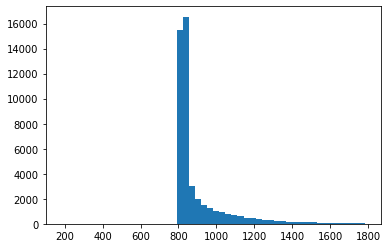

In [ ]:
GE_transpose_all_sample_sum_per_genes = GE_transpose.sum(axis = 0)
plt.hist(GE_transpose_all_sample_sum_per_genes, bins=50)

print('Skewness value:',skew(GE_transpose_all_sample_sum_per_genes)) # Greater than 1, highly skewed right
print('Kurtosis value:',kurtosis(GE_transpose_all_sample_sum_per_genes)) #Greater than 3, highly deviated from normaility with high number of outliers

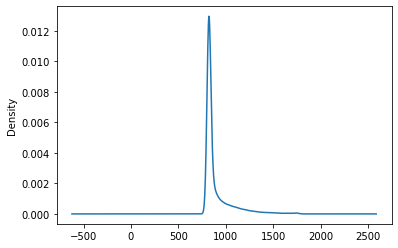

GEO ID
ILMN_2055271     840.096995
ILMN_2383229     825.247486
ILMN_1806310     827.332073
ILMN_1653355     829.001824
ILMN_1705025     827.828319
                   ...     
ILMN_2371169    1361.273634
ILMN_1701875    1477.095300
ILMN_1786396    1092.321928
ILMN_1653618     937.335296
ILMN_2137536     912.440736
Length: 31233, dtype: float64

In [ ]:
GE_transpose_all_sample_sum_per_genes.plot(kind='density')
y=GE_transpose_all_sample_sum_per_genes[np.abs(GE_transpose_all_sample_sum_per_genes)>statistics.mode(np.abs(GE_transpose_all_sample_sum_per_genes))]
plt.show()
y

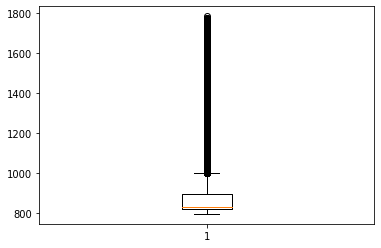

In [ ]:
plt.boxplot(GE_transpose_all_sample_sum_per_genes)
plt.show()

###Samples Exploratory Analysis

Skewness value: -0.007947987443377911
Kurtosis value: 0.5823476954114555


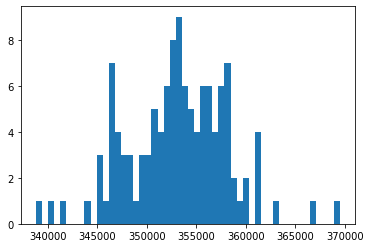

In [ ]:

GE_transpose_all_genes_sum_per_samples = GE_transpose.sum(axis = 1)
plt.hist(GE_transpose_all_genes_sum_per_samples, bins=50)

print('Skewness value:',skew(GE_transpose_all_genes_sum_per_samples)) # between -0.5 and 0.5, the data are fairly symmetrical
print('Kurtosis value:',kurtosis(GE_transpose_all_genes_sum_per_samples)) #Less than 3, fairly normal



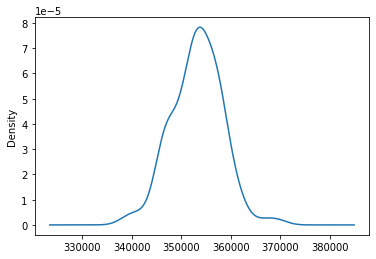

In [ ]:
GE_transpose_all_genes_sum_per_samples.plot(kind='density')
plt.show()

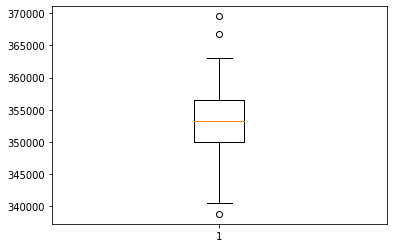

In [ ]:
plt.boxplot(GE_transpose_all_genes_sum_per_samples)
plt.show()

###Genes Outlier Detection

In [ ]:
iso = IsolationForest(contamination=0.05)
yhat = iso.fit_predict(GE_transpose.transpose())
# select all rows that are not outliers
mask = yhat != -1


exported_analysis['iso_gene_outlier']=pd.factorize(yhat)[0]
exported_analysis.to_csv(r'Statistics of Gene Expression.csv', index=True)

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


In [ ]:
GE_transpose_all_sample_sum_per_genes=pd.DataFrame(GE_transpose_all_sample_sum_per_genes)

Q1 = GE_transpose_all_sample_sum_per_genes[0].quantile(0.25)
Q3 = GE_transpose_all_sample_sum_per_genes[0].quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range.

filter = (GE_transpose_all_sample_sum_per_genes[0] >= Q1 - 1.5 * IQR) & (GE_transpose_all_sample_sum_per_genes[0] <= Q3 + 1.5 *IQR)

exported_analysis['quartile_gene_outlier']=pd.factorize(yhat)[0]
exported_analysis.to_csv(r'Statistics of Gene Expression.csv', index=True)

### Samples Outliers Detection

In [ ]:
iso = IsolationForest(contamination=0.05)
yhat = iso.fit_predict(GE_transpose)
print(yhat)
# select all rows that are not outliers
mask = yhat != -1

print(pd.factorize(yhat)[0])

Clinical_transpose["iso_samples_outliers"] = pd.factorize(yhat)[0]
Clinical_transpose.to_csv(r'Statistics of Samples Expression', index=True)


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


[ 1  1  1  1  1  1  1  1 -1 -1  1  1 -1  1 -1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1 -1
  1  1  1  1  1  1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1]
[0 0 0 0 0 0 0 0 1 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
GE_transpose_all_genes_sum_per_samples=pd.DataFrame(GE_transpose_all_genes_sum_per_samples)

Q1 = GE_transpose_all_genes_sum_per_samples[0].quantile(0.25)
Q3 = GE_transpose_all_genes_sum_per_samples[0].quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range.

filter = (GE_transpose_all_genes_sum_per_samples[0] >= Q1 - 1.5 * IQR) & (GE_transpose_all_genes_sum_per_samples[0] <= Q3 + 1.5 *IQR)

print(filter)
Clinical_transpose["quantile_samples_outliers"] = pd.factorize(filter)[0]
Clinical_transpose.to_csv(r'Statistics of Samples Expression.csv', index=True)

GSM1105438    True
GSM1105439    True
GSM1105440    True
GSM1105441    True
GSM1105442    True
              ... 
GSM1105553    True
GSM1105554    True
GSM1105555    True
GSM1105556    True
GSM1105557    True
Name: 0, Length: 120, dtype: bool


###MANOVA Test



```
# This is formatted as code
```

####MANOVA Responders Vs. Non-Responders


#####Load the Clinical Data Profile and integrate the Label to the Expression Matrix

In [ ]:
#CancerType="Kidney"
#EpigenticsExpressed_transpose = pd.read_csv(CancerType+ " "+ Epigentetics_File+"_Integrated.csv",index_col=0)
#EpigenticsExpressed_transpose = pd.read_csv(CancerType+" "+Epigentetics_File+"_DEGs.csv",index_col=0)
#EpigenticsExpressed_transpose=EpigenticsExpressed_transpose.transpose()
EpigenticsExpressed_transpose['Label']=ClinicalData['Label']
EpigenticsExpressed_transpose=EpigenticsExpressed_transpose.dropna()
Label=EpigenticsExpressed_transpose['Label']
EpigenticsExpressed_transpose=EpigenticsExpressed_transpose. iloc[:,:-1]

#####Check the Data integration

In [ ]:
EpigenticsExpressed_transpose=EpigenticsExpressed_data.transpose()
EpigenticsExpressed_transpose

Indexing,cg01763666,cg13417420,cg11073926,cg11890956,cg14361409,cg00376553,cg12898275,cg24176744,cg08730728,cg00172270,...,cg00008665,cg23267890,cg05087982,cg27337209,cg06889756,cg02455706,cg10615271,cg23079522,cg16818145,cg10633746
C3L-00001,2.397045,-4.832787,-3.708741,-5.602037,-1.659576,0.949103,-5.364274,-5.377528,-4.952765,-5.972716,...,0.320245,-0.019870,1.282143,3.754481,2.162491,2.829079,4.475564,3.514606,3.615534,-2.834873
C3L-00009,3.217435,-4.891851,-4.855552,-5.532634,-3.750945,0.749048,-5.885940,-5.691572,-5.314769,-6.079588,...,0.667991,0.079178,2.360356,4.257509,2.786019,2.439850,4.333120,3.746671,3.519799,-3.489288
C3L-00080,2.422294,0.381079,-3.168394,-4.795603,-3.504261,1.535309,-5.284324,-5.465374,-4.808315,-5.832555,...,0.112940,-0.367975,2.005886,3.284431,2.291520,2.663535,1.762915,3.921513,4.143591,-2.696036
C3L-00083,3.959313,-4.460261,-6.004400,-6.130097,-4.584001,0.373602,-5.930054,-5.981560,-5.281949,-6.089361,...,1.739451,0.688502,1.381088,3.191423,1.499095,1.262419,3.053945,2.653768,3.628305,-3.228956
C3L-00093,4.396438,-4.403424,-5.640608,-5.922234,-5.010670,1.402807,-5.998203,-5.950011,-5.173287,-5.785585,...,0.933261,0.451732,1.801019,4.063641,2.678256,2.558278,3.842606,2.783583,4.295038,-3.200471
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C3N-02529,2.578988,-5.458229,-4.521963,-5.862145,-2.986624,1.250989,-5.897079,-3.630564,-5.441849,-6.299134,...,2.217681,1.438937,1.700414,2.745868,1.901567,1.592437,2.290181,3.168372,4.443739,-3.665332
C3N-02572,4.076809,-5.255021,-4.571355,-6.114197,-2.985877,2.350861,-5.532721,-5.961033,-4.784269,-5.772202,...,1.784068,0.331602,2.141428,4.197175,2.965158,2.484342,3.454097,2.934122,4.207476,-3.508600
C3N-02586,3.954444,-5.366193,-4.480766,-5.710337,-3.988747,1.392137,-5.618147,-6.158909,-5.470595,-5.768232,...,1.687875,1.641516,1.597547,3.483869,-0.033563,2.410632,3.675498,3.074060,3.773715,-3.351899
C3N-02588,3.418380,-2.448568,-4.337011,-5.374610,-4.892034,0.877088,-5.103673,-5.231527,-4.733731,-5.636269,...,4.700232,-0.822160,5.477005,-1.028744,0.551855,-1.569625,3.905465,-0.814477,5.393983,-1.406443


In [ ]:
EpigenticsExpressed_transpose.shape

(84, 263019)

#####Apply PCA

<BarContainer object of 72 artists>

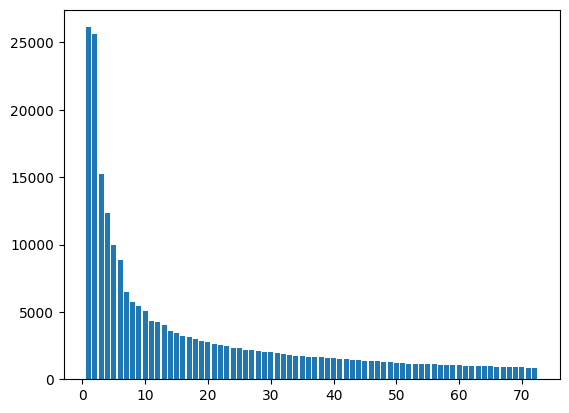

In [ ]:
EpigenticsExpressed_transposed_scaled = StandardScaler().fit_transform(EpigenticsExpressed_transpose)
comp_pca = PCA(n_components=0.95)
EpigenticsExpressed_transpose_pca=comp_pca.fit_transform(EpigenticsExpressed_transposed_scaled)

# Bar plot of explained_variance
plt.bar(
    range(1,len(comp_pca.explained_variance_)+1),
    comp_pca.explained_variance_
    )

#####Visualize The PCA Original Data Labels

/tmp/ipython-input-14-3478970059.py:4: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(EpigenticsExpressed_transpose_pca[Y == i , 0] , EpigenticsExpressed_transpose_pca[Y == i , 1] , label = i,cmap='rainbow')


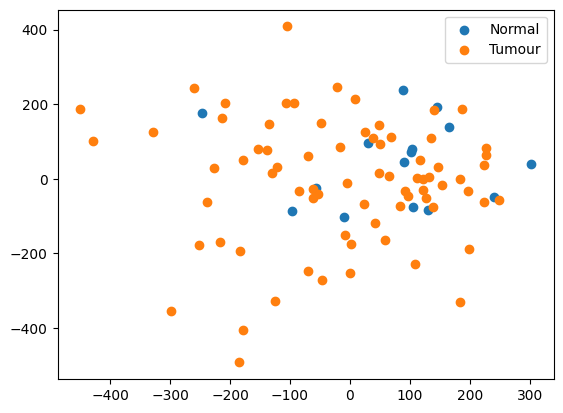

In [ ]:
Y=Label
u_labels = np.unique(Y)
for i in u_labels:
    plt.scatter(EpigenticsExpressed_transpose_pca[Y == i , 0] , EpigenticsExpressed_transpose_pca[Y == i , 1] , label = i,cmap='rainbow')
plt.legend( ['Normal', 'Tumour'])
plt.show()

#####Visualize The K-Means

In [ ]:
#Initialize the class object
kmeans = KMeans(n_clusters= 2)

#predict the labels of clusters.
KMlabel = kmeans.fit_predict(EpigenticsExpressed_transpose_pca)

u_labels = np.unique(KMlabel)
for i in u_labels:
    plt.scatter(EpigenticsExpressed_transpose_pca[KMlabel == i , 0] , EpigenticsExpressed_transpose_pca[KMlabel == i , 1] , label = i,cmap='rainbow')
plt.legend()
plt.show()

NameError: name 'KMeans' is not defined

#####MANOVA Results

In [ ]:
EpigenticsExpressed_transpose_pca_df = pd.DataFrame(EpigenticsExpressed_transpose_pca, index=EpigenticsExpressed_transpose.index)
EpigenticsExpressed_transpose_pca_df['Label']=Label
EpigenticsExpressed_transpose_pca_df=EpigenticsExpressed_transpose_pca_df.add_prefix('col_')

maov = MANOVA.from_formula('col_0+col_1+col_2+col_3+col_4+col_5+col_6+col_7+col_8~col_Label', data=EpigenticsExpressed_transpose_pca_df)

print(maov.mv_test())

                 Multivariate linear model
                                                            
------------------------------------------------------------
       Intercept        Value  Num DF  Den DF F Value Pr > F
------------------------------------------------------------
          Wilks' lambda 0.9274 9.0000 79.0000  0.6874 0.7182
         Pillai's trace 0.0726 9.0000 79.0000  0.6874 0.7182
 Hotelling-Lawley trace 0.0783 9.0000 79.0000  0.6874 0.7182
    Roy's greatest root 0.0783 9.0000 79.0000  0.6874 0.7182
------------------------------------------------------------
                                                            
------------------------------------------------------------
       col_Label        Value  Num DF  Den DF F Value Pr > F
------------------------------------------------------------
          Wilks' lambda 0.9139 9.0000 79.0000  0.8267 0.5935
         Pillai's trace 0.0861 9.0000 79.0000  0.8267 0.5935
 Hotelling-Lawley trace 0.0942 9.0000 79.0

##Bio-markers Extraction and Validation Pipeline

###Integrate Clinical and Gene Expression Profiles

####Load the whole gene expression matrix

In [ ]:
#miRNA_Matrix_Pre-processed.csv
EpigenticsExpressed_transpose = pd.read_csv(CancerType+ " "+ Epigentetics_File+"_Integrated.csv",index_col=0)
EpigenticsExpressed_transpose=EpigenticsExpressed_transpose.transpose()
#ClinicalData['Label']=ClinicalData['Label'].drop(index="C3N-00545-06")
EpigenticsExpressed_transpose['Label']=ClinicalData['Label']
EpigenticsExpressed_transpose=EpigenticsExpressed_transpose.dropna()
EpigenticsExpressed_transpose=EpigenticsExpressed_transpose. iloc[:,:-1]


In [ ]:
EpigenticsExpressed_transpose

Indexing,cg01763666,cg13417420,cg11073926,cg11890956,cg14361409,cg00376553,cg12898275,cg24176744,cg08730728,cg00172270,...,cg00008665,cg23267890,cg05087982,cg27337209,cg06889756,cg02455706,cg10615271,cg23079522,cg16818145,cg10633746
C3L-00001-02,2.397045,-4.832787,-3.708741,-5.602037,-1.659576,0.949103,-5.364274,-5.377528,-4.952765,-5.972716,...,0.320245,-0.019870,1.282143,3.754481,2.162491,2.829079,4.475564,3.514606,3.615534,-2.834873
C3L-00001-06,2.289207,-3.388188,-4.145251,-3.881224,-3.434339,1.072327,-4.162422,-5.597811,-3.856075,-4.496787,...,1.626061,1.302277,1.894842,3.643986,1.824427,2.702188,1.303125,2.395801,4.113326,-4.338622
C3L-00009-01,3.217435,-4.891851,-4.855552,-5.532634,-3.750945,0.749048,-5.885940,-5.691572,-5.314769,-6.079588,...,0.667991,0.079178,2.360356,4.257509,2.786019,2.439850,4.333120,3.746671,3.519799,-3.489288
C3L-00009-06,3.222220,-4.921962,-5.248067,-5.529460,-5.239319,-0.597057,-5.646814,-5.979066,-4.264196,-5.962871,...,0.486581,0.766705,0.979773,3.822663,2.783781,2.074352,1.865434,2.540180,3.561177,-2.841178
C3L-00080-01,2.422294,0.381079,-3.168394,-4.795603,-3.504261,1.535309,-5.284324,-5.465374,-4.808315,-5.832555,...,0.112940,-0.367975,2.005886,3.284431,2.291520,2.663535,1.762915,3.921513,4.143591,-2.696036
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C3N-02587-03,3.171546,-4.893538,-5.252409,-6.016335,-4.548492,-0.001738,-5.903149,-5.812725,-5.133460,-6.063777,...,0.767875,-0.016895,2.165455,3.916034,2.179645,1.212115,4.008407,2.392122,3.084119,-3.119513
C3N-02588-01;C3N-02588-02,3.418380,-2.448568,-4.337011,-5.374610,-4.892034,0.877088,-5.103673,-5.231527,-4.733731,-5.636269,...,4.700232,-0.822160,5.477005,-1.028744,0.551855,-1.569625,3.905465,-0.814477,5.393983,-1.406443
C3N-02588-03,2.917419,-5.023345,-4.890824,-5.832354,-5.089628,-0.016717,-6.053338,-4.813834,-5.399558,-6.033761,...,0.450483,-0.090170,2.639833,3.970087,2.073596,1.244545,4.015928,3.021908,2.512768,-3.067652
C3N-02729-01;C3N-02729-02,4.702431,-5.589862,-5.106613,-6.117159,-5.933994,1.962580,-6.070750,-6.021816,-5.296236,-6.473990,...,0.919221,1.821445,3.094344,4.698516,3.770555,3.638397,3.498534,2.888117,3.696306,-3.637475


###Bio-markers Extraction

In [ ]:
EpigenticsExpressed_transpose['Label']=ClinicalData['Label']
EpigenticsExpressed_transpose=EpigenticsExpressed_transpose.dropna()
Label=EpigenticsExpressed_transpose['Label']
EpigenticsExpressed_transpose=EpigenticsExpressed_transpose. iloc[:,:-1]

##### Checking LDA best genes

In [ ]:
import numpy as np
import numpy as np
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

#EpigenticsExpressed_transpose=EpigenticsExpressed_data

lda = LinearDiscriminantAnalysis()
qda = QuadraticDiscriminantAnalysis()
scaler = StandardScaler()
scaler.fit(EpigenticsExpressed_transpose)
X=scaler.transform(EpigenticsExpressed_transpose)

#knn_neighbors=5
#knn = KNeighborsClassifier(n_neighbors=knn_neighbors)

#lr=LogisticRegression(solver='liblinear', C=10.0, random_state=42)

k_folds = StratifiedKFold(n_splits = 4,shuffle=False)
lda.fit(EpigenticsExpressed_transpose,Label)
#qda.fit(GE_Baseline_Vs_1_Month_Treatment_WGS. iloc[:,:-1],GE_Baseline_Vs_1_Month_Treatment_WGS['Label'])

#acc_lr = cross_val_score(lr, lda.transform(GE_Profile_WGS. iloc[:,:-1]) , GE_Profile_WGS['Label'], cv = k_folds)
#acc_knn = cross_val_score(knn, lda.transform(GE_Baseline_Vs_1_Month_Treatment_WGS. iloc[:,:-1]) , GE_Baseline_Vs_1_Month_Treatment_WGS['Label'], cv = k_folds)

#acc_qda = cross_val_score(knn, qda.transform(GE_Baseline_Vs_1_Month_Treatment_WGS. iloc[:,:-1]) , GE_Baseline_Vs_1_Month_Treatment_WGS['Label'], cv = k_folds)
#print("\nAverage CV Score LDA: ", acc_lr.mean())
#print("\nAverage CV Score LDA: ", acc_knn.mean())
#print("\nAverage CV Score LDA: ", acc_lda.mean())


#lda.get_feature_names_out
#print("\nAverage CV Score QDA: ", acc_qda.mean())

LinearDiscriminantAnalysis()

##### Getting the highly discriminante genes (> than 95% percentile threshold of the Scaling )

/tmp/ipython-input-81-902116914.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HDG_GE_Profile_WGS_Scaling['lda_Scaling_abs']=np.abs(HDG_GE_Profile_WGS_Scaling['lda_Scaling'])


,lda_Scaling,lda_Scaling_abs
Indexing,,
cg23205521,-0.001209,0.001209
cg03188198,0.001139,0.001139
cg02563010,0.001138,0.001138
cg09688486,0.001075,0.001075
cg21132860,0.001025,0.001025
...,...,...
cg16768868,-0.000249,0.000249
cg16358438,-0.000249,0.000249
cg14513226,0.000249,0.000249


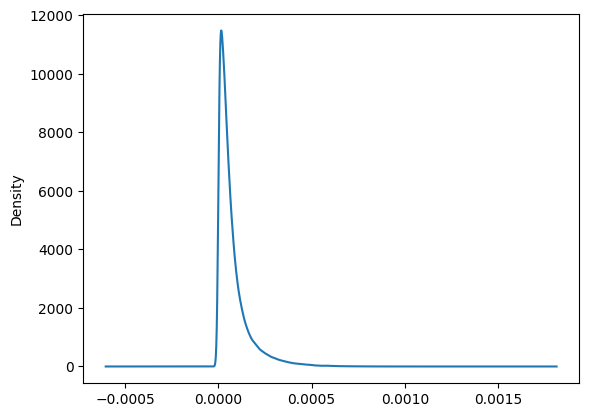

In [ ]:
x=pd.DataFrame(lda.scalings_)
x.index=EpigenticsExpressed_transpose.columns
x=x.rename(columns={0: 'lda_Scaling'})
#print('Skewness value:',skew(np.abs(x['lda_Scaling'])))
np.abs(x['lda_Scaling']).plot(kind='density')
HDG_GE_Profile_WGS_Scaling_percentile = np.percentile(np.abs(x['lda_Scaling']), q=[95])
HDG_GE_Profile_WGS_Scaling=x[np.abs(x['lda_Scaling'])>HDG_GE_Profile_WGS_Scaling_percentile[0]]
HDG_GE_Profile_WGS_Scaling['lda_Scaling_abs']=np.abs(HDG_GE_Profile_WGS_Scaling['lda_Scaling'])
HDG_GE_Profile_WGS_Scaling.sort_values(by='lda_Scaling_abs', ascending=False)

In [ ]:
HDG_GE_Profile_WGS=EpigenticsExpressed_transpose[HDG_GE_Profile_WGS_Scaling.index]

HDG_GE_Profile_WGS

Indexing,cg19148297,cg22448308,cg03041027,cg15482690,cg03442564,cg19958696,cg25268100,cg06008401,cg06699286,cg00020340,...,cg20217307,cg22858861,cg01814495,cg08619385,cg04477291,cg15319028,cg19780571,cg24276988,cg07156990,cg24807053
C3L-00081,-5.670011,-5.289534,-6.031463,-5.996974,5.067954,-6.157936,-2.387319,-5.641539,-4.944775,4.920058,...,4.501714,-4.172952,3.986571,4.557197,-2.442989,4.257864,1.861261,3.343620,3.917601,1.411230
C3L-00415,-5.798814,-5.844143,-6.359291,-6.217425,4.249528,-6.014672,-1.252372,-5.854879,-5.035213,5.862745,...,3.631925,-3.832578,4.106605,3.624420,-3.985721,4.265458,2.130169,2.876739,4.109683,1.884406
C3L-00445,-5.735542,-6.222676,-6.533569,-5.535203,6.049999,-5.870286,-3.774349,-6.272401,-5.171800,6.032267,...,4.053616,-3.396526,3.225123,3.613277,-3.980527,4.055508,2.034970,2.637667,4.323932,2.057234
C3L-00568,-5.900022,-5.726221,-6.172967,-6.087454,4.436267,-5.946288,-1.665090,-5.747261,-4.661489,5.192641,...,3.042948,-4.005980,3.749642,3.836729,-4.275110,3.780608,1.469626,2.731315,4.369226,2.030727
C3L-00603,-5.619422,-5.766807,-6.625091,-6.536844,5.130074,-6.245018,-2.075014,-5.773767,-5.008682,4.737785,...,3.043284,-4.456533,3.556101,3.859375,-2.987667,3.505127,1.961858,2.527681,3.952466,1.285445
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C3N-03882,-5.538555,-5.812061,-6.049233,-6.038965,5.073013,-6.093620,-3.593622,-5.826959,-4.547801,5.180032,...,4.498681,-4.238091,3.919397,4.345970,-3.981032,4.300806,1.788597,3.133480,4.240194,2.006300
C3N-03886,-5.765611,-5.945308,-6.164806,-6.636024,5.738057,-6.218223,-1.952025,-5.534696,-4.575926,5.263446,...,3.936852,-4.250599,3.899401,4.390980,-3.932820,4.116578,2.425039,3.003119,2.766011,3.068246
C3N-04124,-5.379690,-5.646098,-6.151487,-6.247430,5.260671,-6.062451,-1.715474,-5.562388,-4.686452,5.127746,...,4.522403,-3.901692,4.120632,3.540073,-3.946750,3.963021,1.224250,2.611196,4.478945,1.033443
C3N-04155,-5.994427,-6.120721,-6.337408,-6.342972,5.667841,-5.904645,-2.975366,-5.984576,-5.080329,5.594272,...,3.914035,-3.876160,4.539551,4.674345,-4.202175,3.872307,2.102246,2.971956,4.973205,2.116160


####Get the Feature Importance by Random Forest

#####Fitting Random Forest with all the dataset

In [ ]:
# Instantiate model with 1000 decision trees
rf = RandomForestClassifier(n_estimators = 1000, random_state = 42)
# Train the model on training data
rf.fit(HDG_GE_Profile_WGS,Label);


In [ ]:
HDG_GE_Profile_WGS

Indexing,cg19148297,cg22448308,cg03041027,cg15482690,cg03442564,cg19958696,cg25268100,cg06008401,cg06699286,cg00020340,...,cg20217307,cg22858861,cg01814495,cg08619385,cg04477291,cg15319028,cg19780571,cg24276988,cg07156990,cg24807053
C3L-00081,-5.670011,-5.289534,-6.031463,-5.996974,5.067954,-6.157936,-2.387319,-5.641539,-4.944775,4.920058,...,4.501714,-4.172952,3.986571,4.557197,-2.442989,4.257864,1.861261,3.343620,3.917601,1.411230
C3L-00415,-5.798814,-5.844143,-6.359291,-6.217425,4.249528,-6.014672,-1.252372,-5.854879,-5.035213,5.862745,...,3.631925,-3.832578,4.106605,3.624420,-3.985721,4.265458,2.130169,2.876739,4.109683,1.884406
C3L-00445,-5.735542,-6.222676,-6.533569,-5.535203,6.049999,-5.870286,-3.774349,-6.272401,-5.171800,6.032267,...,4.053616,-3.396526,3.225123,3.613277,-3.980527,4.055508,2.034970,2.637667,4.323932,2.057234
C3L-00568,-5.900022,-5.726221,-6.172967,-6.087454,4.436267,-5.946288,-1.665090,-5.747261,-4.661489,5.192641,...,3.042948,-4.005980,3.749642,3.836729,-4.275110,3.780608,1.469626,2.731315,4.369226,2.030727
C3L-00603,-5.619422,-5.766807,-6.625091,-6.536844,5.130074,-6.245018,-2.075014,-5.773767,-5.008682,4.737785,...,3.043284,-4.456533,3.556101,3.859375,-2.987667,3.505127,1.961858,2.527681,3.952466,1.285445
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C3N-03882,-5.538555,-5.812061,-6.049233,-6.038965,5.073013,-6.093620,-3.593622,-5.826959,-4.547801,5.180032,...,4.498681,-4.238091,3.919397,4.345970,-3.981032,4.300806,1.788597,3.133480,4.240194,2.006300
C3N-03886,-5.765611,-5.945308,-6.164806,-6.636024,5.738057,-6.218223,-1.952025,-5.534696,-4.575926,5.263446,...,3.936852,-4.250599,3.899401,4.390980,-3.932820,4.116578,2.425039,3.003119,2.766011,3.068246
C3N-04124,-5.379690,-5.646098,-6.151487,-6.247430,5.260671,-6.062451,-1.715474,-5.562388,-4.686452,5.127746,...,4.522403,-3.901692,4.120632,3.540073,-3.946750,3.963021,1.224250,2.611196,4.478945,1.033443
C3N-04155,-5.994427,-6.120721,-6.337408,-6.342972,5.667841,-5.904645,-2.975366,-5.984576,-5.080329,5.594272,...,3.914035,-3.876160,4.539551,4.674345,-4.202175,3.872307,2.102246,2.971956,4.973205,2.116160


#####Getting the most important features (> than 95% percentile threshold of the importance )

In [ ]:
feature_imp_df=pd.DataFrame(rf.feature_importances_)
feature_imp_df.set_index(HDG_GE_Profile_WGS.columns, inplace=True)
feature_imp_df=feature_imp_df.rename(columns={0: 'RF_Feature_Importance'})
feature_imp_df_imp = np.percentile(np.abs(feature_imp_df['RF_Feature_Importance']), q=[95])
feature_imp_df=feature_imp_df[feature_imp_df['RF_Feature_Importance']>feature_imp_df_imp[0]]
feature_imp_df.sort_values(by='RF_Feature_Importance', ascending=False)

,RF_Feature_Importance
Indexing,
cg26934243,0.003429
cg21603823,0.003211
cg14290127,0.003026
cg12614633,0.002885
cg02418025,0.002833
...,...
cg22430790,0.000416
cg24629445,0.000416
cg03075683,0.000415


In [ ]:
HDG_GE_Profile_WGS=EpigenticsExpressed_transpose[feature_imp_df.index]
HDG_GE_Profile_WGS

Indexing,cg22448308,cg03442564,cg03459953,cg07522664,cg07094735,cg25020373,cg05352303,cg14848555,cg23521603,cg17250440,...,cg19495308,cg07581484,cg01202312,cg23397440,cg17151150,cg08724369,cg07720403,cg08157620,cg22858861,cg07156990
C3L-00081,-5.289534,5.067954,-5.395695,-6.074863,-5.580255,-4.935683,-5.580003,-5.960054,-5.326114,-5.154106,...,0.963206,-3.413909,-3.667046,-3.767761,-4.895469,-2.529148,4.717367,-4.170116,-4.172952,3.917601
C3L-00415,-5.844143,4.249528,-5.656664,-6.155629,-5.793328,-5.162623,-5.368927,-6.000936,-5.401054,-5.572063,...,-0.802687,-4.250495,-3.648520,-3.554541,-4.938148,-2.041146,4.905872,-3.361853,-3.832578,4.109683
C3L-00445,-6.222676,6.049999,-6.369376,-6.265160,-6.148016,-5.449882,-5.653420,-6.407444,-5.151475,-5.259009,...,0.758613,-4.849661,-3.774764,-3.844892,-4.732385,-2.770304,4.361070,-4.162870,-3.396526,4.323932
C3L-00568,-5.726221,4.436267,-5.714006,-6.147284,-5.198058,-5.380825,-5.288334,-5.550737,-5.084278,-4.905360,...,0.367243,-4.022510,-4.300772,-3.774301,-4.945987,-2.305221,4.778529,-3.922918,-4.005980,4.369226
C3L-00603,-5.766807,5.130074,-6.067883,-6.121814,-5.477798,-5.652959,-5.539649,-5.426367,-5.163211,-5.081163,...,0.407470,-4.053248,-4.701343,-3.720902,-5.006084,-2.708156,4.446718,-4.578739,-4.456533,3.952466
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C3N-03882,-5.812061,5.073013,-5.762038,-5.983807,-5.249020,-5.249042,-5.419563,-5.768986,-5.066446,-5.429181,...,0.365865,-4.657059,-3.719095,-3.801196,-4.996183,-2.695062,4.280668,-4.457915,-4.238091,4.240194
C3N-03886,-5.945308,5.738057,-5.946497,-5.996482,-5.412312,-4.992863,-5.600860,-6.313742,-4.612803,-4.977586,...,-1.645063,-3.911582,-4.409460,-4.293267,-4.763223,-2.993997,4.596586,-4.532482,-4.250599,2.766011
C3N-04124,-5.646098,5.260671,-5.714280,-6.020976,-5.154840,-5.121130,-5.807924,-5.556240,-4.835770,-5.249367,...,1.007611,-3.970796,-4.292325,-3.849842,-4.588843,-2.270941,4.015991,-4.089892,-3.901692,4.478945
C3N-04155,-6.120721,5.667841,-6.148783,-5.951496,-5.671139,-5.204867,-5.833259,-5.872548,-4.716820,-5.458056,...,-0.245593,-4.329036,-4.243529,-4.222121,-4.974004,-2.870142,4.123150,-4.194670,-3.876160,4.973205


####Getting the Significant DEGs after the Feature Importance

#####Calculate the Log Fold change over the Ranked features

In [ ]:
HDG_GE_Profile_WGS['Label']=Label
HDG_GE_Profile_WGS_df_grouped_mean=HDG_GE_Profile_WGS.groupby(by='Label').mean()
HDG_GE_Profile_WGS_df_grouped_sorted=HDG_GE_Profile_WGS_df_grouped_mean.sort_values(by=['Label'],ascending=False)
HDG_GE_Profile_WGS_DEG_log2FC=pd.DataFrame(HDG_GE_Profile_WGS_df_grouped_sorted.diff().loc[0])
HDG_GE_Profile_WGS_DEG_Results=pd.DataFrame(HDG_GE_Profile_WGS_DEG_log2FC)
HDG_GE_Profile_WGS_DEG_Results=HDG_GE_Profile_WGS_DEG_Results.rename(columns={0: 'Log2FC'})
HDG_GE_Profile_WGS_DEG_Results['Fold change']=(pow(2,HDG_GE_Profile_WGS_DEG_log2FC))
HDG_GE_Profile_WGS_DEG_Results
#GE_Profile_WGS_DEG_Results[GE_Profile_WGS_DEG_Results['Fold change']>1.2].sort_values(by=['Fold change'],ascending=False,key=abs)
#(HDG_GE_Profile_WGS_DEG_Results['Fold change']>1.5).sum()
#(HDG_GE_Profile_WGS_DEG_Results['Log2FC']>0).sum()

/tmp/ipython-input-31-1808526753.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HDG_GE_Profile_WGS['Label']=Label


,Log2FC,Fold change
Indexing,,
cg22448308,0.044816,1.031551
cg03442564,-0.099161,0.933576
cg03459953,-0.001213,0.999159
cg07522664,0.035134,1.024652
cg07094735,0.036314,1.025491
...,...,...
cg08724369,0.238194,1.179516
cg07720403,0.234755,1.176707
cg08157620,0.270498,1.206225


#####Calculate the P-value for the Normal Distributed Genes

In [ ]:

#HDG_GE_Profile_WGS=pd.read_csv(CancerType+ " " + Epigentetics_File+"_AS_0.8.csv",index_col=0)

#HDG_GE_Profile_WGS['Label']=ClinicalData['Label']
#Label=HDG_GE_Profile_WGS['Label']
exported_analysis = pd.read_csv(CancerType+"_Statistics_of_DNA_Methylation.csv",)
#exported_analysis = pd.read_csv(CancerType+"_Statistics_of_miRNA.csv",)
Normally_Distributed_Genes= exported_analysis[exported_analysis['Result']=='normally distributed']
#GE_Profile_WGS_ND=GE_Profile_WGS[Normally_Distributed_Genes['gene_name']]
GE_Profile_WGS_ND=EpigenticsExpressed_transpose[list(set(HDG_GE_Profile_WGS) & set(Normally_Distributed_Genes['Feature']))]
GE_Profile_WGS_ND['Label']=Label
res_ttest_df = pd.DataFrame({'Feature': [], 'P-Value':[]})
num_values =  GE_Profile_WGS_ND.shape[1]
for col in range(0, num_values-1):
    summary, result=stats.ttest_ind( GE_Profile_WGS_ND.iloc[ :,col][GE_Profile_WGS_ND['Label']==1],
         GE_Profile_WGS_ND.iloc[ :,col][GE_Profile_WGS_ND['Label']==0])
    pvalue = result
    res_ttest_df = res_ttest_df._append({'Feature': GE_Profile_WGS_ND.columns[col], 'P-Value': pvalue}, ignore_index=True)

res_ttest_df

/tmp/ipython-input-32-2561203120.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  GE_Profile_WGS_ND['Label']=Label


,Feature,P-Value
0,cg08417687,0.087579
1,cg01919488,0.228786
2,cg22841359,0.990855
3,cg01892727,0.072614
4,cg25559625,0.312868
...,...,...
175,cg00170564,0.005613
176,cg25007351,0.754308
177,cg07581484,0.172399
178,cg06808571,0.155955


#####Calculate the P-Value for the Not Normally Distributed Genes

In [ ]:

#HDG_GE_Profile_WGS=pd.read_csv(CancerType+ " " + Epigentetics_File+"_AS_0.8.csv",index_col=0)
#HDG_GE_Profile_WGS['Label']=ClinicalData['Label']
Label=HDG_GE_Profile_WGS['Label']

Not_normally_Distributed_Genes= exported_analysis[exported_analysis['Result']=='not normally distributed']
#GE_Profile_WGS_NND=GE_Profile_WGS[Not_normally_Distributed_Genes['gene_name']]
GE_Profile_WGS_NND=EpigenticsExpressed_transpose[list(set(HDG_GE_Profile_WGS) & set(Not_normally_Distributed_Genes['Feature']))]
GE_Profile_WGS_NND['Label']=Label
num_values =  GE_Profile_WGS_NND.shape[1]

for col in range(0, num_values-1):
    ttest_result = stats.mannwhitneyu(GE_Profile_WGS_NND.iloc[ :,col][GE_Profile_WGS_NND['Label']==1],GE_Profile_WGS_NND.iloc[ :,col][GE_Profile_WGS_NND['Label']==0])
    pvalue = ttest_result[1]
    res_ttest_df = res_ttest_df._append({'Feature': GE_Profile_WGS_NND.columns[col], 'P-Value': pvalue}, ignore_index=True)

res_ttest_df

/tmp/ipython-input-33-1724664651.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  GE_Profile_WGS_NND['Label']=Label


,Feature,P-Value
0,cg08417687,0.087579
1,cg01919488,0.228786
2,cg22841359,0.990855
3,cg01892727,0.072614
4,cg25559625,0.312868
...,...,...
596,cg19978209,0.332069
597,cg09444439,0.060158
598,cg07501049,0.305479
599,cg20898522,0.071403


In [ ]:
res_ttest_df.sort_values(by='P-Value')

,Feature,P-Value
394,cg14335142,0.000160
542,cg02418025,0.000292
234,cg07726187,0.000331
105,cg04874326,0.000973
363,cg12619347,0.001029
...,...,...
517,cg07719100,0.986883
2,cg22841359,0.990855
304,cg15225378,0.995628
353,cg05732725,0.995628


In [ ]:
res_ttest_df.set_index(res_ttest_df['Feature'], inplace=True)
HDG_GE_Profile_WGS_DEG_Results['P-Value']=res_ttest_df['P-Value']
HDG_GE_Profile_WGS_DEG_Results

,Log2FC,Fold change,P-Value
Indexing,,,
cg22448308,0.044816,1.031551,0.917075
cg03442564,-0.099161,0.933576,0.479619
cg03459953,-0.001213,0.999159,0.925777
cg07522664,0.035134,1.024652,0.891031
cg07094735,0.036314,1.025491,0.746454
...,...,...,...
cg08724369,0.238194,1.179516,0.005651
cg07720403,0.234755,1.176707,0.003491
cg08157620,0.270498,1.206225,0.014304


#####Get the Adjusted P-Value of < 0.1

In [ ]:
HDG_GE_Profile_WGS_DEG_Results

,Log2FC,Fold change,P-Value
Indexing,,,
cg22448308,0.044816,1.031551,0.917075
cg03442564,-0.099161,0.933576,0.479619
cg03459953,-0.001213,0.999159,0.925777
cg07522664,0.035134,1.024652,0.891031
cg07094735,0.036314,1.025491,0.746454
...,...,...,...
cg08724369,0.238194,1.179516,0.005651
cg07720403,0.234755,1.176707,0.003491
cg08157620,0.270498,1.206225,0.014304


In [ ]:
HDG_GE_Profile_WGS_DEG_Results['P-Value']

HDG_GE_Profile_WGS_DEG_Results=HDG_GE_Profile_WGS_DEG_Results.sort_values(by='P-Value')
HDG_GE_Profile_WGS_DEG_Results=HDG_GE_Profile_WGS_DEG_Results.reset_index()
HDG_GE_Profile_WGS_DEG_Results['Adj_p-value_BH']=(HDG_GE_Profile_WGS_DEG_Results['P-Value']*HDG_GE_Profile_WGS_DEG_Results.shape[0])/(HDG_GE_Profile_WGS_DEG_Results.index+1)
HDG_GE_Profile_WGS_DEG_Results=HDG_GE_Profile_WGS_DEG_Results
HDG_GE_Profile_WGS_DEG_Results.set_index(HDG_GE_Profile_WGS_DEG_Results['Indexing'], inplace=True)

In [ ]:
HDG_GE_Profile_WGS_DEG_Results

,Indexing,Log2FC,Fold change,P-Value,Adj_p-value_BH
Indexing,,,,,
cg14335142,cg14335142,0.653835,1.573345,0.000160,0.095896
cg02418025,cg02418025,0.373483,1.295477,0.000292,0.087759
cg07726187,cg07726187,0.218353,1.163405,0.000331,0.066404
cg04874326,cg04874326,0.243658,1.183991,0.000973,0.146155
cg12619347,cg12619347,0.628905,1.546391,0.001029,0.123675
...,...,...,...,...,...
cg07719100,cg07719100,0.053211,1.037572,0.986883,0.993496
cg22841359,cg22841359,-0.000805,0.999442,0.990855,0.995826
cg15225378,cg15225378,0.064898,1.046011,0.995628,0.998952


In [ ]:
HDG_GE_Profile_WGS_DEG_Results=HDG_GE_Profile_WGS_DEG_Results.rename(columns={'Indexing': 'Feature ID'})
HDG_GE_Profile_WGS_DEG_Results.drop(['Feature ID'],axis=1,inplace=True)
HDG_GE_Profile_WGS_DEG_Results

,Log2FC,Fold change,P-Value,Adj_p-value_BH
Indexing,,,,
cg14335142,0.653835,1.573345,0.000160,0.095896
cg02418025,0.373483,1.295477,0.000292,0.087759
cg07726187,0.218353,1.163405,0.000331,0.066404
cg04874326,0.243658,1.183991,0.000973,0.146155
cg12619347,0.628905,1.546391,0.001029,0.123675
...,...,...,...,...
cg07719100,0.053211,1.037572,0.986883,0.993496
cg22841359,-0.000805,0.999442,0.990855,0.995826
cg15225378,0.064898,1.046011,0.995628,0.998952


In [ ]:
DEGs=HDG_GE_Profile_WGS_DEG_Results[(HDG_GE_Profile_WGS_DEG_Results['Adj_p-value_BH']<0.1) & (HDG_GE_Profile_WGS_DEG_Results['Fold change']>=1.2)].sort_values(by='Adj_p-value_BH')
DEGs

,Log2FC,Fold change,P-Value,Adj_p-value_BH
Indexing,,,,
cg23179640,0.414337,1.332686,0.002271,0.080274
cg23704023,0.381979,1.303128,0.001230,0.082122
cg26923779,0.275519,1.210430,0.002203,0.082732
cg01460715,0.328001,1.255273,0.001399,0.084091
cg14290127,0.307812,1.237829,0.002162,0.086608
cg02418025,0.373483,1.295477,0.000292,0.087759
cg11777498,0.316297,1.245131,0.001179,0.088587
cg23779626,0.417197,1.335331,0.002072,0.088927
cg00176657,0.320954,1.249156,0.004156,0.092503


In [ ]:
len(DEGs)

18

#####Export the DEGs

In [ ]:
HDG_GE_Profile_WGS_DEGs=HDG_GE_Profile_WGS[HDG_GE_Profile_WGS_DEG_Results[(HDG_GE_Profile_WGS_DEG_Results['Adj_p-value_BH']<0.1) & (HDG_GE_Profile_WGS_DEG_Results['Fold change']>=1.2)].index]
HDG_GE_Profile_WGS_DEGs.to_csv(CancerType+" "+Epigentetics_File+"_Multi_intervention_DEGs.csv")
HDG_GE_Profile_WGS=HDG_GE_Profile_WGS_DEGs

###Bio-markers Validation

####Machine Learning Classification

#####Load the significant DEGs

In [ ]:
#miRNA_Matrix_Pre-processed.csv  #Epigentetics_File+"_CI_0.2.csv"
CancerType="Kidney"
#HDG_GE_Profile_WGS = pd.read_csv(CancerType+" "+Epigentetics_File+"_DEGs.csv",index_col=0)
#HDG_GE_Profile_WGS = pd.read_csv(CancerType+"_LIMMA_DEGs.csv",index_col=0)
#HDG_GE_Profile_WGS = pd.read_csv(CancerType+ " "+ Epigentetics_File+"_AS_0.8_75.csv",index_col=0)
#HDG_GE_Profile_WGS=HDG_GE_Profile_WGS.transpose()
#HDG_GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_Estimate_Avg_FI_SL_0.75.csv",index_col=0)
#HDG_GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_Implicit_Dual_Estimate_LS_DML_0.75.csv",index_col=0)
#HDG_GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_Estimate_Pro_LS_DRL_0.75.csv",index_col=0)

#HDG_GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_Multi-intervention_LS_0.75.csv",index_col=0)
#HDG_GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_Multi_intervention_DEGs.csv",index_col=0)

HDG_GE_Profile_WGS = pd.read_csv(CancerType+ " " + "DNA_Methylayion_Multi_intervention_LIMMA.csv",index_col=0)


In [ ]:
HDG_GE_Profile_WGS.rename(columns=lambda x: x.replace('.', '-'), inplace=True)
HDG_GE_Profile_WGS=HDG_GE_Profile_WGS.transpose()

In [ ]:
HDG_GE_Profile_WGS.rename(columns={'C3N-00242-01-C3N-00242-02':'C3N-00242-01;C3N-00242-02'}, inplace=True)
HDG_GE_Profile_WGS.rename(columns={'C3N-00494-02-C3N-00494-03':'C3N-00494-02;C3N-00494-03'}, inplace=True)
HDG_GE_Profile_WGS.rename(columns={'C3N-01648-01-C3N-01648-02':'C3N-01648-01;C3N-01648-02'}, inplace=True)
HDG_GE_Profile_WGS.rename(columns={'C3N-01808-02-C3N-01808-03':'C3N-01808-02;C3N-01808-03'}, inplace=True)

In [ ]:
HDG_GE_Profile_WGS.index.name="Index"
Label=ClinicalData2['last_known_disease_status']
#HDG_GE_Profile_WGS.drop(['Index'],axis=1,inplace=True)
#Label.drop(['Index'],axis=1,inplace=True)

In [ ]:
HDG_GE_Profile_WGS=HDG_GE_Profile_WGS.transpose()
#HDG_GE_Profile_WGS=HDG_GE_Profile_WGS_DEGs
HDG_GE_Profile_WGS['Label']=Label
#HDG_GE_Profile_WGS=HDG_GE_Profile_WGS.drop(index="C3N-00545-06")
#Label=HDG_GE_Profile_WGS['Label']
#HDG_GE_Profile_WGS=HDG_GE_Profile_WGS.dropna()
#Label=HDG_GE_Profile_WGS['Label']
#HDG_GE_Profile_WGS=HDG_GE_Profile_WGS. iloc[:,:-1]

In [ ]:
Label=HDG_GE_Profile_WGS['Label']
HDG_GE_Profile_WGS=HDG_GE_Profile_WGS. iloc[:,:-1]
#Label

In [ ]:
HDG_GE_Profile_WGS

,cg01763666,cg13417420,cg00376553,cg12898275,cg24176744,cg07469408,cg00172270,cg15972572,cg03970319,cg18340446,...,cg12581244,cg03705879,cg15750941,cg14473243,cg21771463,cg16533812,cg01557411,cg02582619,cg01385168,cg13141065
C3L-00004-01,5.607692,0.018081,2.021736,0.018200,0.020230,0.018285,0.022881,20.333142,0.071927,0.027676,...,0.027348,0.054357,2.238733,0.042632,0.134652,9.630499,0.188353,17.830580,0.012881,12.562080
C3L-00010-01,1.444554,0.027093,1.814970,0.025313,0.017945,0.017300,0.016567,12.889705,0.783681,0.034413,...,0.040960,0.078902,2.047172,0.052802,0.066275,9.347759,0.082900,20.041737,0.018469,8.745037
C3L-00011-01,11.527811,0.022425,4.324305,0.021464,0.017264,0.027076,0.016096,15.030569,0.401281,0.029354,...,0.071786,0.062514,68.012351,0.051856,0.045129,8.009811,0.047534,24.557210,0.015338,16.995709
C3L-00026-01,1.202221,0.024228,4.358779,0.021315,0.019756,0.016433,0.018504,18.924049,1.207160,0.033173,...,0.145478,0.088589,1.388813,0.044822,0.055322,8.854559,0.079086,35.865567,0.014776,8.691066
C3L-00079-01,6.856260,0.026309,2.991769,0.023184,0.020243,0.016784,0.017381,16.911885,0.503094,0.025311,...,0.030803,0.068904,2.844584,0.050094,0.087094,8.058387,0.125854,15.761243,0.016514,13.208812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C3N-01646-01,1.878184,0.024831,2.148016,0.019053,0.012752,0.012133,0.016612,36.288588,0.168613,0.018442,...,0.046261,0.045775,20.043599,0.034553,0.052973,7.150014,0.135350,27.741658,0.012365,13.695808
C3N-01648-01;C3N-01648-02,3.339173,0.032621,0.835514,0.023936,0.020455,0.015082,0.018669,8.382481,0.145885,0.022474,...,0.042023,0.063842,6.408652,0.034401,0.150164,6.452688,0.474356,13.029402,0.013882,5.944811
C3N-01649-02,45.012360,0.019895,4.399903,0.014086,0.013510,0.010324,0.014127,22.242132,0.060477,0.012541,...,0.033502,0.075892,2.359234,0.033290,0.021900,13.383388,0.047624,53.171429,0.012682,7.819334
C3N-01651-01,10.871401,0.019651,3.813454,0.020424,0.015649,0.015848,0.017151,29.454037,1.395233,0.021964,...,0.127285,0.066503,51.882074,0.047980,0.173293,9.770264,0.088035,23.826029,0.015581,10.857130


#####Classify Random Forest

######K-Fold =5/10

In [ ]:
k_folds = RepeatedStratifiedKFold(n_splits =10, n_repeats=3,random_state=987654321)

In [ ]:
# Instantiate model with 1000 decision trees
rf = RandomForestClassifier(n_estimators = 1000, random_state = 42)

In [ ]:
scores = cross_val_score(rf, HDG_GE_Profile_WGS, Label, cv = k_folds)
print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.8        0.7        0.8        0.7        0.66666667 0.66666667
 0.77777778 0.77777778 0.88888889 0.55555556 0.7        0.6
 0.7        0.6        0.77777778 0.77777778 0.66666667 0.88888889
 0.77777778 0.66666667 0.7        0.9        0.4        0.7
 0.77777778 0.77777778 0.77777778 0.77777778 0.88888889 0.66666667]
Average CV Score:  0.7285185185185186
Number of CV Scores used in Average:  30


##### Classify Boosting

######K-Fold =5/10

In [ ]:
k_folds = RepeatedStratifiedKFold(n_splits =10, n_repeats=3,random_state=987654321)

In [ ]:
# Instantiate model with 1000 decision trees
ab = AdaBoostClassifier(n_estimators=500,learning_rate=1,algorithm='SAMME',random_state=987654321)

In [ ]:
scores = cross_val_score(ab, HDG_GE_Profile_WGS, Label, cv = k_folds)
print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores)) #more than 20 mins

Cross Validation Scores:  [0.7        0.7        0.8        0.6        0.55555556 0.66666667
 0.77777778 0.77777778 0.66666667 0.44444444 0.6        0.6
 0.7        0.6        0.77777778 0.77777778 0.66666667 0.66666667
 0.66666667 0.55555556 0.6        0.7        0.3        0.7
 0.55555556 0.77777778 0.77777778 0.55555556 0.77777778 0.55555556]
Average CV Score:  0.6533333333333335
Number of CV Scores used in Average:  30


#####Classify SVM

######K-Fold =5/10

In [ ]:
k_folds = RepeatedStratifiedKFold(n_splits =10, n_repeats=3,random_state=987654321)

In [ ]:
# Instantiate model
#kernel='linear' 'sigmoid'
#clf = svm.SVC( kernel='linear')
clf = svm.SVC()

In [ ]:
scores = cross_val_score(clf, HDG_GE_Profile_WGS, Label, cv = k_folds)
print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.7        0.7        0.7        0.7        0.77777778 0.77777778
 0.77777778 0.77777778 0.77777778 0.66666667 0.7        0.7
 0.7        0.7        0.77777778 0.77777778 0.77777778 0.77777778
 0.77777778 0.66666667 0.7        0.7        0.5        0.7
 0.77777778 0.77777778 0.77777778 0.77777778 0.77777778 0.66666667]
Average CV Score:  0.728888888888889
Number of CV Scores used in Average:  30


#####LDA

######K-Fold =5/10

In [ ]:
k_folds = RepeatedStratifiedKFold(n_splits =10, n_repeats=3,random_state=987654321)

In [ ]:
# Instantiate model
lda=LinearDiscriminantAnalysis()

In [ ]:
scores = cross_val_score(lda, HDG_GE_Profile_WGS, Label, cv = k_folds)
print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.7        0.7        0.8        0.7        0.66666667 0.66666667
 0.77777778 0.77777778 0.77777778 0.55555556 0.7        0.6
 0.7        0.6        0.77777778 0.77777778 0.55555556 0.88888889
 0.77777778 0.66666667 0.6        0.8        0.4        0.7
 0.77777778 0.77777778 0.77777778 0.77777778 0.88888889 0.55555556]
Average CV Score:  0.7074074074074075
Number of CV Scores used in Average:  30


#####QDA

######K-Fold =5/10

In [ ]:
k_folds = RepeatedStratifiedKFold(n_splits =10, n_repeats=3,random_state=987654321)

In [ ]:
# Instantiate model
qda=QuadraticDiscriminantAnalysis()

In [ ]:
scores = cross_val_score(qda, HDG_GE_Profile_WGS, Label, cv = k_folds)
print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.91666667 1.         1.         0.90909091 1.         1.
 1.         1.         1.         1.         1.         0.91666667
 1.         1.         1.         1.         1.         1.
 0.90909091 0.90909091 1.         1.         1.         1.
 1.         1.         1.         0.81818182 1.         1.        ]
Average CV Score:  0.9792929292929293
Number of CV Scores used in Average:  30


#####KNN

######K-Fold =5/10

In [ ]:
k_folds = RepeatedStratifiedKFold(n_splits =10, n_repeats=3,random_state=987654321)

In [ ]:
# Instantiate model
knn=KNeighborsClassifier(n_neighbors=5)

In [ ]:
scores = cross_val_score(knn, HDG_GE_Profile_WGS, Label, cv = k_folds)
print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.6        0.8        0.8        0.7        0.55555556 0.66666667
 0.77777778 0.55555556 0.77777778 0.44444444 0.8        0.5
 0.6        0.6        0.66666667 0.77777778 0.55555556 0.77777778
 0.66666667 0.55555556 0.6        0.6        0.5        0.7
 0.66666667 0.66666667 0.77777778 0.88888889 0.77777778 0.55555556]
Average CV Score:  0.6637037037037038
Number of CV Scores used in Average:  30


#####Classify Naive Bayes

######K-Fold =5/10

In [ ]:
k_folds = RepeatedStratifiedKFold(n_splits =10, n_repeats=3,random_state=987654321)

In [ ]:
gnb = GaussianNB()

In [ ]:
scores = cross_val_score(gnb, HDG_GE_Profile_WGS, Label, cv = k_folds)
print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.8        0.8        0.6        0.4        0.33333333 0.44444444
 0.55555556 0.88888889 0.66666667 0.55555556 0.7        0.6
 0.9        0.4        0.66666667 0.77777778 0.44444444 0.66666667
 0.77777778 0.55555556 0.2        0.7        0.2        0.5
 0.88888889 0.55555556 1.         0.66666667 0.88888889 0.33333333]
Average CV Score:  0.6155555555555555
Number of CV Scores used in Average:  30


#####Classify Logistic Regression

######K-Fold =5/10

In [ ]:
k_folds = RepeatedStratifiedKFold(n_splits =10, n_repeats=3,random_state=987654321)

In [ ]:
# Instantiate model
lr=LogisticRegression(solver='liblinear', C=10.0, random_state=42)

In [ ]:
scores = cross_val_score(lr, HDG_GE_Profile_WGS, Label, cv = k_folds)
print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.7        0.8        0.7        0.6        0.77777778 0.66666667
 0.66666667 0.66666667 0.77777778 0.66666667 0.6        0.5
 0.5        0.8        0.77777778 0.77777778 0.66666667 0.88888889
 0.88888889 0.44444444 0.6        0.7        0.3        0.8
 0.77777778 0.88888889 0.66666667 0.66666667 0.88888889 0.66666667]
Average CV Score:  0.6940740740740742
Number of CV Scores used in Average:  30


#####Classify Deep Neural Network

######K-Fold =5/10

In [ ]:
import numpy
import pandas
from keras.models import Sequential
from keras.layers import Dense
from scikeras.wrappers import KerasClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold
import keras
# load dataset

import tensorflow as tf
import random as python_random

def reset_seeds():
   np.random.seed(987654321)
   python_random.seed(987654321)
   tf.random.set_seed(987654321)
   keras.utils.set_random_seed(987654321)

reset_seeds()

X = HDG_GE_Profile_WGS.values
Y = Label
# encode class values as integers
encoder = LabelEncoder()
encoder.fit(Y)
encoded_Y = encoder.transform(Y)
# larger model
def DeepNN():
	# create model
    model = Sequential()
    model.add(Dense(100, input_shape=(len(HDG_GE_Profile_WGS.columns),), activation='relu'))
    model.add(Dense(100, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(100, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(100, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(1, activation='sigmoid'))
    # Compile model
    model.compile(loss='binary_crossentropy', optimizer='adamax', metrics=['accuracy'])
    return model
estimator = KerasClassifier(model=DeepNN, epochs=20, batch_size=4, verbose=0)
k_folds = RepeatedStratifiedKFold(n_splits =10, n_repeats=3,random_state=987654321)
results = cross_val_score(estimator, X, encoded_Y, cv=k_folds)
print("Mean accuracy: %.2f%% (%.2f%%)" % (results.mean()*100, results.std()*100))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/lo

Mean accuracy: 70.78% (8.71%)


In [ ]:
results.mean()

0.996078431372549

####Explainable AI

#####Performance Evaluation

In [ ]:
k_folds = RepeatedStratifiedKFold(n_splits = 10, n_repeats=3,random_state=987654321)

In [ ]:
HDG_GE_Profile_WGS

,cg13897627,cg00576086,cg09853702,cg01573635,cg09873544,cg19319037,cg07691684,cg05516390,cg23156348
C3L-00977-02,0.519399,-0.601530,-2.515431,0.050937,0.488929,-1.741567,0.656659,-1.603555,-3.737814
C3L-00994-04,0.927383,-0.243070,-1.031019,0.019296,0.538308,-0.803770,0.933246,-1.268991,-3.884483
C3L-00994-07,2.048056,1.949794,0.740694,1.370344,2.254976,1.636239,3.648650,0.428163,-2.410569
C3L-00995-02,0.864629,0.306887,-2.067552,-0.102015,0.422363,-0.968519,0.743662,-1.741580,-4.131821
C3L-00995-06,1.980787,1.663969,0.312205,1.082079,1.616464,1.647642,3.379808,0.698444,-3.435170
...,...,...,...,...,...,...,...,...,...
C3N-04278-01,0.073127,1.049478,-1.536099,-0.405551,0.349092,-1.683514,0.375627,-1.375403,-3.726761
C3N-04278-05,2.180482,1.134293,-0.080096,1.150496,2.155932,-0.411469,3.968676,-0.013062,-1.636258
C3N-04279-01,-0.808017,-0.993168,-2.994774,-1.232060,-0.428585,-1.630654,0.617586,-2.921571,-4.066388
C3N-04280-03,-0.205555,-0.439327,-3.087100,-1.081584,-0.683640,-1.378020,-1.244966,-1.971275,-4.577928


In [ ]:
def reset_seeds():
   np.random.seed(987654321)
   python_random.seed(987654321)
   tf.random.set_seed(987654321)
   keras.utils.set_random_seed(987654321)

reset_seeds()

#HDG_GE_Profile_WGS = pd.read_csv('AS_DEGs_List_C1_P1_Baseline_Vs_1_Month_Treatment.csv',index_col=0)
#HDG_GE_Profile_WGS['Label']=pd.read_csv('C1_P1_Baseline_Vs_1_Month_Treatment.csv',index_col=0)['Label']
#LSCC Methylation_Meta_Value_Estimate_Avg_FI_SMLR_0.75
#HDG_GE_Profile_WGS = pd.read_csv(CancerType+" "+Epigentetics_File+"_Estimate_Avg_FI_SMLR_0.75.csv",index_col=0)
HDG_GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_Implicit_Dual_Estimate_DR_SL_0.75.csv",index_col=0)
#HDG_GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_Estimate_Pro_LS_SL_0.75.csv",index_col=0)
#HDG_GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_Dual_Estimate_DR_TL_2_0.75.csv",index_col=0)
#HDG_GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_Dual_Estimate_LS_XL_1_0.75.csv",index_col=0)

#HDG_GE_Profile_WGS = pd.read_csv("LUAD_LIMMA_DEGs.csv",index_col=0)
#HDG_GE_Profile_WGS=HDG_GE_Profile_WGS.transpose()
ClinicalData = pd.read_csv(CancerType+" "+"Proteomics Clinical.csv", index_col=0)
ClinicalData.set_index("Sample Submitter ID",inplace=True)
HDG_GE_Profile_WGS['Label']=ClinicalData['Label']
HDG_GE_Profile_WGS=HDG_GE_Profile_WGS.dropna()
Label=HDG_GE_Profile_WGS['Label']
HDG_GE_Profile_WGS=HDG_GE_Profile_WGS. iloc[:,:-1]

#kernel='linear', 'sigmoid'
#clf = svm.SVC(kernel='linear')
#gnb = GaussianNB()
#rf = RandomForestClassifier(n_estimators = 1000, random_state = 42)
#ab = AdaBoostClassifier(n_estimators=500,learning_rate=1,algorithm='SAMME', random_state=987654321)
#knn=KNeighborsClassifier(n_neighbors=5)
#lr=LogisticRegression(solver='liblinear', C=10.0, random_state=42)
#lda=LinearDiscriminantAnalysis()


def specificity(y_true,y_pred):
      cm=confusion_matrix(y_true, y_pred)
      FP = cm.sum(axis=0) - np.diag(cm)
      FN = cm.sum(axis=1) - np.diag(cm)
      TP = np.diag(cm)
      TN = cm.sum() - (FP + FN + TP)
      Specificity = TN/(TN+FP)
      return np.mean(Specificity)

scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score, average='weighted'),
    'recall': make_scorer(recall_score, average='weighted'),
    'specificity' : make_scorer(specificity),
    'auroc' : make_scorer(roc_auc_score),
    'jaccard' : make_scorer(jaccard_score),
    'f1_score': make_scorer(f1_score, average='weighted')
}
results = cross_validate (estimator, X, encoded_Y,scoring=scoring, cv=k_folds)
#results = cross_validate (lr, HDG_GE_Profile_WGS, Label,scoring=scoring, cv=k_folds)
print({"Accuracy":results['test_accuracy'].mean(),"Precision":results['test_precision'].mean(),"Sensitivity":results['test_recall'].mean(),"Specificity":results['test_specificity'].mean(),"jaccard":results['test_jaccard'].mean(),"F1_score":results['test_f1_score'].mean(),"AUROC":results['test_auroc'].mean()})


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first la

{'Accuracy': 0.9939393939393939, 'Precision': 0.9951515151515152, 'Sensitivity': 0.9939393939393939, 'Specificity': 0.9888888888888889, 'jaccard': 0.9933333333333334, 'F1_score': 0.9927609427609428, 'AUROC': 0.9888888888888889}


In [ ]:
HDG_GE_Profile_WGS.columns

Index(['C3L-00081-01', 'C3L-00081-06', 'C3L-00415-03', 'C3L-00415-06',
       'C3L-00445-01', 'C3L-00568-01', 'C3L-00568-06', 'C3L-00603-02',
       'C3L-00603-06', 'C3L-00904-01',
       ...
       'C3N-03877-03', 'C3N-03880-03', 'C3N-03882-01', 'C3N-03882-03',
       'C3N-03886-03', 'C3N-04124-01;C3N-04124-02', 'C3N-04124-03',
       'C3N-04127-03', 'C3N-04155-01', 'C3N-04162-03'],
      dtype='object', length=181)

##### Shap Plots

  0%|          | 0/181 [00:00<?, ?it/s]

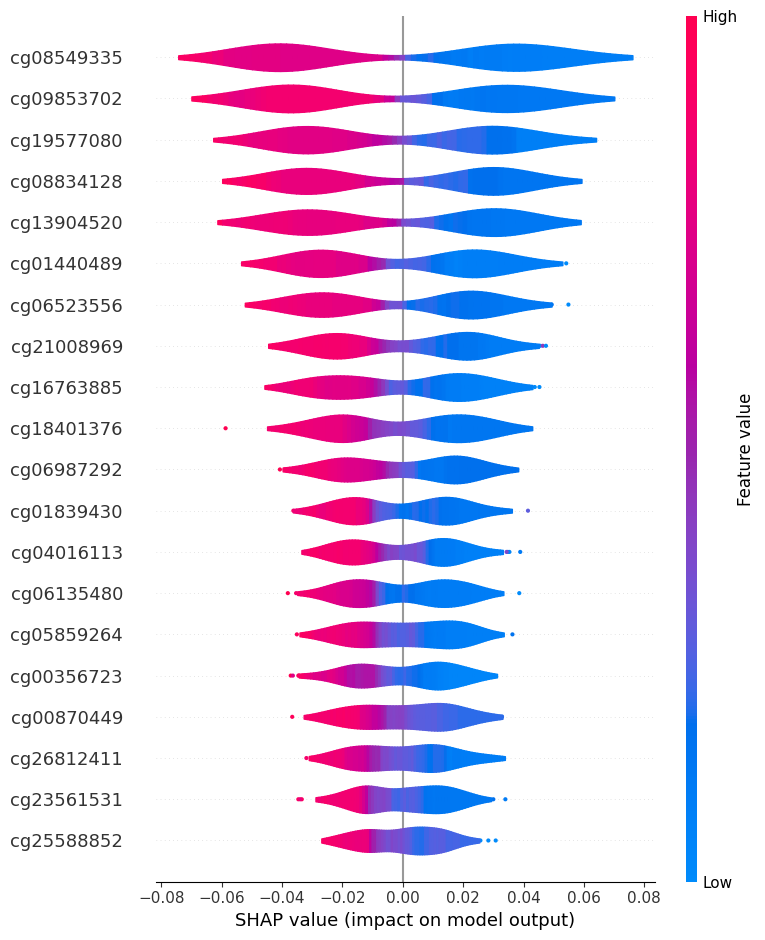

In [ ]:
from shap import TreeExplainer
from shap.maskers import Independent
from scipy.special import expit, logit

def reset_seeds():
   np.random.seed(987654321)
   python_random.seed(987654321)
   tf.random.set_seed(987654321)
   keras.utils.set_random_seed(987654321)

reset_seeds()
CancerType="LSCC"
# Head-Neck Kidney LSCC LUAD Pancreas
#HDG_GE_Profile_WGS = pd.read_csv('AS_DEGs_List_C1_P1_Baseline_Vs_1_Month_Treatment.csv',index_col=0)
#HDG_GE_Profile_WGS['Label']=pd.read_csv('C1_P1_Baseline_Vs_1_Month_Treatment.csv',index_col=0)['Label']
#HDG_GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_Estimate_DR_SL_0.75.csv",index_col=0)
#HDG_GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_Estimate_DR_SL_0.75.csv",index_col=0)
HDG_GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_Dual_Estimate_LS_XL_1_0.75.csv",index_col=0)


ClinicalData = pd.read_csv(CancerType+" "+"Proteomics Clinical.csv", index_col=0)
ClinicalData.set_index("Sample Submitter ID",inplace=True)
HDG_GE_Profile_WGS['Label']=ClinicalData['Label']
HDG_GE_Profile_WGS=HDG_GE_Profile_WGS.dropna()
Label=HDG_GE_Profile_WGS['Label']
HDG_GE_Profile_WGS=HDG_GE_Profile_WGS. iloc[:,:-1]


#ab = AdaBoostClassifier(n_estimators=500,learning_rate=1,algorithm='SAMME',random_state=987654321)
clf = svm.SVC(probability=True)
#lr=LogisticRegression(solver='liblinear', C=10.0, random_state=42)
#lda=LinearDiscriminantAnalysis()
#knn=KNeighborsClassifier(n_neighbors=5)
#model=lda.fit(HDG_GE_Profile_WGS. iloc[:,:], Label)
#model=ab.fit(HDG_GE_Profile_WGS. iloc[:,:], Label)
#model=rf.fit(HDG_GE_Profile_WGS. iloc[:,:-1], HDG_GE_Profile_WGS['Label'])
#model=knn.fit(HDG_GE_Profile_WGS. iloc[:,:],Label)
model=clf.fit( HDG_GE_Profile_WGS. iloc[:,:], Label)
#model=lr.fit( HDG_GE_Profile_WGS. iloc[:,:], Label)
#model=estimator.fit( HDG_GE_Profile_WGS. iloc[:,:], Label)
#explainer = shap.Explainer(model.predict,HDG_GE_Profile_WGS. iloc[:,:-1], max_evals = 1854721)
#shap_values = explainer(HDG_GE_Profile_WGS. iloc[:,:-1])
#expected_value = explainer.feature_names
#shap.plots.beeswarm(shap_values, color = plt.get_cmap("cool"))

#masker = Independent(data = HDG_GE_Profile_WGS. iloc[:,:])
#explainer = Explainer(model, data=masker)
#ev = explainer.expected_value

# compute SHAP values
#explainer = shap.KernelExplainer(model.predict, HDG_GE_Profile_WGS. iloc[:,:])
explainer = shap.KernelExplainer(model.predict, HDG_GE_Profile_WGS. iloc[:,:])

#explainer = shap.Explainer(estimator)
shap_values = explainer(HDG_GE_Profile_WGS)

############## visualizations #############
# Generate summary dot plot
shap.summary_plot(shap_values, HDG_GE_Profile_WGS. iloc[:,:],title="SHAP summary plot", plot_type="violin")

# Generate summary bar plot
#shap.summary_plot(shap_values, HDG_GE_Profile_WGS. iloc[:,:],plot_type="bar")

# Generate waterfall plot
#shap.plots.waterfall(shap_values[0])

# Generate decision plot
#shap.decision_plot(explainer.expected_value, explainer.shap_values(HDG_GE_Profile_WGS),HDG_GE_Profile_WGS.columns)

# Generate force plot - Multiple rows
#import matplotlib.pyplot as plt
#shap.initjs()
#shap.force_plot(shap_values[:])
#plt.savefig('mygraph.pdf', format='pdf', dpi=600, bbox_inches='tight')
#plt.savefig('scratch.png')


  0%|          | 0/180 [00:00<?, ?it/s]

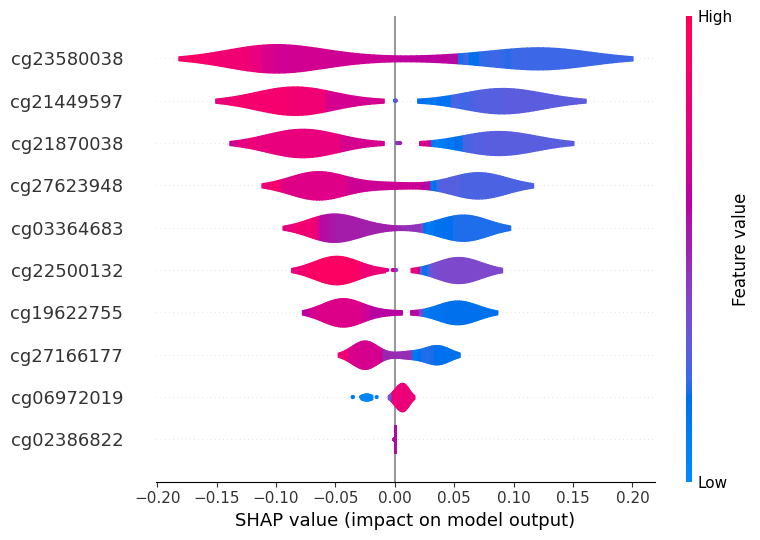

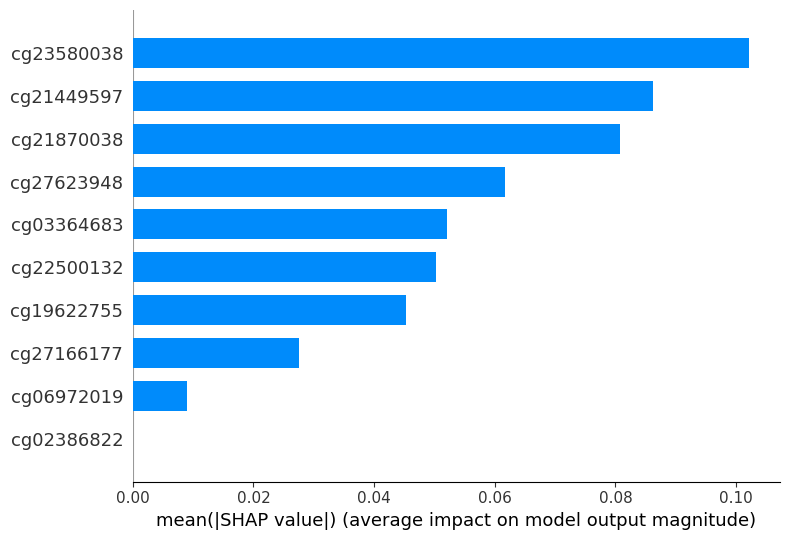

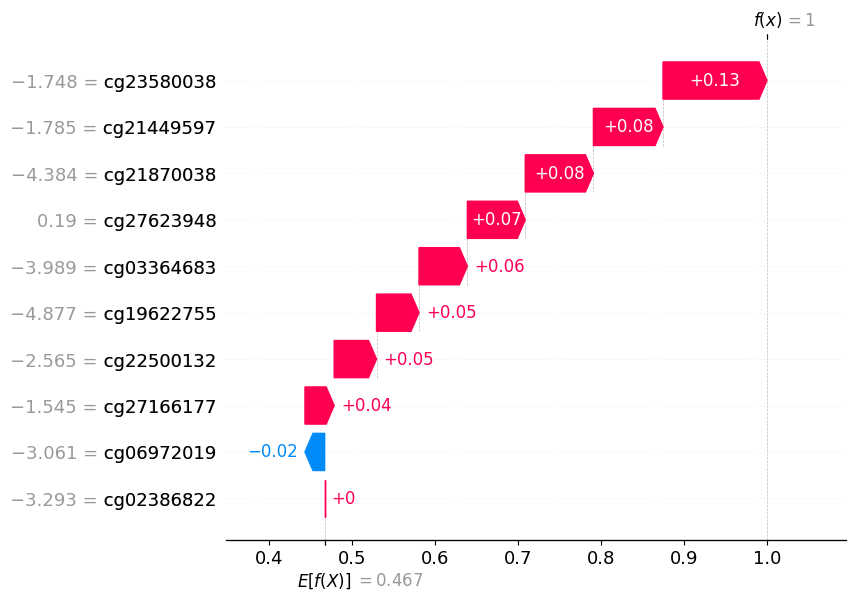

  0%|          | 0/180 [00:00<?, ?it/s]

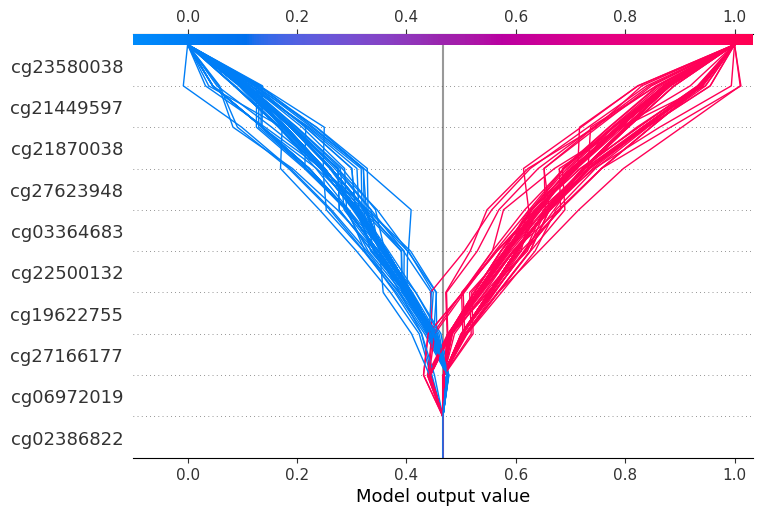

In [ ]:
from shap import TreeExplainer
from shap.maskers import Independent
from scipy.special import expit, logit

def reset_seeds():
   np.random.seed(987654321)
   python_random.seed(987654321)
   tf.random.set_seed(987654321)
   keras.utils.set_random_seed(987654321)

reset_seeds()

#HDG_GE_Profile_WGS = pd.read_csv('AS_DEGs_List_C1_P1_Baseline_Vs_1_Month_Treatment.csv',index_col=0)
#HDG_GE_Profile_WGS['Label']=pd.read_csv('C1_P1_Baseline_Vs_1_Month_Treatment.csv',index_col=0)['Label']

HDG_GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_Estimate_LS_DRL_0.75.csv",index_col=0)
ClinicalData = pd.read_csv(CancerType+" "+"Proteomics Clinical.csv", index_col=0)
ClinicalData.set_index("Sample Submitter ID",inplace=True)
HDG_GE_Profile_WGS['Label']=ClinicalData['Label']
HDG_GE_Profile_WGS=HDG_GE_Profile_WGS.dropna()
Label=HDG_GE_Profile_WGS['Label']
HDG_GE_Profile_WGS=HDG_GE_Profile_WGS. iloc[:,:-1]


ab = AdaBoostClassifier(n_estimators=500,learning_rate=1,algorithm='SAMME',random_state=987654321)
#clf = svm.SVC(kernel='linear',probability=True)
#lr=LogisticRegression(solver='liblinear', C=10.0, random_state=42)
#lda=LinearDiscriminantAnalysis()
#model=lda.fit(HDG_GE_Profile_WGS. iloc[:,:], Label)
model=ab.fit(HDG_GE_Profile_WGS. iloc[:,:], Label)
#model=rf.fit(HDG_GE_Profile_WGS. iloc[:,:-1], HDG_GE_Profile_WGS['Label'])
#model=knn.fit(HDG_GE_Profile_WGS. iloc[:,:-1], HDG_GE_Profile_WGS['Label'])
#model=clf.fit( HDG_GE_Profile_WGS. iloc[:,:], Label)
#model=lr.fit( HDG_GE_Profile_WGS. iloc[:,:], Label)
#explainer = shap.Explainer(model.predict,HDG_GE_Profile_WGS. iloc[:,:-1], max_evals = 1854721)
#shap_values = explainer(HDG_GE_Profile_WGS. iloc[:,:-1])
#expected_value = explainer.feature_names
#shap.plots.beeswarm(shap_values, color = plt.get_cmap("cool"))

#masker = Independent(data = HDG_GE_Profile_WGS. iloc[:,:])
#explainer = Explainer(model, data=masker)
#ev = explainer.expected_value

# compute SHAP values
#explainer = shap.KernelExplainer(model.predict, HDG_GE_Profile_WGS. iloc[:,:])
explainer = shap.KernelExplainer(model.predict, HDG_GE_Profile_WGS. iloc[:,:])

#explainer = shap.Explainer(estimator)
shap_values = explainer(HDG_GE_Profile_WGS)

############## visualizations #############
# Generate summary dot plot
shap.summary_plot(shap_values, HDG_GE_Profile_WGS. iloc[:,:],title="SHAP summary plot", plot_type="violin")

# Generate summary bar plot
shap.summary_plot(shap_values, HDG_GE_Profile_WGS. iloc[:,:],plot_type="bar")

# Generate waterfall plot
shap.plots.waterfall(shap_values[0])

# Generate decision plot
shap.decision_plot(explainer.expected_value, explainer.shap_values(HDG_GE_Profile_WGS),HDG_GE_Profile_WGS.columns)

# Generate force plot - Multiple rows
#import matplotlib.pyplot as plt
shap.initjs()
shap.force_plot(shap_values[:])
#plt.savefig('mygraph.pdf', format='pdf', dpi=600, bbox_inches='tight')
#plt.savefig('scratch.png')


  0%|          | 0/180 [00:00<?, ?it/s]

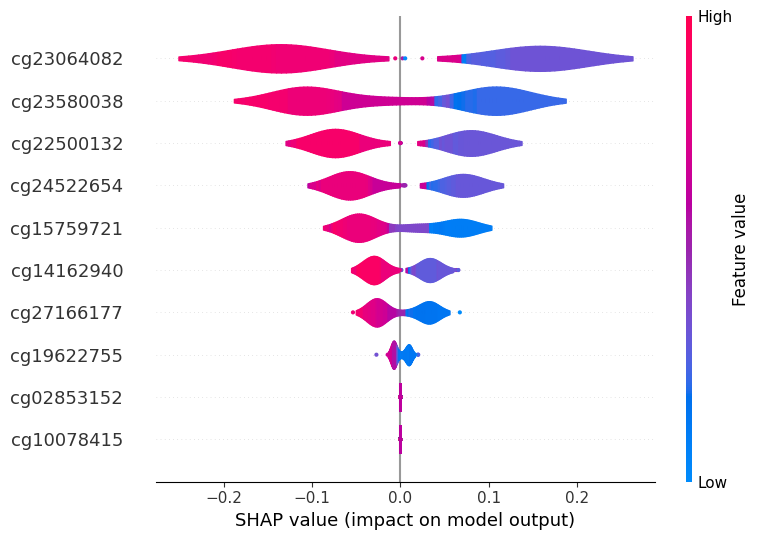

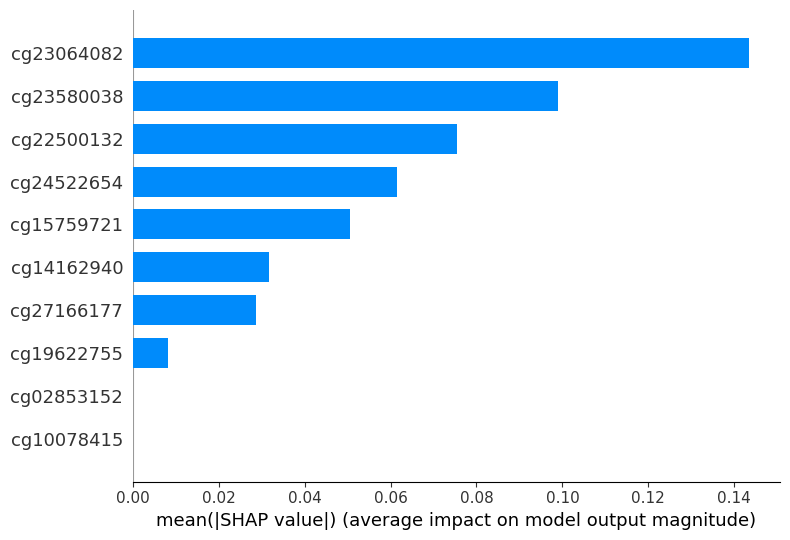

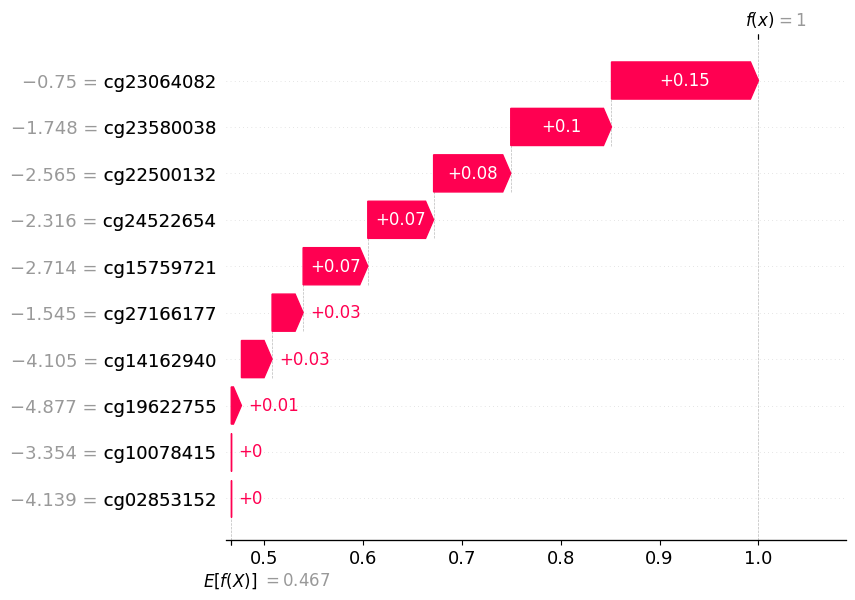

  0%|          | 0/180 [00:00<?, ?it/s]

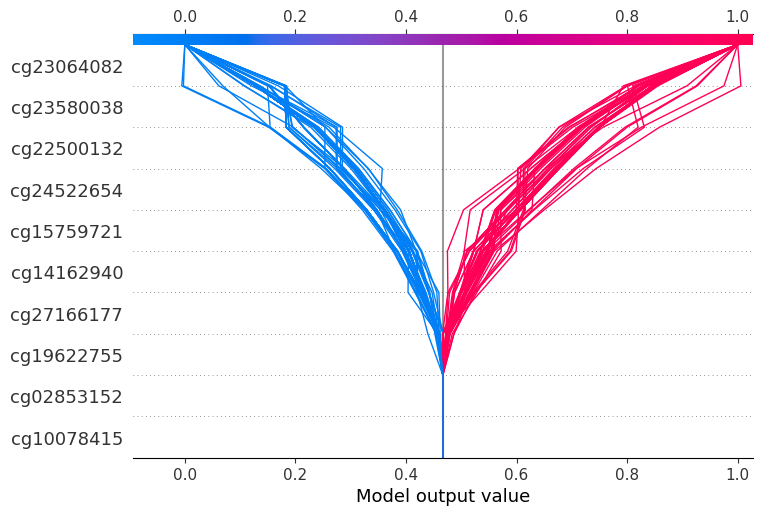

In [ ]:
from shap import TreeExplainer
from shap.maskers import Independent
from scipy.special import expit, logit

def reset_seeds():
   np.random.seed(987654321)
   python_random.seed(987654321)
   tf.random.set_seed(987654321)
   keras.utils.set_random_seed(987654321)

reset_seeds()

#HDG_GE_Profile_WGS = pd.read_csv('AS_DEGs_List_C1_P1_Baseline_Vs_1_Month_Treatment.csv',index_col=0)
#HDG_GE_Profile_WGS['Label']=pd.read_csv('C1_P1_Baseline_Vs_1_Month_Treatment.csv',index_col=0)['Label']

HDG_GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_Estimate_LS_SL_0.75.csv",index_col=0)
ClinicalData = pd.read_csv(CancerType+" "+"Proteomics Clinical.csv", index_col=0)
ClinicalData.set_index("Sample Submitter ID",inplace=True)
HDG_GE_Profile_WGS['Label']=ClinicalData['Label']
HDG_GE_Profile_WGS=HDG_GE_Profile_WGS.dropna()
Label=HDG_GE_Profile_WGS['Label']
HDG_GE_Profile_WGS=HDG_GE_Profile_WGS. iloc[:,:-1]


ab = AdaBoostClassifier(n_estimators=500,learning_rate=1,algorithm='SAMME',random_state=987654321)
#clf = svm.SVC(kernel='linear',probability=True)
#lr=LogisticRegression(solver='liblinear', C=10.0, random_state=42)
#lda=LinearDiscriminantAnalysis()
#model=lda.fit(HDG_GE_Profile_WGS. iloc[:,:], Label)
model=ab.fit(HDG_GE_Profile_WGS. iloc[:,:], Label)
#model=rf.fit(HDG_GE_Profile_WGS. iloc[:,:-1], HDG_GE_Profile_WGS['Label'])
#model=knn.fit(HDG_GE_Profile_WGS. iloc[:,:-1], HDG_GE_Profile_WGS['Label'])
#model=clf.fit( HDG_GE_Profile_WGS. iloc[:,:], Label)
#model=lr.fit( HDG_GE_Profile_WGS. iloc[:,:], Label)
#explainer = shap.Explainer(model.predict,HDG_GE_Profile_WGS. iloc[:,:-1], max_evals = 1854721)
#shap_values = explainer(HDG_GE_Profile_WGS. iloc[:,:-1])
#expected_value = explainer.feature_names
#shap.plots.beeswarm(shap_values, color = plt.get_cmap("cool"))

#masker = Independent(data = HDG_GE_Profile_WGS. iloc[:,:])
#explainer = Explainer(model, data=masker)
#ev = explainer.expected_value

# compute SHAP values
#explainer = shap.KernelExplainer(model.predict, HDG_GE_Profile_WGS. iloc[:,:])
explainer = shap.KernelExplainer(model.predict, HDG_GE_Profile_WGS. iloc[:,:])

#explainer = shap.Explainer(estimator)
shap_values = explainer(HDG_GE_Profile_WGS)

############## visualizations #############
# Generate summary dot plot
shap.summary_plot(shap_values, HDG_GE_Profile_WGS. iloc[:,:],title="SHAP summary plot", plot_type="violin")

# Generate summary bar plot
shap.summary_plot(shap_values, HDG_GE_Profile_WGS. iloc[:,:],plot_type="bar")

# Generate waterfall plot
shap.plots.waterfall(shap_values[0])

# Generate decision plot
shap.decision_plot(explainer.expected_value, explainer.shap_values(HDG_GE_Profile_WGS),HDG_GE_Profile_WGS.columns)

# Generate force plot - Multiple rows
#import matplotlib.pyplot as plt
shap.initjs()
shap.force_plot(shap_values[:])
#plt.savefig('mygraph.pdf', format='pdf', dpi=600, bbox_inches='tight')
#plt.savefig('scratch.png')


  0%|          | 0/180 [00:00<?, ?it/s]

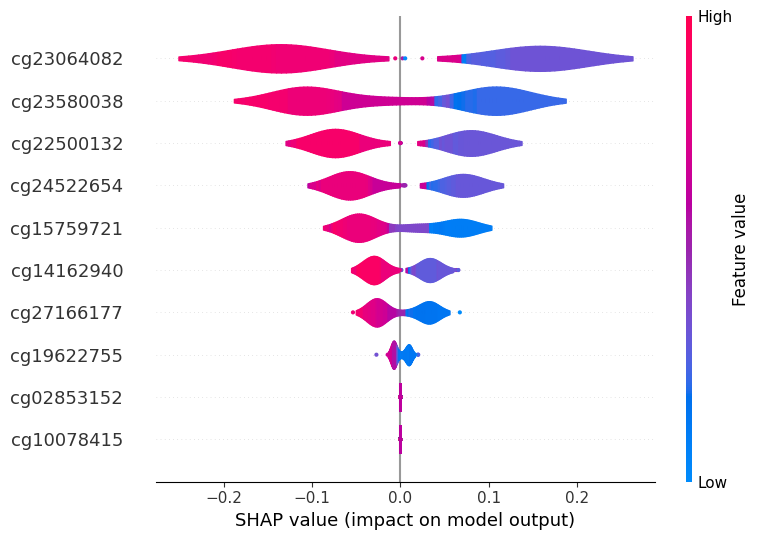

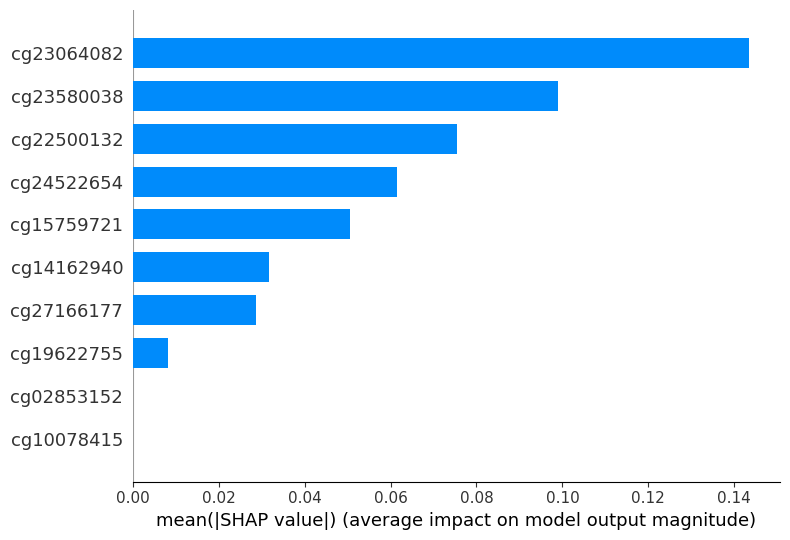

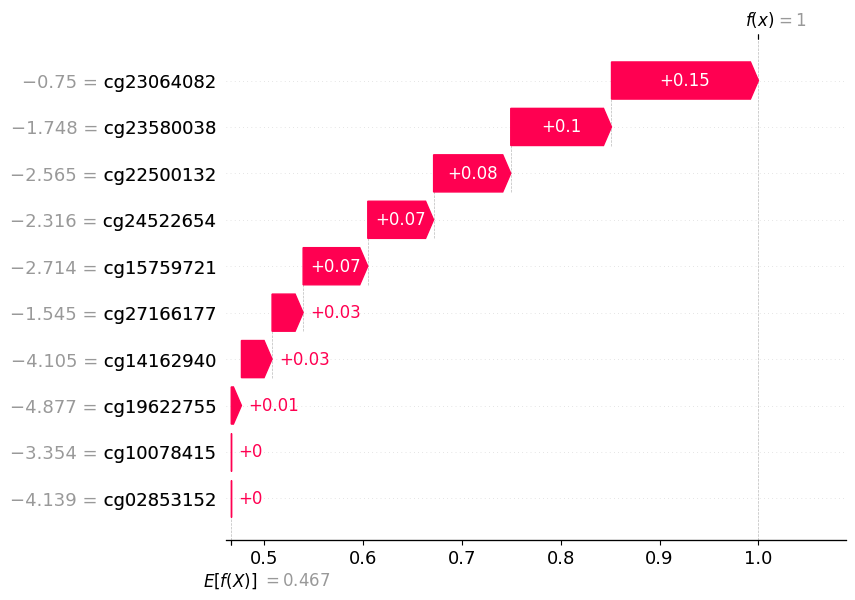

  0%|          | 0/180 [00:00<?, ?it/s]

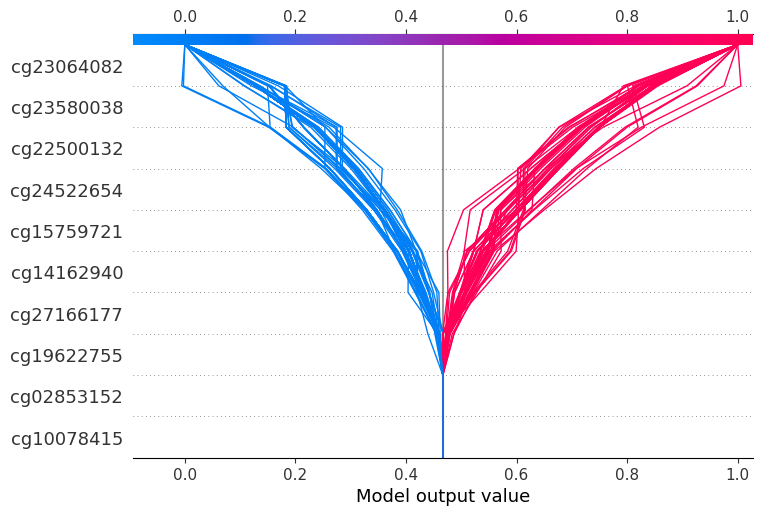

In [ ]:
from shap import TreeExplainer
from shap.maskers import Independent
from scipy.special import expit, logit

def reset_seeds():
   np.random.seed(987654321)
   python_random.seed(987654321)
   tf.random.set_seed(987654321)
   keras.utils.set_random_seed(987654321)

reset_seeds()

#HDG_GE_Profile_WGS = pd.read_csv('AS_DEGs_List_C1_P1_Baseline_Vs_1_Month_Treatment.csv',index_col=0)
#HDG_GE_Profile_WGS['Label']=pd.read_csv('C1_P1_Baseline_Vs_1_Month_Treatment.csv',index_col=0)['Label']

HDG_GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_Estimate_LS_TL_0.75.csv",index_col=0)
ClinicalData = pd.read_csv(CancerType+" "+"Proteomics Clinical.csv", index_col=0)
ClinicalData.set_index("Sample Submitter ID",inplace=True)
HDG_GE_Profile_WGS['Label']=ClinicalData['Label']
HDG_GE_Profile_WGS=HDG_GE_Profile_WGS.dropna()
Label=HDG_GE_Profile_WGS['Label']
HDG_GE_Profile_WGS=HDG_GE_Profile_WGS. iloc[:,:-1]


ab = AdaBoostClassifier(n_estimators=500,learning_rate=1,algorithm='SAMME',random_state=987654321)
#clf = svm.SVC(kernel='linear',probability=True)
#lr=LogisticRegression(solver='liblinear', C=10.0, random_state=42)
#lda=LinearDiscriminantAnalysis()
#model=lda.fit(HDG_GE_Profile_WGS. iloc[:,:], Label)
model=ab.fit(HDG_GE_Profile_WGS. iloc[:,:], Label)
#model=rf.fit(HDG_GE_Profile_WGS. iloc[:,:-1], HDG_GE_Profile_WGS['Label'])
#model=knn.fit(HDG_GE_Profile_WGS. iloc[:,:-1], HDG_GE_Profile_WGS['Label'])
#model=clf.fit( HDG_GE_Profile_WGS. iloc[:,:], Label)
#model=lr.fit( HDG_GE_Profile_WGS. iloc[:,:], Label)
#explainer = shap.Explainer(model.predict,HDG_GE_Profile_WGS. iloc[:,:-1], max_evals = 1854721)
#shap_values = explainer(HDG_GE_Profile_WGS. iloc[:,:-1])
#expected_value = explainer.feature_names
#shap.plots.beeswarm(shap_values, color = plt.get_cmap("cool"))

#masker = Independent(data = HDG_GE_Profile_WGS. iloc[:,:])
#explainer = Explainer(model, data=masker)
#ev = explainer.expected_value

# compute SHAP values
#explainer = shap.KernelExplainer(model.predict, HDG_GE_Profile_WGS. iloc[:,:])
explainer = shap.KernelExplainer(model.predict, HDG_GE_Profile_WGS. iloc[:,:])

#explainer = shap.Explainer(estimator)
shap_values = explainer(HDG_GE_Profile_WGS)

############## visualizations #############
# Generate summary dot plot
shap.summary_plot(shap_values, HDG_GE_Profile_WGS. iloc[:,:],title="SHAP summary plot", plot_type="violin")

# Generate summary bar plot
shap.summary_plot(shap_values, HDG_GE_Profile_WGS. iloc[:,:],plot_type="bar")

# Generate waterfall plot
shap.plots.waterfall(shap_values[0])

# Generate decision plot
shap.decision_plot(explainer.expected_value, explainer.shap_values(HDG_GE_Profile_WGS),HDG_GE_Profile_WGS.columns)

# Generate force plot - Multiple rows
#import matplotlib.pyplot as plt
shap.initjs()
shap.force_plot(shap_values[:])
#plt.savefig('mygraph.pdf', format='pdf', dpi=600, bbox_inches='tight')
#plt.savefig('scratch.png')


  0%|          | 0/180 [00:00<?, ?it/s]

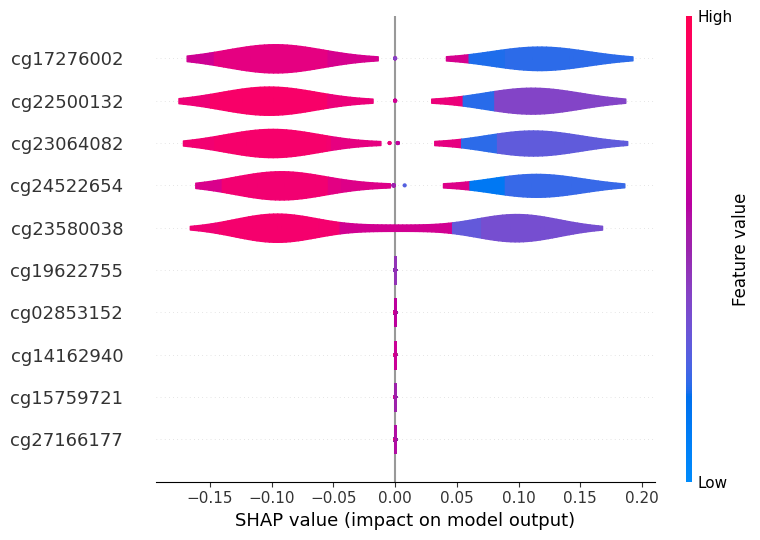

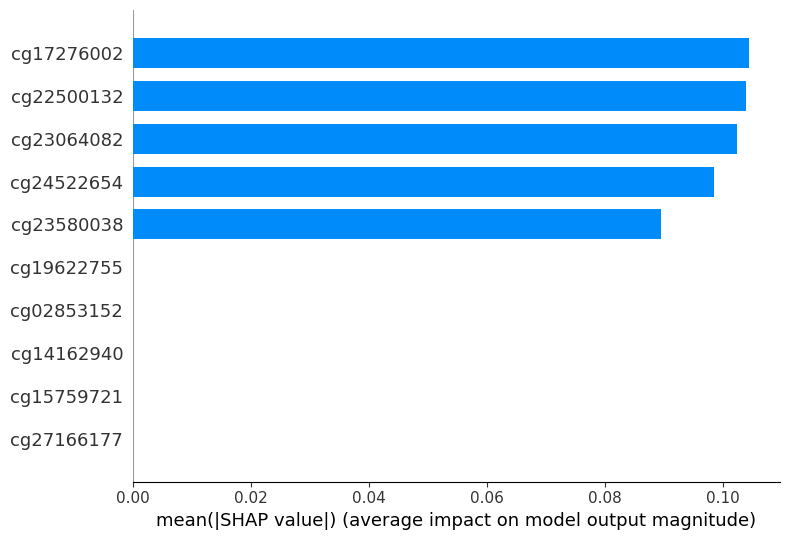

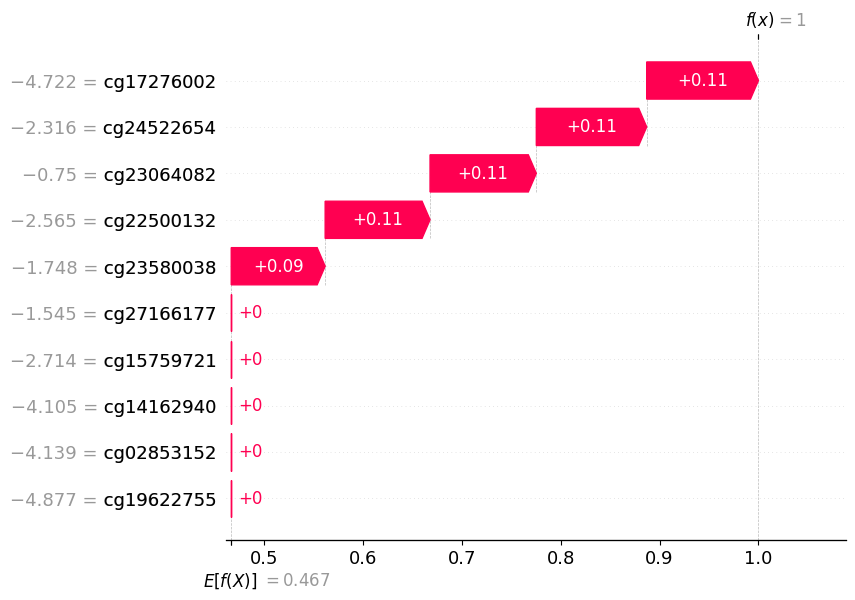

  0%|          | 0/180 [00:00<?, ?it/s]

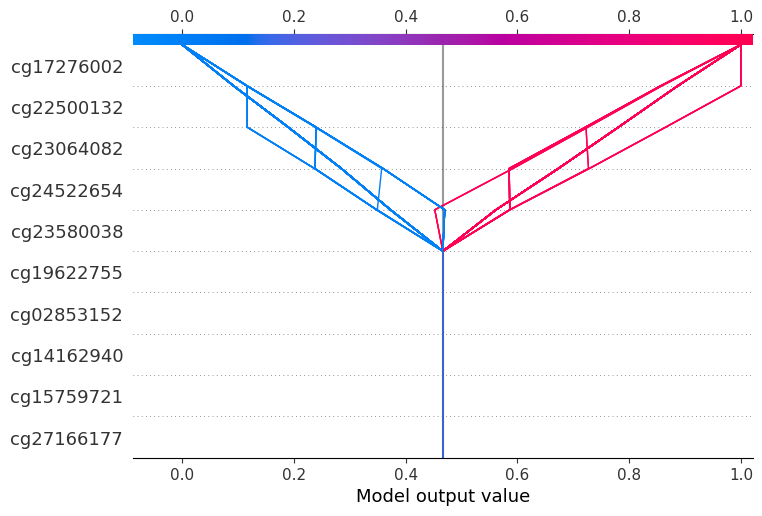

In [ ]:
from shap import TreeExplainer
from shap.maskers import Independent
from scipy.special import expit, logit

def reset_seeds():
   np.random.seed(987654321)
   python_random.seed(987654321)
   tf.random.set_seed(987654321)
   keras.utils.set_random_seed(987654321)

reset_seeds()

#HDG_GE_Profile_WGS = pd.read_csv('AS_DEGs_List_C1_P1_Baseline_Vs_1_Month_Treatment.csv',index_col=0)
#HDG_GE_Profile_WGS['Label']=pd.read_csv('C1_P1_Baseline_Vs_1_Month_Treatment.csv',index_col=0)['Label']

HDG_GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_Estimate_LS_XL_0.75.csv",index_col=0)
ClinicalData = pd.read_csv(CancerType+" "+"Proteomics Clinical.csv", index_col=0)
ClinicalData.set_index("Sample Submitter ID",inplace=True)
HDG_GE_Profile_WGS['Label']=ClinicalData['Label']
HDG_GE_Profile_WGS=HDG_GE_Profile_WGS.dropna()
Label=HDG_GE_Profile_WGS['Label']
HDG_GE_Profile_WGS=HDG_GE_Profile_WGS. iloc[:,:-1]


ab = AdaBoostClassifier(n_estimators=500,learning_rate=1,algorithm='SAMME',random_state=987654321)
#clf = svm.SVC(kernel='linear',probability=True)
#lr=LogisticRegression(solver='liblinear', C=10.0, random_state=42)
#lda=LinearDiscriminantAnalysis()
#model=lda.fit(HDG_GE_Profile_WGS. iloc[:,:], Label)
model=ab.fit(HDG_GE_Profile_WGS. iloc[:,:], Label)
#model=rf.fit(HDG_GE_Profile_WGS. iloc[:,:-1], HDG_GE_Profile_WGS['Label'])
#model=knn.fit(HDG_GE_Profile_WGS. iloc[:,:-1], HDG_GE_Profile_WGS['Label'])
#model=clf.fit( HDG_GE_Profile_WGS. iloc[:,:], Label)
#model=lr.fit( HDG_GE_Profile_WGS. iloc[:,:], Label)
#explainer = shap.Explainer(model.predict,HDG_GE_Profile_WGS. iloc[:,:-1], max_evals = 1854721)
#shap_values = explainer(HDG_GE_Profile_WGS. iloc[:,:-1])
#expected_value = explainer.feature_names
#shap.plots.beeswarm(shap_values, color = plt.get_cmap("cool"))

#masker = Independent(data = HDG_GE_Profile_WGS. iloc[:,:])
#explainer = Explainer(model, data=masker)
#ev = explainer.expected_value

# compute SHAP values
#explainer = shap.KernelExplainer(model.predict, HDG_GE_Profile_WGS. iloc[:,:])
explainer = shap.KernelExplainer(model.predict, HDG_GE_Profile_WGS. iloc[:,:])

#explainer = shap.Explainer(estimator)
shap_values = explainer(HDG_GE_Profile_WGS)

############## visualizations #############
# Generate summary dot plot
shap.summary_plot(shap_values, HDG_GE_Profile_WGS. iloc[:,:],title="SHAP summary plot", plot_type="violin")

# Generate summary bar plot
shap.summary_plot(shap_values, HDG_GE_Profile_WGS. iloc[:,:],plot_type="bar")

# Generate waterfall plot
shap.plots.waterfall(shap_values[0])

# Generate decision plot
shap.decision_plot(explainer.expected_value, explainer.shap_values(HDG_GE_Profile_WGS),HDG_GE_Profile_WGS.columns)

# Generate force plot - Multiple rows
#import matplotlib.pyplot as plt
shap.initjs()
shap.force_plot(shap_values[:])
#plt.savefig('mygraph.pdf', format='pdf', dpi=600, bbox_inches='tight')
#plt.savefig('scratch.png')


  0%|          | 0/180 [00:00<?, ?it/s]

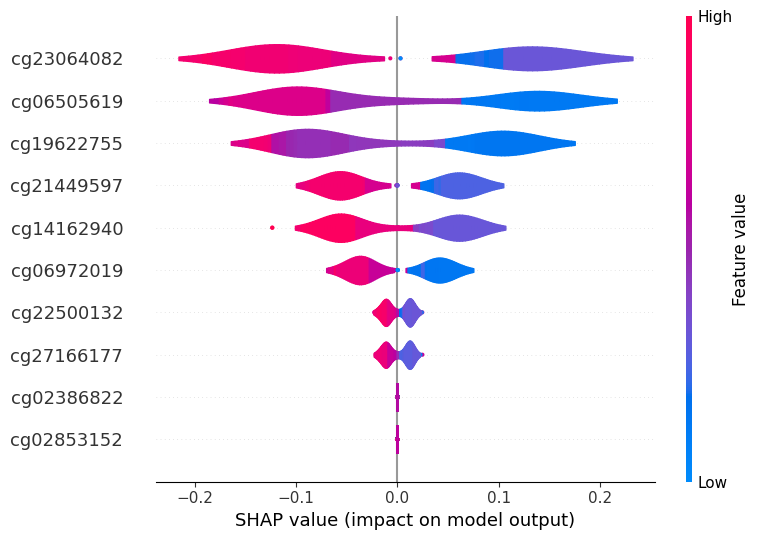

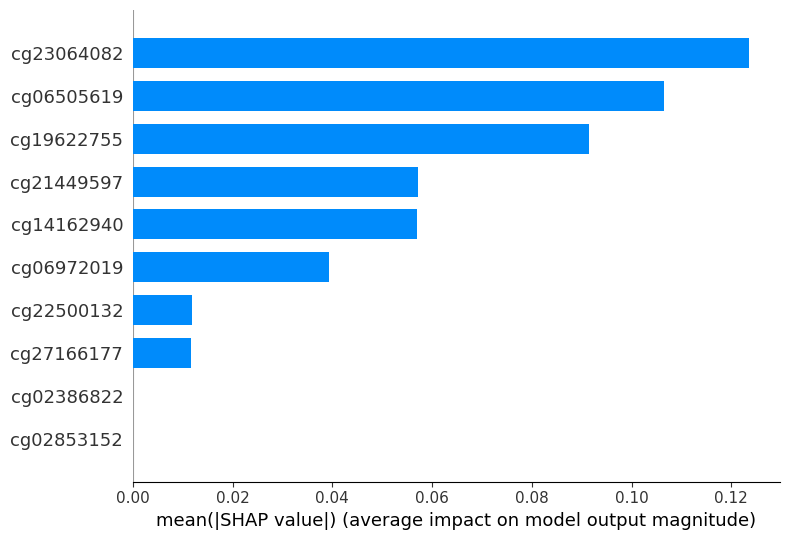

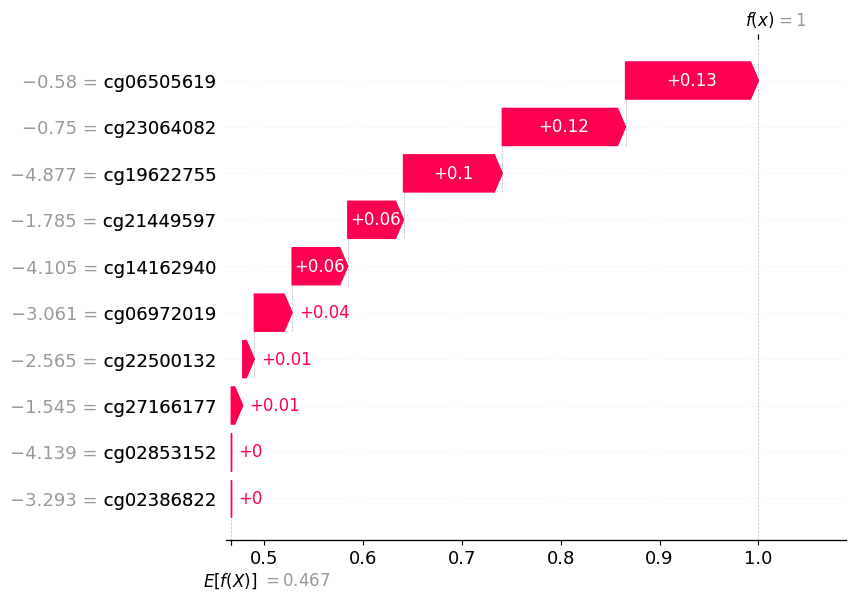

  0%|          | 0/180 [00:00<?, ?it/s]

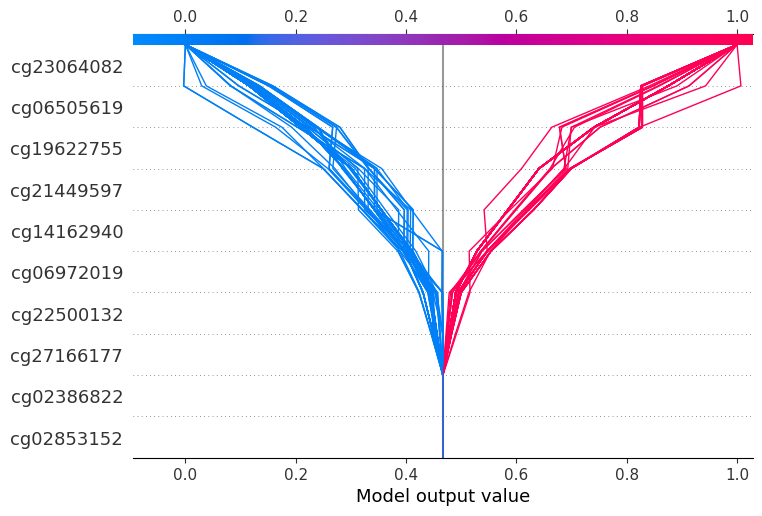

In [ ]:
from shap import TreeExplainer
from shap.maskers import Independent
from scipy.special import expit, logit

def reset_seeds():
   np.random.seed(987654321)
   python_random.seed(987654321)
   tf.random.set_seed(987654321)
   keras.utils.set_random_seed(987654321)

reset_seeds()

#HDG_GE_Profile_WGS = pd.read_csv('AS_DEGs_List_C1_P1_Baseline_Vs_1_Month_Treatment.csv',index_col=0)
#HDG_GE_Profile_WGS['Label']=pd.read_csv('C1_P1_Baseline_Vs_1_Month_Treatment.csv',index_col=0)['Label']

HDG_GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_Estimate_LS_CFDML_0.75.csv",index_col=0)
ClinicalData = pd.read_csv(CancerType+" "+"Proteomics Clinical.csv", index_col=0)
ClinicalData.set_index("Sample Submitter ID",inplace=True)
HDG_GE_Profile_WGS['Label']=ClinicalData['Label']
HDG_GE_Profile_WGS=HDG_GE_Profile_WGS.dropna()
Label=HDG_GE_Profile_WGS['Label']
HDG_GE_Profile_WGS=HDG_GE_Profile_WGS. iloc[:,:-1]


ab = AdaBoostClassifier(n_estimators=500,learning_rate=1,algorithm='SAMME',random_state=987654321)
#clf = svm.SVC(kernel='linear',probability=True)
#lr=LogisticRegression(solver='liblinear', C=10.0, random_state=42)
#lda=LinearDiscriminantAnalysis()
#model=lda.fit(HDG_GE_Profile_WGS. iloc[:,:], Label)
model=ab.fit(HDG_GE_Profile_WGS. iloc[:,:], Label)
#model=rf.fit(HDG_GE_Profile_WGS. iloc[:,:-1], HDG_GE_Profile_WGS['Label'])
#model=knn.fit(HDG_GE_Profile_WGS. iloc[:,:-1], HDG_GE_Profile_WGS['Label'])
#model=clf.fit( HDG_GE_Profile_WGS. iloc[:,:], Label)
#model=lr.fit( HDG_GE_Profile_WGS. iloc[:,:], Label)
#explainer = shap.Explainer(model.predict,HDG_GE_Profile_WGS. iloc[:,:-1], max_evals = 1854721)
#shap_values = explainer(HDG_GE_Profile_WGS. iloc[:,:-1])
#expected_value = explainer.feature_names
#shap.plots.beeswarm(shap_values, color = plt.get_cmap("cool"))

#masker = Independent(data = HDG_GE_Profile_WGS. iloc[:,:])
#explainer = Explainer(model, data=masker)
#ev = explainer.expected_value

# compute SHAP values
#explainer = shap.KernelExplainer(model.predict, HDG_GE_Profile_WGS. iloc[:,:])
explainer = shap.KernelExplainer(model.predict, HDG_GE_Profile_WGS. iloc[:,:])

#explainer = shap.Explainer(estimator)
shap_values = explainer(HDG_GE_Profile_WGS)

############## visualizations #############
# Generate summary dot plot
shap.summary_plot(shap_values, HDG_GE_Profile_WGS. iloc[:,:],title="SHAP summary plot", plot_type="violin")

# Generate summary bar plot
shap.summary_plot(shap_values, HDG_GE_Profile_WGS. iloc[:,:],plot_type="bar")

# Generate waterfall plot
shap.plots.waterfall(shap_values[0])

# Generate decision plot
shap.decision_plot(explainer.expected_value, explainer.shap_values(HDG_GE_Profile_WGS),HDG_GE_Profile_WGS.columns)

# Generate force plot - Multiple rows
#import matplotlib.pyplot as plt
shap.initjs()
shap.force_plot(shap_values[:])
#plt.savefig('mygraph.pdf', format='pdf', dpi=600, bbox_inches='tight')
#plt.savefig('scratch.png')


  0%|          | 0/180 [00:00<?, ?it/s]

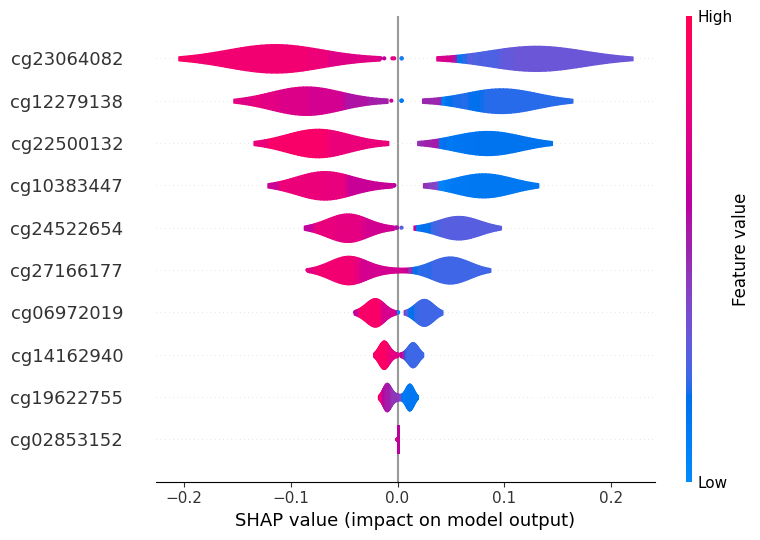

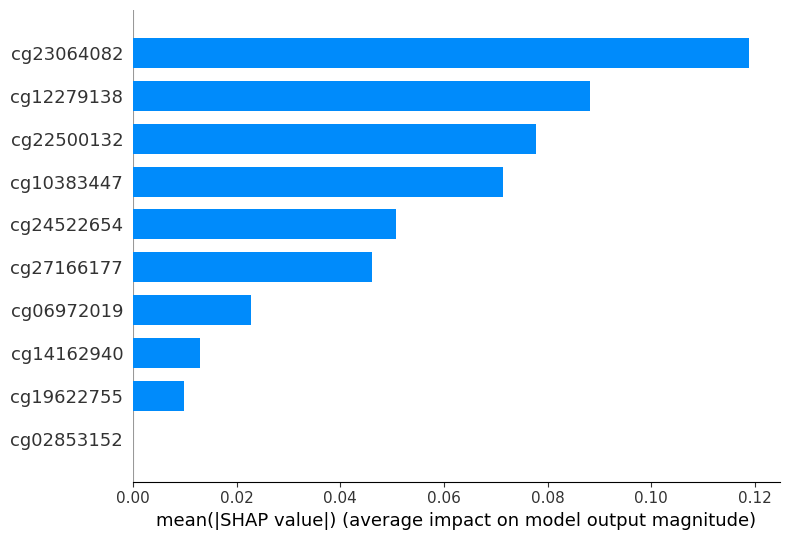

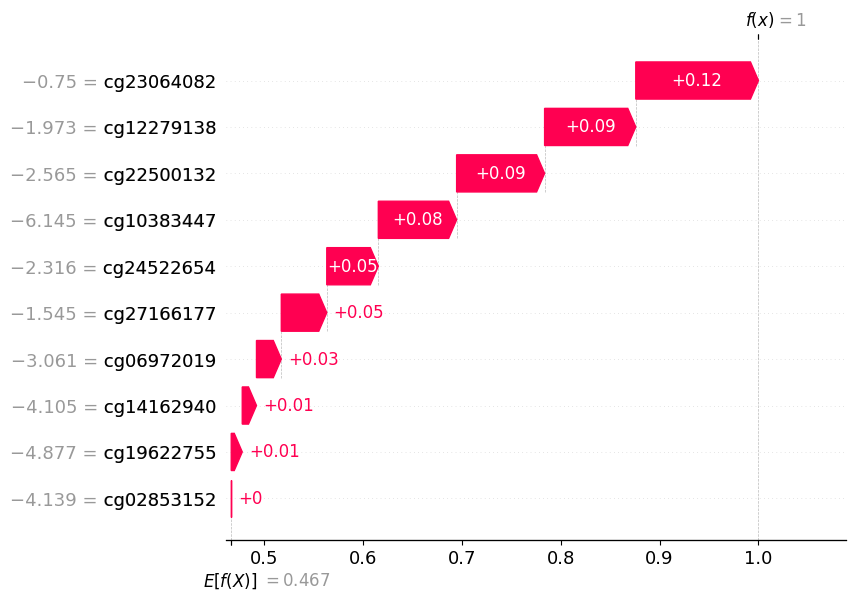

  0%|          | 0/180 [00:00<?, ?it/s]

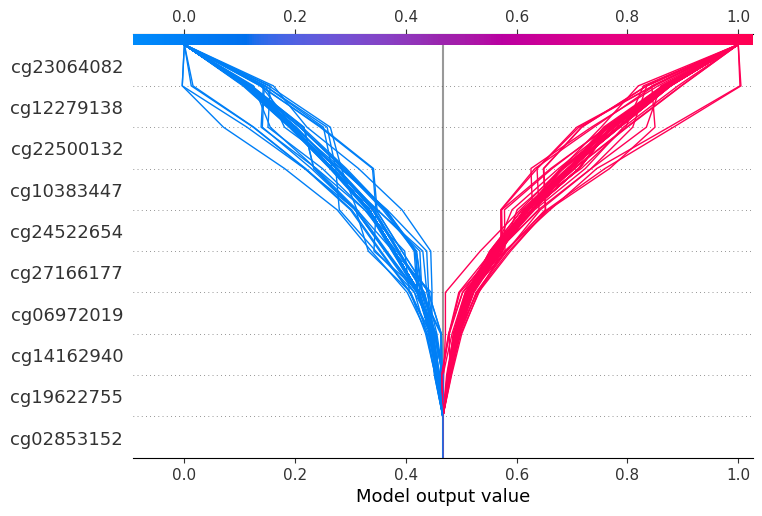

In [ ]:
from shap import TreeExplainer
from shap.maskers import Independent
from scipy.special import expit, logit

def reset_seeds():
   np.random.seed(987654321)
   python_random.seed(987654321)
   tf.random.set_seed(987654321)
   keras.utils.set_random_seed(987654321)

reset_seeds()

#HDG_GE_Profile_WGS = pd.read_csv('AS_DEGs_List_C1_P1_Baseline_Vs_1_Month_Treatment.csv',index_col=0)
#HDG_GE_Profile_WGS['Label']=pd.read_csv('C1_P1_Baseline_Vs_1_Month_Treatment.csv',index_col=0)['Label']

HDG_GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_Estimate_LS_DML_0.75.csv",index_col=0)
ClinicalData = pd.read_csv(CancerType+" "+"Proteomics Clinical.csv", index_col=0)
ClinicalData.set_index("Sample Submitter ID",inplace=True)
HDG_GE_Profile_WGS['Label']=ClinicalData['Label']
HDG_GE_Profile_WGS=HDG_GE_Profile_WGS.dropna()
Label=HDG_GE_Profile_WGS['Label']
HDG_GE_Profile_WGS=HDG_GE_Profile_WGS. iloc[:,:-1]


ab = AdaBoostClassifier(n_estimators=500,learning_rate=1,algorithm='SAMME',random_state=987654321)
#clf = svm.SVC(kernel='linear',probability=True)
#lr=LogisticRegression(solver='liblinear', C=10.0, random_state=42)
#lda=LinearDiscriminantAnalysis()
#model=lda.fit(HDG_GE_Profile_WGS. iloc[:,:], Label)
model=ab.fit(HDG_GE_Profile_WGS. iloc[:,:], Label)
#model=rf.fit(HDG_GE_Profile_WGS. iloc[:,:-1], HDG_GE_Profile_WGS['Label'])
#model=knn.fit(HDG_GE_Profile_WGS. iloc[:,:-1], HDG_GE_Profile_WGS['Label'])
#model=clf.fit( HDG_GE_Profile_WGS. iloc[:,:], Label)
#model=lr.fit( HDG_GE_Profile_WGS. iloc[:,:], Label)
#explainer = shap.Explainer(model.predict,HDG_GE_Profile_WGS. iloc[:,:-1], max_evals = 1854721)
#shap_values = explainer(HDG_GE_Profile_WGS. iloc[:,:-1])
#expected_value = explainer.feature_names
#shap.plots.beeswarm(shap_values, color = plt.get_cmap("cool"))

#masker = Independent(data = HDG_GE_Profile_WGS. iloc[:,:])
#explainer = Explainer(model, data=masker)
#ev = explainer.expected_value

# compute SHAP values
#explainer = shap.KernelExplainer(model.predict, HDG_GE_Profile_WGS. iloc[:,:])
explainer = shap.KernelExplainer(model.predict, HDG_GE_Profile_WGS. iloc[:,:])

#explainer = shap.Explainer(estimator)
shap_values = explainer(HDG_GE_Profile_WGS)

############## visualizations #############
# Generate summary dot plot
shap.summary_plot(shap_values, HDG_GE_Profile_WGS. iloc[:,:],title="SHAP summary plot", plot_type="violin")

# Generate summary bar plot
shap.summary_plot(shap_values, HDG_GE_Profile_WGS. iloc[:,:],plot_type="bar")

# Generate waterfall plot
shap.plots.waterfall(shap_values[0])

# Generate decision plot
shap.decision_plot(explainer.expected_value, explainer.shap_values(HDG_GE_Profile_WGS),HDG_GE_Profile_WGS.columns)

# Generate force plot - Multiple rows
#import matplotlib.pyplot as plt
shap.initjs()
shap.force_plot(shap_values[:])
#plt.savefig('mygraph.pdf', format='pdf', dpi=600, bbox_inches='tight')
#plt.savefig('scratch.png')


When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.


<Axes: xlabel='Label'>

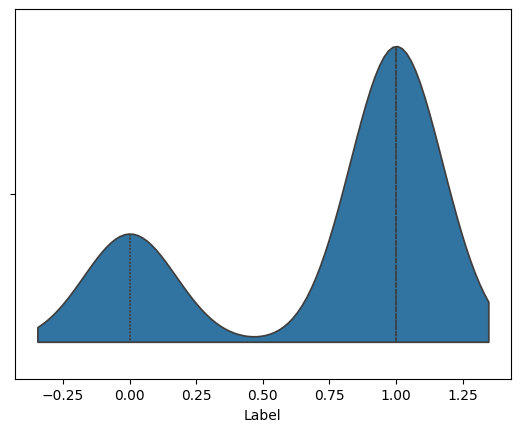

In [ ]:
sns.violinplot(data=HDG_GE_Profile_WGS, x=Label, split=True, inner="quart")

In [ ]:
!pip install lime
import lime
import lime.lime_tabular
import numpy as np

############## create explainer ###########
# we use the dataframes splits created above for SHAP
explainer = lime.lime_tabular.LimeTabularExplainer(GE_Profile_WGS. iloc[:,:-1].to_numpy(), feature_names=GE_Profile_WGS. iloc[:,:-1].columns, class_names=['0','1'], verbose=True)

############## visualizations #############
def prob(data):
    return np.array(list(zip(1-model.predict(GE_Profile_WGS. iloc[:,:-1]),model.predict(GE_Profile_WGS. iloc[:,:-1]))))
dataset= GE_Profile_WGS. iloc[:,:-1]
exp = explainer.explain_instance(dataset.iloc[5], model.predict_proba,num_features=10)
exp.show_in_notebook(show_table=True)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 11.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283839 sha256=7b60598d3d312626b25b76ec9a338bf09f6aae388728a2afdfc5799feb0f5781
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime
Intercept 0.481701380615569
Prediction_local [0.53539423]
Right: 0.46339902317926407


X does not have valid feature names, but LinearDiscriminantAnalysis was fitted with feature names


#### Association Scoring

#####Epigenetics Association Scoring

In [ ]:
import scipy.stats as stats

EpigenticsExpressed_transpose = pd.read_csv(CancerType+" "+Epigentetics_File+"_Multi_intervention_DEGs.csv",index_col=0)
#EpigenticsExpressed_transpose = pd.read_csv(CancerType+ " " + Epigentetics_File+"_AS_0.8.csv",index_col=0)
EpigenticsExpressed_transpose['Label']=Label
EpigenticsExpressed_transpose=EpigenticsExpressed_transpose.dropna()
Label=EpigenticsExpressed_transpose['Label']
EpigenticsExpressed_transpose=EpigenticsExpressed_transpose. iloc[:,:-1]
plt.figure(figsize=(15, 40))
#stats.pointbiserialr(GE_Profile_WGS.iloc[:,1], Clinical_data['Label'])

result_SW_df = pd.DataFrame({'Feature': [], 'Correlation':[],'P-value':[]})
print(len(EpigenticsExpressed_transpose.iloc[:,:-1].columns))
# biserial corr test
for col in range(len(EpigenticsExpressed_transpose.iloc[:,:-1].columns)):
  res=stats.pointbiserialr(Label,EpigenticsExpressed_transpose.iloc[:,col] )
  result_SW_df = result_SW_df._append({'Feature': EpigenticsExpressed_transpose.columns[col], 'Correlation': res[0], 'P-value':res[1]}, ignore_index=True)

#print(np.corrcoef(EpigenticsExpressed_transpose.iloc[:,1], Label))
resu=pd.DataFrame(result_SW_df)
resu.set_index(resu.columns[0], inplace=True)
#resu=resu.sort_values(by='Correlation', ascending=False)
#resu

df_sorted = resu.reindex(resu['Correlation'].abs().sort_values( ascending=False).index)

#view sorted DataFrame
df_sorted
#heatmap = sns.heatmap(resu.sort_values(by='Correlation', ascending=False), vmin=-1, vmax=1, annot=True, cmap='BrBG')
#heatmap.set_title(CancerType+ " " + Epigentetics_File, fontdict={'fontsize':18}, pad=16);



13


,Correlation,P-value
Feature,,
cg02646528,-0.452007,0.000086
cg04472592,-0.440024,0.000138
cg06617876,-0.436967,0.000156
cg03804568,-0.425127,0.000244
cg24156658,-0.407368,0.000465
cg00415971,-0.400760,0.000586
cg19606153,-0.389537,0.000859
cg06329606,-0.386704,0.000944
cg03603211,-0.385384,0.000986


<Figure size 1500x4000 with 0 Axes>

In [ ]:
AS_pvalue=resu[resu['P-value']<0.05]
AS_corr=AS_pvalue[np.abs(AS_pvalue['Correlation'])>statistics.mean(np.abs(AS_pvalue['Correlation']))]
AS_corr=AS_pvalue[np.abs(AS_pvalue['Correlation'])>0.8]
AS_HDG_GE_Profile_WGS_DEGs=EpigenticsExpressed_transpose[AS_corr.index]
AS_HDG_GE_Profile_WGS_DEGs

""
C3L-00977
C3L-00994
C3L-00995
C3L-00997
C3L-00999
...
C3N-04277
C3N-04278
C3N-04279
C3N-04280


In [ ]:
statistics.median(np.abs(AS_pvalue['Correlation']))

0.7743271140402527

In [ ]:
statistics.mean(np.abs(AS_pvalue['Correlation']))

0.7629705361308119

In [ ]:
statistics.mode(np.abs(AS_pvalue['Correlation']))

0.8162349933559885

In [ ]:
print(AS_HDG_GE_Profile_WGS_DEGs.shape[1])

252


Skewness value: -0.8423511214810968


0.7629705361308119

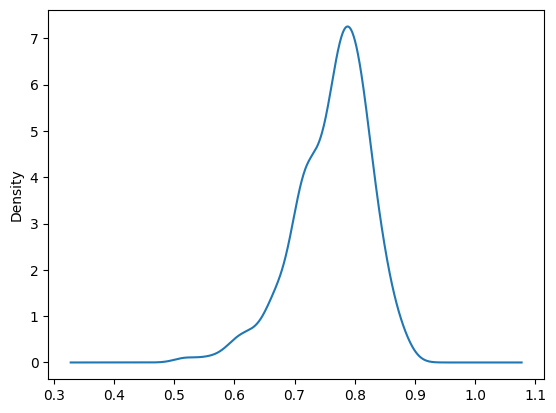

In [ ]:
np.abs(AS_pvalue['Correlation']).plot(kind='density')
print('Skewness value:',skew(np.abs(AS_pvalue['Correlation'])))
statistics.mean(np.abs(AS_pvalue['Correlation']))

In [ ]:
AS_HDG_GE_Profile_WGS_DEGs=EpigenticsExpressed_transpose[AS_corr.index]
AS_HDG_GE_Profile_WGS_DEGs

In [ ]:
CI_em_percentile_threshold = np.percentile(np.abs(AS_corr['Correlation']), q=[75])
CI_DEGs=EpigenticsExpressed_transpose[AS_corr[np.abs(AS_pvalue['Correlation'])>CI_em_percentile_threshold[0]].index]
AS_HDG_GE_Profile_WGS_DEGs=CI_DEGs


Boolean Series key will be reindexed to match DataFrame index.


In [ ]:
AS_HDG_GE_Profile_WGS_DEGs

,cg26495711,cg26026748,cg10460946,cg16676676,cg06505619,cg08118034,cg10383447,cg19588399,cg10696787,cg21870038,cg08443563
C3L-00001-02,-0.214760,-4.097758,-4.912525,0.113544,-0.580120,-0.154347,-6.145282,-2.578843,-3.156956,-4.383594,-2.923864
C3L-00001-06,4.794192,-2.241470,-1.455763,6.048776,3.292969,2.182183,-3.798555,-1.660121,-0.779272,-1.419414,0.486531
C3L-00009-01,0.346874,-2.423779,-3.942264,1.248578,0.640717,0.575664,-5.695165,-1.837541,-3.229951,-3.406111,-1.828056
C3L-00009-06,3.193090,-0.966635,-3.276306,3.577551,0.910428,0.753640,-2.150335,-2.691432,-2.343872,-1.827598,0.009381
C3L-00080-01,-0.795244,-3.094632,-5.058524,0.179956,-0.266483,0.419007,-5.701835,-2.785604,-3.028869,-3.897179,-2.687618
...,...,...,...,...,...,...,...,...,...,...,...
C3N-02587-03,4.181019,-0.386007,-1.871089,4.514975,2.820484,1.830013,-1.928432,-0.880297,-1.456953,-0.804147,1.033875
C3N-02588-01;C3N-02588-02,2.423403,-5.143159,-2.866499,3.314836,-0.726685,1.988904,-4.183918,-2.864433,-1.395629,-2.631967,-2.005599
C3N-02588-03,3.083499,-0.990526,-2.235248,4.713687,2.321148,1.786592,-1.640065,-1.000175,-1.482352,-1.652692,0.583047
C3N-02729-01;C3N-02729-02,2.012857,-4.202247,-4.897061,0.278626,2.269312,0.631967,-6.354498,-3.141512,-3.834426,-4.298120,-2.659923


In [ ]:
AS_HDG_GE_Profile_WGS_DEGs.to_csv(CancerType+ " " + Epigentetics_File+"_AS_0.8_75.csv")

#####Impacted Genomics/ Proteomics Association Scoring

43


<ipython-input-20-ff7d3550007f>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_SW_df = result_SW_df.append({'Feature': tg, 'Correlation': res[0], 'P-value':res[1]}, ignore_index=True)
<ipython-input-20-ff7d3550007f>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_SW_df = result_SW_df.append({'Feature': tg, 'Correlation': res[0], 'P-value':res[1]}, ignore_index=True)
<ipython-input-20-ff7d3550007f>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_SW_df = result_SW_df.append({'Feature': tg, 'Correlation': res[0], 'P-value':res[1]}, ignore_index=True)
<ipython-input-20-ff7d3550007f>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use panda

         Correlation       P-value
Feature                           
PTBP1       0.559785  1.393936e-10
WDR18       0.312639  7.905476e-04
RNF126      0.242456  1.000440e-02
MISP        0.595431  4.380201e-12
KISS1R      0.314680  7.270565e-04
...              ...           ...
SLC37A2    -0.015181  8.737759e-01
EI24       -0.044813  6.389454e-01
CHEK1       0.671297  5.506872e-16
FEZ1        0.540254  7.848314e-10
TMEM218    -0.009572  9.202105e-01

[281 rows x 2 columns]


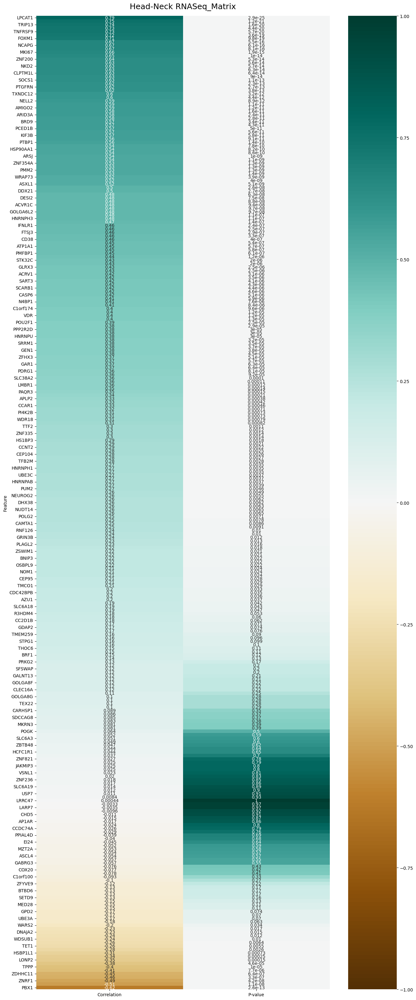

In [ ]:
import scipy.stats as stats

EpigenticsExpressed_transpose = pd.read_csv(CancerType+ " " + Epigentetics_File+"_AS_0.5.csv",index_col=0)
RNASEQ = pd.read_csv(CancerType+" "+ "RNASeq_Matrix_Pre-processed.csv", index_col=0)
EpigenticsExpressed_transpose['Label']=ClinicalData['Label']
EpigenticsExpressed_transpose=EpigenticsExpressed_transpose.dropna()
Label=EpigenticsExpressed_transpose['Label']
EpigenticsExpressed_transpose=EpigenticsExpressed_transpose. iloc[:,:-1]
plt.figure(figsize=(15, 40))
#stats.pointbiserialr(GE_Profile_WGS.iloc[:,1], Clinical_data['Label'])

result_SW_df = pd.DataFrame({'Feature': [], 'Correlation':[],'P-value':[]})
print(len(EpigenticsExpressed_transpose.iloc[:,:-1].columns))
# biserial corr test
for col in range(len(EpigenticsExpressed_transpose.iloc[:,:-1].columns)):

  TargetGenes=RNASEQ[RNASEQ.columns.intersection(Methyl_Genes[Methyl_Genes['t_Keys']==EpigenticsExpressed_transpose.columns.to_list()[col]]['t_Symbol'])]
  for tg in TargetGenes.columns:

    res=stats.pointbiserialr(Label,TargetGenes[tg] )
    result_SW_df = result_SW_df.append({'Feature': tg, 'Correlation': res[0], 'P-value':res[1]}, ignore_index=True)

resu_impacted_genes=pd.DataFrame(result_SW_df)
resu_impacted_genes.set_index(resu_impacted_genes.columns[0], inplace=True)
print(resu_impacted_genes)

heatmap = sns.heatmap(resu_impacted_genes.sort_values(by='Correlation', ascending=False), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title(CancerType+ " " + Impacted_Omics_File, fontdict={'fontsize':18}, pad=16);



In [ ]:
resu_impacted_genes

,Correlation,P-value
Feature,,
PTBP1,0.559785,1.393936e-10
WDR18,0.312639,7.905476e-04
RNF126,0.242456,1.000440e-02
MISP,0.595431,4.380201e-12
KISS1R,0.314680,7.270565e-04
...,...,...
SLC37A2,-0.015181,8.737759e-01
EI24,-0.044813,6.389454e-01
CHEK1,0.671297,5.506872e-16


#### Casual Inference

#####Estimate based on average of outcomes estimates

###### Linear Regression

In [ ]:
from dowhy import CausalModel

Epigentetics_File= "miRNA_Matrix_Pre-processed" #Methylation_Meta_Value

#Integrated_Genes = pd.read_csv("CanMethdb_"+CancerType+".csv")
Impacted_Omics = pd.read_csv(CancerType+" "+ "RNASeq_Matrix_Pre-processed.csv", index_col=0)
Integrated_Genes = pd.read_csv("MicroRNA_Target_Sites-HomoSpaiens.csv", index_col=0)
#Impacted_Omics = pd.read_csv(CancerType+"_Proteomics_Imputed.csv", index_col=0).transpose()



GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_AS_0.5.csv",index_col=0)
ClinicalData = pd.read_csv(CancerType+" "+"Proteomics Clinical.csv", index_col=3)
GE_Profile_WGS['State']=ClinicalData['Label']
GE_Profile_WGS=GE_Profile_WGS.dropna()

temp_cols=GE_Profile_WGS.columns.tolist()
index=GE_Profile_WGS.columns.get_loc("State")
new_cols=temp_cols[index:index+1] + temp_cols[0:index] + temp_cols[index+1:]
GE_Profile_WGS=GE_Profile_WGS[new_cols]
GE_Profile_WGS['State']=GE_Profile_WGS['State'].astype('bool')
GE_Profile_WGS['TargetGene']=""
temp_cols=GE_Profile_WGS.columns.tolist()
index=GE_Profile_WGS.columns.get_loc('TargetGene')
new_cols=temp_cols[index:index+1] + temp_cols[0:index] + temp_cols[index+1:]
GE_Profile_WGS=GE_Profile_WGS[new_cols]


result_CI_LR_df = pd.DataFrame({'Feature': []})
result_CI_Per_Gene_LR_df=pd.DataFrame({'Feature': []})

for col in range (2,len(GE_Profile_WGS.columns)):

      if(Epigentetics_File=="Methylation_Meta_Value"):

        TargetGenes=Impacted_Omics[Impacted_Omics.columns.intersection(Integrated_Genes[Integrated_Genes['t_Keys']==GE_Profile_WGS.columns.to_list()[col]]['t_Symbol'])]
      else:
        TargetGenes=Impacted_Omics[Impacted_Omics.columns.intersection(Integrated_Genes[Integrated_Genes['miRNA']==GE_Profile_WGS.columns.to_list()[col]]['Target Gene'].unique())]

      ci_per_feature=[]
      for tg in TargetGenes.columns:

        GE_Profile_WGS['TargetGene']=TargetGenes[tg]

        print("The feature:",GE_Profile_WGS.columns.to_list()[col],"The targeted gene:",tg)

        model= CausalModel(
              data = GE_Profile_WGS,
              treatment='State',
              outcome='TargetGene',
              common_causes=GE_Profile_WGS.columns.to_list()[2:len(GE_Profile_WGS.columns)]
              )
        model.view_model(layout="dot")
        from IPython.display import Image, display
        display(Image(filename="causal_model.png"))

        identified_estimand = model.identify_effect(proceed_when_unidentifiable=True, method_name="maximal-adjustment")
        #print(identified_estimand)


        data_1 = GE_Profile_WGS[GE_Profile_WGS["State"]==1]
        data_0 = GE_Profile_WGS[GE_Profile_WGS["State"]==0]

        print("ATE", np.mean(data_1["State"])- np.mean(data_0["State"]))

        estimate_LR = model.estimate_effect(identified_estimand,
        method_name="backdoor.linear_regression", test_significance=True,
                                 target_units="ate")
        print("Linear Regression Causal Estimate is " + str(estimate_LR.value))
        ci_per_feature.append(estimate_LR.value)
        result_CI_Per_Gene_LR_df = result_CI_Per_Gene_LR_df.append({'Feature': GE_Profile_WGS.columns.to_list()[col],'Target_Gene':tg, 'Estimate_LR': str(round(estimate_LR.value,4))}, ignore_index=True)


      if(len(ci_per_feature)>0):
        result_CI_LR_df = result_CI_LR_df.append({'Feature': GE_Profile_WGS.columns.to_list()[col], 'Estimate_LR': str(round(sum(ci_per_feature)/len(ci_per_feature),4))}, ignore_index=True)
      else:
        result_CI_LR_df = result_CI_LR_df.append({'Feature': GE_Profile_WGS.columns.to_list()[col], 'Estimate_LR': str(0)}, ignore_index=True)


In [ ]:
result_CI_LR_df.to_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Total.csv", index=False)
result_CI_Per_Gene_LR_df.to_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Per_Gene.csv", index=False)


In [ ]:
result_CI_LR_df

,Feature,Estimate_LR
0,hsa-mir-145,0.0329
1,hsa-mir-5089,-0.0595
2,hsa-mir-490,0.0024


###### Double Machine Learning

In [ ]:
from dowhy import CausalModel
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LassoCV
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor,RandomForestClassifier

Epigentetics_File= "Methylation_Meta_Value" ##miRNA_Matrix_Pre-processed.csv
RNASEQ = pd.read_csv(CancerType+" "+ "RNASeq_Matrix_Pre-processed.csv", index_col=0)

GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_AS_0.8.csv",index_col=0)
GE_Profile_WGS['State']=ClinicalData['Label']
GE_Profile_WGS=GE_Profile_WGS.dropna()

temp_cols=GE_Profile_WGS.columns.tolist()
index=GE_Profile_WGS.columns.get_loc("State")
new_cols=temp_cols[index:index+1] + temp_cols[0:index] + temp_cols[index+1:]
GE_Profile_WGS=GE_Profile_WGS[new_cols]
GE_Profile_WGS['State']=GE_Profile_WGS['State'].astype('bool')
GE_Profile_WGS['TargetGene']=""
temp_cols=GE_Profile_WGS.columns.tolist()
index=GE_Profile_WGS.columns.get_loc('TargetGene')
new_cols=temp_cols[index:index+1] + temp_cols[0:index] + temp_cols[index+1:]
GE_Profile_WGS=GE_Profile_WGS[new_cols]

result_CI_Per_Gene_dml_df=pd.DataFrame({'Feature': []})
result_CI_DML_df = pd.DataFrame({'Feature': []})


for col in range (2,len(GE_Profile_WGS.columns)):

      if(Epigentetics_File=="Methylation_Meta_Value"):

        TargetGenes=RNASEQ[RNASEQ.columns.intersection(Integrated_Genes[Integrated_Genes['t_Keys']==GE_Profile_WGS.columns.to_list()[col]]['t_Symbol'])]
      else:
        Selected_miRNA=Integrated_Genes[Integrated_Genes['miRNA'].isin(EpigenticsExpressed_transpose.columns.intersection(GE_Profile_WGS.columns.to_list()[col]))]
        TargetGenes=Impacted_Proteomics_data_transpose[Impacted_Proteomics_data_transpose.columns.intersection(Selected_miRNA['Target Gene'])].columns.to_list()

      ci_per_feature=[]
      for tg in TargetGenes.columns:

        GE_Profile_WGS['TargetGene']=TargetGenes[tg]

        print("The feature:",GE_Profile_WGS.columns.to_list()[col],"The targeted gene:",tg)

        model= CausalModel(
              data = GE_Profile_WGS,
              treatment='State',
              outcome='TargetGene',
              common_causes=GE_Profile_WGS.columns.to_list()[2:len(GE_Profile_WGS.columns)]
              )
        #model.view_model(layout="dot")
        #from IPython.display import Image, display
        #display(Image(filename="causal_model.png"))

        identified_estimand = model.identify_effect(proceed_when_unidentifiable=True, method_name="maximal-adjustment")
        #print(identified_estimand)


        data_1 = GE_Profile_WGS[GE_Profile_WGS["State"]==1]
        data_0 = GE_Profile_WGS[GE_Profile_WGS["State"]==0]

        #print("ATE", np.mean(data_1["State"])- np.mean(data_0["State"]))

        dml_estimate = model.estimate_effect(identified_estimand, method_name="backdoor.econml.dml.KernelDML",
                                method_params={"init_params":{
                                    #'n_estimators':200,
                                    'discrete_treatment':True,
                                    #'discrete_instrument':True,
                                    # 'random_state':42,
                                    #'n_estimators':200
                                    'model_y': RandomForestRegressor(min_samples_leaf=20),
                                    'model_t':RandomForestClassifier(min_samples_leaf=20),
                                    #'model_final':RandomForestRegressor(min_samples_leaf=20),
                                    #'featurizer':PolynomialFeatures(degree=1, include_bias=False)},
                                               },
                                    "fit_params":{}})
        #print("Double ML Causal Estimate is " + str(dml_estimate.value))
        ci_per_feature.append(dml_estimate.value)
        result_CI_Per_Gene_dml_df = result_CI_Per_Gene_dml_df.append({'Feature': GE_Profile_WGS.columns.to_list()[col],'Target_Gene':tg, 'Estimate_CausalForestDML': str(round(dml_estimate.value,4))}, ignore_index=True)

      if(len(ci_per_feature)>0):
        result_CI_DML_df = result_CI_DML_df.append({'Feature': GE_Profile_WGS.columns.to_list()[col], 'Estimate_CausalForestDML': str(round(sum(ci_per_feature)/len(ci_per_feature),4))}, ignore_index=True)
      else:
        result_CI_DML_df = result_CI_DML_df.append({'Feature': GE_Profile_WGS.columns.to_list()[col], 'Estimate_CausalForestDML': str(0)}, ignore_index=True)


[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg08223924 The targeted gene: PTBP1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg08223924 The targeted gene: WDR18


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg08223924 The targeted gene: RNF126


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg08223924 The targeted gene: MISP


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg08223924 The targeted gene: KISS1R


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg08223924 The targeted gene: ARID3A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg08223924 The targeted gene: GRIN3B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg08223924 The targeted gene: AZU1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg08223924 The targeted gene: MED16


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg08223924 The targeted gene: TMEM259


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg08223924 The targeted gene: R3HDM4


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg11864327 The targeted gene: HNRNPH1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg11864327 The targeted gene: ZNF354A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg11864327 The targeted gene: HNRNPAB


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg11886405 The targeted gene: APLP2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg11886405 The targeted gene: ST14


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg11886405 The targeted gene: NCAPD3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg11886405 The targeted gene: GLB1L3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg13897627 The targeted gene: DNAJA2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg13897627 The targeted gene: LONP2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg13897627 The targeted gene: N4BP1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg13897627 The targeted gene: ABCC11


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg13897627 The targeted gene: ITFG1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg13897627 The targeted gene: HEATR3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg13897627 The targeted gene: BRD7


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg13897627 The targeted gene: NETO2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg13897627 The targeted gene: SIAH1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg13897627 The targeted gene: CNEP1R1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg24576995 The targeted gene: UBE3C


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg24576995 The targeted gene: LMBR1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg24576995 The targeted gene: NOM1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg24576995 The targeted gene: NCAPG2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg11582484 The targeted gene: UBE3A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg11582484 The targeted gene: GOLGA8F


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg11582484 The targeted gene: GOLGA6L2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg11582484 The targeted gene: MKRN3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg11582484 The targeted gene: GABRG3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg11582484 The targeted gene: GOLGA8G


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg11582484 The targeted gene: GABRA5


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg03421657 The targeted gene: POGK


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg03421657 The targeted gene: UCK2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg03421657 The targeted gene: TMCO1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg03421657 The targeted gene: POU2F1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg03421657 The targeted gene: MAEL


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg03421657 The targeted gene: TADA1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg03421657 The targeted gene: PBX1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg08337166 The targeted gene: WSCD2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg08337166 The targeted gene: SART3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg08337166 The targeted gene: CORO1C


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg08337166 The targeted gene: DAO


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg08337166 The targeted gene: RIC8B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg08337166 The targeted gene: PWP1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg08337166 The targeted gene: ASCL4


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg06566239 The targeted gene: GLRX3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg06566239 The targeted gene: STK32C


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg06566239 The targeted gene: PPP2R2D


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg06566239 The targeted gene: BNIP3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg06566239 The targeted gene: JAKMIP3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg11820931 The targeted gene: CCAR1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg11820931 The targeted gene: HNRNPH3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg11820931 The targeted gene: DDX50


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg11820931 The targeted gene: VPS26A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg11820931 The targeted gene: TET1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg11820931 The targeted gene: DNA2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg11820931 The targeted gene: SUPV3L1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg11820931 The targeted gene: HKDC1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg11820931 The targeted gene: STOX1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg11820931 The targeted gene: DDX21


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg26202762 The targeted gene: UBE3A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg26202762 The targeted gene: GOLGA8F


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg26202762 The targeted gene: GOLGA6L2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg26202762 The targeted gene: MKRN3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg26202762 The targeted gene: GABRG3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg26202762 The targeted gene: GOLGA8G


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg17157798 The targeted gene: RIMBP2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg17157798 The targeted gene: SFSWAP


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg17157798 The targeted gene: SCARB1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg17157798 The targeted gene: FZD10


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg17157798 The targeted gene: RAN


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg17157798 The targeted gene: DHX37


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg17157798 The targeted gene: BRI3BP


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg20979737 The targeted gene: SDCCAG8


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg20979737 The targeted gene: DESI2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg20979737 The targeted gene: HNRNPU


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg20979737 The targeted gene: AHCTF1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg20979737 The targeted gene: TFB2M


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg20979737 The targeted gene: CNST


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg20979737 The targeted gene: C1orf100


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg20979737 The targeted gene: SMYD3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg20979737 The targeted gene: COX20


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg16151261 The targeted gene: CTDP1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg16151261 The targeted gene: ZNF236


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg16151261 The targeted gene: TXNL4A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg16151261 The targeted gene: HSBP1L1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg01807825 The targeted gene: HNRNPD


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg01807825 The targeted gene: PRKG2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg01807825 The targeted gene: HNRNPDL


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg01807825 The targeted gene: PAQR3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg01807825 The targeted gene: MRPL1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg04094178 The targeted gene: TP73


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg04094178 The targeted gene: CEP104


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg04094178 The targeted gene: WRAP73


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg04094178 The targeted gene: CHD5


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg04094178 The targeted gene: LRRC47


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg04094178 The targeted gene: NPHP4


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg04094178 The targeted gene: TPRG1L


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg04094178 The targeted gene: GPR153


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg04094178 The targeted gene: C1orf174


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg00629625 The targeted gene: SLC35C2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg00629625 The targeted gene: PCIF1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg00629625 The targeted gene: ZSWIM1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg00629625 The targeted gene: ZNF335


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg01970336 The targeted gene: OSBPL9


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg01970336 The targeted gene: TXNDC12


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg01970336 The targeted gene: RNF11


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg01970336 The targeted gene: BTF3L4


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg01970336 The targeted gene: CC2D1B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg01970336 The targeted gene: ZFYVE9


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg01970336 The targeted gene: RAB3B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg01970336 The targeted gene: KTI12


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg27203983 The targeted gene: ZNF200


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg27203983 The targeted gene: HCFC1R1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg27203983 The targeted gene: MEFV


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg27203983 The targeted gene: THOC6


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg27203983 The targeted gene: OR1F1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg24069602 The targeted gene: PSMC5


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg24069602 The targeted gene: FTSJ3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg24069602 The targeted gene: SMARCD2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg24069602 The targeted gene: CSH2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg24069602 The targeted gene: POLG2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg24069602 The targeted gene: CEP95


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg00576086 The targeted gene: BRD9


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg00576086 The targeted gene: CLPTM1L


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg00576086 The targeted gene: TRIP13


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg00576086 The targeted gene: IRX4


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg00576086 The targeted gene: SLC6A3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg00576086 The targeted gene: NDUFS6


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg00576086 The targeted gene: NKD2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg00576086 The targeted gene: LPCAT1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg00576086 The targeted gene: TERT


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg00576086 The targeted gene: SLC6A18


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg00576086 The targeted gene: IRX2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg00576086 The targeted gene: TPPP


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg00576086 The targeted gene: MRPL36


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg00576086 The targeted gene: SLC6A19


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg00576086 The targeted gene: C5orf38


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg00576086 The targeted gene: ZDHHC11


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg00576086 The targeted gene: ZDHHC11B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg03267139 The targeted gene: CCNT2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg03267139 The targeted gene: FAM168B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg03267139 The targeted gene: MGAT5


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg03267139 The targeted gene: CCDC74A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg03267139 The targeted gene: MZT2A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg03267139 The targeted gene: POTEE


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg05081953 The targeted gene: GPD2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg05081953 The targeted gene: ACVR1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg05081953 The targeted gene: ACVR1C


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg05081953 The targeted gene: GALNT13


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg05081953 The targeted gene: ARL6IP6


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg05081953 The targeted gene: WDSUB1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg05081953 The targeted gene: PRPF40A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg10648542 The targeted gene: HNRNPH1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg10648542 The targeted gene: ZNF354A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg10648542 The targeted gene: HNRNPAB


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg13555050 The targeted gene: GAR1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg13555050 The targeted gene: AP1AR


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg13555050 The targeted gene: CASP6


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg13555050 The targeted gene: CAMK2D


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg13555050 The targeted gene: LARP7


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg13555050 The targeted gene: NEUROG2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg13555050 The targeted gene: ARSJ


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg09853702 The targeted gene: RPAP3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg09853702 The targeted gene: SLC38A1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg09853702 The targeted gene: VDR


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg09853702 The targeted gene: TMEM106C


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg09853702 The targeted gene: SLC38A2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg09853702 The targeted gene: AMIGO2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg09853702 The targeted gene: COL2A1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg09853702 The targeted gene: PCED1B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg09853702 The targeted gene: NELL2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg01573635 The targeted gene: CLEC16A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg01573635 The targeted gene: PMM2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg01573635 The targeted gene: CARHSP1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg01573635 The targeted gene: RMI2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg01573635 The targeted gene: PRM3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg01573635 The targeted gene: DEXI


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg01573635 The targeted gene: C16orf72


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg01573635 The targeted gene: ABAT


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg01573635 The targeted gene: TMEM186


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg01573635 The targeted gene: SOCS1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg01573635 The targeted gene: USP7


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg27537125 The targeted gene: STPG1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg27537125 The targeted gene: RUNX3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg27537125 The targeted gene: SRRM1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg27537125 The targeted gene: IFNLR1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg09873544 The targeted gene: GLRX3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg09873544 The targeted gene: MKI67


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg09873544 The targeted gene: STK32C


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg09873544 The targeted gene: PPP2R2D


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg09873544 The targeted gene: BNIP3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg09873544 The targeted gene: JAKMIP3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg05579652 The targeted gene: FOXM1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg09596131 The targeted gene: PUM2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg09596131 The targeted gene: SDC1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg09596131 The targeted gene: HS1BP3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg09596131 The targeted gene: SMC6


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg09596131 The targeted gene: VSNL1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg09596131 The targeted gene: GEN1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg09596131 The targeted gene: TTC32


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg09596131 The targeted gene: NT5C1B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg09596131 The targeted gene: RAD51AP2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg27219221 The targeted gene: TPX2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg27219221 The targeted gene: PDRG1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg27219221 The targeted gene: TM9SF4


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg27219221 The targeted gene: POFUT1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg27219221 The targeted gene: KIF3B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg27219221 The targeted gene: PLAGL2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg27219221 The targeted gene: ASXL1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg27219221 The targeted gene: BCL2L1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg10020892 The targeted gene: GPR89A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg10020892 The targeted gene: PPIAL4D


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg05068848 The targeted gene: PI4K2B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg05068848 The targeted gene: DHX15


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg05068848 The targeted gene: MED28


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg19319037 The targeted gene: CD58


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg19319037 The targeted gene: CD2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg19319037 The targeted gene: TTF2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg19319037 The targeted gene: WARS2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg19319037 The targeted gene: PTGFRN


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg19319037 The targeted gene: CD101


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg19319037 The targeted gene: IGSF3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg19319037 The targeted gene: ATP1A1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg19319037 The targeted gene: GDAP2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg02301740 The targeted gene: ZNF558


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg27583655 The targeted gene: DEPDC1B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg27583655 The targeted gene: ERCC8


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg27583655 The targeted gene: GPBP1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg27583655 The targeted gene: SETD9


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg07691684 The targeted gene: CD38


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg07691684 The targeted gene: NCAPG


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg07691684 The targeted gene: MED28


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg07691684 The targeted gene: FGFBP1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg07691684 The targeted gene: FGFBP2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg07691684 The targeted gene: DCAF16


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg07691684 The targeted gene: LCORL


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg07691684 The targeted gene: FAM200B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg05516390 The targeted gene: GLG1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg05516390 The targeted gene: DHODH


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg05516390 The targeted gene: ZNF821


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg05516390 The targeted gene: PSMD7


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg05516390 The targeted gene: FA2H


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg05516390 The targeted gene: PMFBP1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg05516390 The targeted gene: DHX38


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg05516390 The targeted gene: TXNL4B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg05516390 The targeted gene: ZFHX3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg05516390 The targeted gene: RFWD3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg05516390 The targeted gene: IST1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg05516390 The targeted gene: ZNRF1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg05516390 The targeted gene: ATXN1L


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg07163845 The targeted gene: HSP90AA1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg07163845 The targeted gene: AKT1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg07163845 The targeted gene: PACS2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg07163845 The targeted gene: MTA1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg07163845 The targeted gene: NUDT14


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg07163845 The targeted gene: BTBD6


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg07163845 The targeted gene: BRF1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg07163845 The targeted gene: CDC42BPB


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg07163845 The targeted gene: TEX22


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg18025409 The targeted gene: VAMP3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg18025409 The targeted gene: TNFRSF9


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg18025409 The targeted gene: ENO1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg18025409 The targeted gene: PHF13


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg18025409 The targeted gene: CAMTA1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg18025409 The targeted gene: ZBTB48


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg23156348 The targeted gene: STT3A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg23156348 The targeted gene: ACRV1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg23156348 The targeted gene: SLC37A2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg23156348 The targeted gene: EI24


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg23156348 The targeted gene: CHEK1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg23156348 The targeted gene: FEZ1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg23156348 The targeted gene: TMEM218


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg22641201 The targeted gene: TFAM


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg22641201 The targeted gene: ZWINT


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The feature: cg22641201 The targeted gene: CDK1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


In [ ]:
result_CI_Per_Gene_dml_df

,Feature,Target_Gene,Estimate_CausalForestDML
0,cg08223924,PTBP1,0.4951
1,cg08223924,WDR18,0.3412
2,cg08223924,RNF126,0.2656
3,cg08223924,MISP,2.3957
4,cg08223924,KISS1R,0.9609
...,...,...,...
279,cg23156348,FEZ1,1.2859
280,cg23156348,TMEM218,0.0
281,cg22641201,TFAM,0.3869
282,cg22641201,ZWINT,1.0479


In [ ]:
result_CI_DML_df.set_index('Feature',inplace=True)
CI_Scores=pd.read_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Total.csv", index_col=0)
CI_Scores['Estimate_KernelDML']=result_CI_DML_df['Estimate_CausalForestDML']
CI_Scores.to_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Total.csv", index=True)

#result_CI_Per_Gene_dml_df.set_index('Feature',inplace=True)
CI_Scores_Per_Gene=pd.read_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Per_Gene.csv")
CI_Scores_Per_Gene=pd.merge(CI_Scores_Per_Gene, result_CI_Per_Gene_dml_df, on=['Feature', 'Target_Gene'])
CI_Scores_Per_Gene.to_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Per_Gene.csv", index=False)


###### Double Robust Learner

In [ ]:
from dowhy import CausalModel
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LassoCV
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import LogisticRegressionCV

Epigentetics_File= "Methylation_Meta_Value" ##miRNA_Matrix_Pre-processed.csv
#RNASEQ = pd.read_csv(CancerType+" "+ "RNASeq_Matrix_Pre-processed.csv", index_col=0)

GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_AS_0.8.csv",index_col=0)
GE_Profile_WGS['State']=ClinicalData['Label']
GE_Profile_WGS=GE_Profile_WGS.dropna()

temp_cols=GE_Profile_WGS.columns.tolist()
index=GE_Profile_WGS.columns.get_loc("State")
new_cols=temp_cols[index:index+1] + temp_cols[0:index] + temp_cols[index+1:]
GE_Profile_WGS=GE_Profile_WGS[new_cols]
GE_Profile_WGS['State']=GE_Profile_WGS['State'].astype('bool')
GE_Profile_WGS['TargetGene']=""
temp_cols=GE_Profile_WGS.columns.tolist()
index=GE_Profile_WGS.columns.get_loc('TargetGene')
new_cols=temp_cols[index:index+1] + temp_cols[0:index] + temp_cols[index+1:]
GE_Profile_WGS=GE_Profile_WGS[new_cols]

result_CI_Per_Gene_drl_df=pd.DataFrame({'Feature': []})
result_CI_DRL_df = pd.DataFrame({'Feature': []})


for col in range (2,len(GE_Profile_WGS.columns)):

      if(Epigentetics_File=="Methylation_Meta_Value"):

        TargetGenes=RNASEQ[RNASEQ.columns.intersection(Integrated_Genes[Integrated_Genes['t_Keys']==GE_Profile_WGS.columns.to_list()[col]]['t_Symbol'])]
      else:
        Selected_miRNA=Integrated_Genes[Integrated_Genes['miRNA'].isin(EpigenticsExpressed_transpose.columns.intersection(GE_Profile_WGS.columns.to_list()[col]))]
        TargetGenes=Impacted_Proteomics_data_transpose[Impacted_Proteomics_data_transpose.columns.intersection(Selected_miRNA['Target Gene'])].columns.to_list()

      ci_per_feature=[]
      for tg in TargetGenes.columns:

        GE_Profile_WGS['TargetGene']=TargetGenes[tg]

        print("The feature:",GE_Profile_WGS.columns.to_list()[col],"The targeted gene:",tg)

        model= CausalModel(
              data = GE_Profile_WGS,
              treatment='State',
              outcome='TargetGene',
              common_causes=GE_Profile_WGS.columns.to_list()[2:len(GE_Profile_WGS.columns)]
              )
        model.view_model(layout="dot")
        from IPython.display import Image, display
        display(Image(filename="causal_model.png"))

        identified_estimand = model.identify_effect(proceed_when_unidentifiable=True, method_name="maximal-adjustment")
        #print(identified_estimand)


        data_1 = GE_Profile_WGS[GE_Profile_WGS["State"]==1]
        data_0 = GE_Profile_WGS[GE_Profile_WGS["State"]==0]

        print("ATE", np.mean(data_1["State"])- np.mean(data_0["State"]))

        drl_estimate = model.estimate_effect(identified_estimand, method_name="backdoor.econml.dr.LinearDRLearner",
                                method_params={"init_params":{
                                #                    'model_propensity': LogisticRegressionCV(cv=3, solver='lbfgs', multi_class='auto')
                                                    },
                                               "fit_params":{}})
        print("Double RL Causal Estimate is " + str(drl_estimate.value))
        ci_per_feature.append(drl_estimate.value)
        result_CI_Per_Gene_drl_df = result_CI_Per_Gene_drl_df.append({'Feature': GE_Profile_WGS.columns.to_list()[col],'Target_Gene':tg, 'Estimate_LDRL': str(round(drl_estimate.value,4))}, ignore_index=True)

      if(len(ci_per_feature)>0):
        result_CI_DRL_df = result_CI_DRL_df.append({'Feature': GE_Profile_WGS.columns.to_list()[col], 'Estimate_LDRL': str(round(sum(ci_per_feature)/len(ci_per_feature),4))}, ignore_index=True)
      else:
        result_CI_DRL_df = result_CI_DRL_df.append({'Feature': GE_Profile_WGS.columns.to_list()[col], 'Estimate_LDRL': str(0)}, ignore_index=True)


In [ ]:
result_CI_Per_Gene_drl_df

,Feature,Target_Gene,Estimate_LDRL
0,cg08223924,PTBP1,-0.0377
1,cg08223924,WDR18,0.0313
2,cg08223924,RNF126,-0.0274
3,cg08223924,MISP,0.195
4,cg08223924,KISS1R,-0.0365
...,...,...,...
279,cg23156348,FEZ1,0.0557
280,cg23156348,TMEM218,0.0081
281,cg22641201,TFAM,0.0103
282,cg22641201,ZWINT,0.0361


In [ ]:
result_CI_DRL_df.set_index('Feature',inplace=True)
CI_Scores=pd.read_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Total.csv", index_col=0)
CI_Scores['Estimate_LDRL']=result_CI_DRL_df['Estimate_LDRL']
CI_Scores.to_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Total.csv", index=True)


CI_Scores_Per_Gene=pd.read_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Per_Gene.csv")
CI_Scores_Per_Gene=pd.merge(CI_Scores_Per_Gene, result_CI_Per_Gene_drl_df, on=['Feature', 'Target_Gene'])
CI_Scores_Per_Gene.to_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Per_Gene.csv", index=False)


###### Meta Learner X

In [ ]:
from dowhy import CausalModel
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LassoCV
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import LogisticRegressionCV
from sklearn.ensemble import RandomForestRegressor

Epigentetics_File= "Methylation_Meta_Value" ##miRNA_Matrix_Pre-processed.csv
RNASEQ = pd.read_csv(CancerType+" "+ "RNASeq_Matrix_Pre-processed.csv", index_col=0)

GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_AS_0.8.csv",index_col=0)
GE_Profile_WGS['State']=ClinicalData['Label']
GE_Profile_WGS=GE_Profile_WGS.dropna()

temp_cols=GE_Profile_WGS.columns.tolist()
index=GE_Profile_WGS.columns.get_loc("State")
new_cols=temp_cols[index:index+1] + temp_cols[0:index] + temp_cols[index+1:]
GE_Profile_WGS=GE_Profile_WGS[new_cols]
GE_Profile_WGS['State']=GE_Profile_WGS['State'].astype('bool')
GE_Profile_WGS['TargetGene']=""
temp_cols=GE_Profile_WGS.columns.tolist()
index=GE_Profile_WGS.columns.get_loc('TargetGene')
new_cols=temp_cols[index:index+1] + temp_cols[0:index] + temp_cols[index+1:]
GE_Profile_WGS=GE_Profile_WGS[new_cols]

result_CI_Per_Gene_mlx_df=pd.DataFrame({'Feature': []})
result_CI_mlx_df = pd.DataFrame({'Feature': []})


for col in range (2,len(GE_Profile_WGS.columns)):

      if(Epigentetics_File=="Methylation_Meta_Value"):

        TargetGenes=RNASEQ[RNASEQ.columns.intersection(Integrated_Genes[Integrated_Genes['t_Keys']==GE_Profile_WGS.columns.to_list()[col]]['t_Symbol'])]
      else:
        Selected_miRNA=Integrated_Genes[Integrated_Genes['miRNA'].isin(EpigenticsExpressed_transpose.columns.intersection(GE_Profile_WGS.columns.to_list()[col]))]
        TargetGenes=Impacted_Proteomics_data_transpose[Impacted_Proteomics_data_transpose.columns.intersection(Selected_miRNA['Target Gene'])].columns.to_list()

      ci_per_feature=[]
      for tg in TargetGenes.columns:

        GE_Profile_WGS['TargetGene']=TargetGenes[tg]

        print("The feature:",GE_Profile_WGS.columns.to_list()[col],"The targeted gene:",tg)

        model= CausalModel(
              data = GE_Profile_WGS,
              treatment='State',
              outcome='TargetGene',
              common_causes=GE_Profile_WGS.columns.to_list()[2:len(GE_Profile_WGS.columns)]
              )
        model.view_model(layout="dot")
        from IPython.display import Image, display
        display(Image(filename="causal_model.png"))

        identified_estimand = model.identify_effect(proceed_when_unidentifiable=True, method_name="maximal-adjustment")
        #print(identified_estimand)


        data_1 = GE_Profile_WGS[GE_Profile_WGS["State"]==1]
        data_0 = GE_Profile_WGS[GE_Profile_WGS["State"]==0]

        print("ATE", np.mean(data_1["State"])- np.mean(data_0["State"]))

        mlx_estimate = model.estimate_effect(identified_estimand, method_name="backdoor.econml.metalearners.DomainAdaptationLearner",
                                confidence_intervals=False,
                                method_params={"init_params":{
                                                    'models': RandomForestRegressor(),
                                                    'final_models':RandomForestRegressor()
                                                    },
                                               "fit_params":{}})
        print("Meta Learner X Causal Estimate is " + str(mlx_estimate.value))
        ci_per_feature.append(mlx_estimate.value)
        result_CI_Per_Gene_mlx_df = result_CI_Per_Gene_mlx_df.append({'Feature': GE_Profile_WGS.columns.to_list()[col],'Target_Gene':tg, 'Estimate_MLX': str(round(mlx_estimate.value,4))}, ignore_index=True)

      if(len(ci_per_feature)>0):
        result_CI_mlx_df = result_CI_mlx_df.append({'Feature': GE_Profile_WGS.columns.to_list()[col], 'Estimate_MLX': str(round(sum(ci_per_feature)/len(ci_per_feature),4))}, ignore_index=True)
      else:
        result_CI_mlx_df = result_CI_mlx_df.append({'Feature': GE_Profile_WGS.columns.to_list()[col], 'Estimate_MLX': str(0)}, ignore_index=True)


In [ ]:
result_CI_Per_Gene_mlx_df

,Feature,Target_Gene,Estimate_MLX
0,cg08223924,PTBP1,0.0003
1,cg08223924,WDR18,-0.0008
2,cg08223924,RNF126,-0.0009
3,cg08223924,MISP,0.0395
4,cg08223924,KISS1R,-0.0014
...,...,...,...
279,cg23156348,FEZ1,-0.0065
280,cg23156348,TMEM218,-0.0001
281,cg22641201,TFAM,0.001
282,cg22641201,ZWINT,0.0012


In [ ]:
result_CI_mlx_df.set_index('Feature',inplace=True)
CI_Scores=pd.read_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Total.csv", index_col=0)
CI_Scores['Estimate_MLAdaptation']=result_CI_mlx_df['Estimate_MLX']
CI_Scores.to_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Total.csv", index=True)


CI_Scores_Per_Gene=pd.read_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Per_Gene.csv")
CI_Scores_Per_Gene=pd.merge(CI_Scores_Per_Gene, result_CI_Per_Gene_mlx_df, on=['Feature', 'Target_Gene'])
CI_Scores_Per_Gene.to_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Per_Gene.csv", index=False)


#####Estimate based on average of outcomes weighted estimates

###### Linear Regression

In [ ]:
from dowhy import CausalModel

Epigentetics_File= "miRNA_Matrix_Pre-processed" #Methylation_Meta_Value

#Integrated_Genes = pd.read_csv("CanMethdb_"+CancerType+".csv")
Impacted_Omics = pd.read_csv(CancerType+" "+ "RNASeq_Matrix_Pre-processed.csv", index_col=0)
Integrated_Genes = pd.read_csv("MicroRNA_Target_Sites-HomoSpaiens.csv", index_col=0)
#Impacted_Omics = pd.read_csv(CancerType+"_Proteomics_Imputed.csv", index_col=0).transpose()


GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_AS_0.5.csv",index_col=0)
GE_Profile_WGS['State']=ClinicalData['Label']
GE_Profile_WGS=GE_Profile_WGS.dropna()

temp_cols=GE_Profile_WGS.columns.tolist()
index=GE_Profile_WGS.columns.get_loc("State")
new_cols=temp_cols[index:index+1] + temp_cols[0:index] + temp_cols[index+1:]
GE_Profile_WGS=GE_Profile_WGS[new_cols]
GE_Profile_WGS['State']=GE_Profile_WGS['State'].astype('bool')
GE_Profile_WGS['TargetGene']=""
temp_cols=GE_Profile_WGS.columns.tolist()
index=GE_Profile_WGS.columns.get_loc('TargetGene')
new_cols=temp_cols[index:index+1] + temp_cols[0:index] + temp_cols[index+1:]
GE_Profile_WGS=GE_Profile_WGS[new_cols]

result_CI_Per_Gene_LR_W_df=pd.DataFrame({'Feature': []})
result_CI_LR_W_df = pd.DataFrame({'Feature': []})

for col in range (2,len(GE_Profile_WGS.columns)):

      if(Epigentetics_File=="Methylation_Meta_Value"):

        TargetGenes=Impacted_Omics[Impacted_Omics.columns.intersection(Integrated_Genes[Integrated_Genes['t_Keys']==GE_Profile_WGS.columns.to_list()[col]]['t_Symbol'])]
      else:
        TargetGenes=Impacted_Omics[Impacted_Omics.columns.intersection(Integrated_Genes[Integrated_Genes['miRNA']==GE_Profile_WGS.columns.to_list()[col]]['Target Gene'].unique())]
      ci_per_feature=[]
      for tg in TargetGenes.columns:

        GE_Profile_WGS['TargetGene']=TargetGenes[tg]

        print("The cpg:",GE_Profile_WGS.columns.to_list()[col],"The targeted gene:",tg)

        model= CausalModel(
              data = GE_Profile_WGS,
              treatment='State',
              outcome='TargetGene',
              common_causes=GE_Profile_WGS.columns.to_list()[2:len(GE_Profile_WGS.columns)]
              )
        model.view_model(layout="dot")
        from IPython.display import Image, display
        display(Image(filename="causal_model.png"))

        identified_estimand = model.identify_effect(proceed_when_unidentifiable=True, method_name="maximal-adjustment")
        #print(identified_estimand)


        data_1 = GE_Profile_WGS[GE_Profile_WGS["State"]==1]
        data_0 = GE_Profile_WGS[GE_Profile_WGS["State"]==0]

        print("ATE", np.mean(data_1["State"])- np.mean(data_0["State"]))

        estimate_LR = model.estimate_effect(identified_estimand,
        method_name="backdoor.linear_regression", test_significance=True,
                                 target_units="ate")
        print("Linear Regression Causal Estimate is " + str(estimate_LR.value))

        if(stats.pointbiserialr(GE_Profile_WGS['State'],TargetGenes[tg] )[1]<00.5): #Check if the gene has signifcance corrlation
          impacted_gene_corr=abs(stats.pointbiserialr(GE_Profile_WGS['State'],TargetGenes[tg] )[0]) #Get the corr
          ci_averge_weight=estimate_LR.value*impacted_gene_corr
          print("Linear Regression Causal Weight Estimate is " + str(ci_averge_weight))
          ci_per_feature.append(ci_averge_weight)
          result_CI_Per_Gene_LR_W_df = result_CI_Per_Gene_LR_W_df.append({'Feature': GE_Profile_WGS.columns.to_list()[col],'Target_Gene':tg, 'Estimate_W_LR': str(round(ci_averge_weight,4))}, ignore_index=True)
        else:
          ci_per_feature.append(0)
          result_CI_Per_Gene_LR_W_df = result_CI_Per_Gene_LR_W_df.append({'Feature': GE_Profile_WGS.columns.to_list()[col],'Target_Gene':tg, 'Estimate_W_LR': str(0)}, ignore_index=True)

      if(len(ci_per_feature)>0):
        result_CI_LR_W_df = result_CI_LR_W_df.append({'Feature': GE_Profile_WGS.columns.to_list()[col], 'Estimate_W_LR': str(round(sum(ci_per_feature)/len(ci_per_feature),4))}, ignore_index=True)
      else:
        result_CI_LR_W_df = result_CI_LR_W_df.append({'Feature': GE_Profile_WGS.columns.to_list()[col], 'Estimate_W_LR': str(0)}, ignore_index=True)


In [ ]:
result_CI_LR_W_df.set_index('Feature',inplace=True)
CI_Scores=pd.read_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Total.csv", index_col=0)
CI_Scores['Estimate_W_LR']=result_CI_LR_W_df['Estimate_W_LR']
CI_Scores.to_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Total.csv", index=True)

CI_Scores_Per_Gene=pd.read_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Per_Gene.csv")
CI_Scores_Per_Gene=pd.merge(CI_Scores_Per_Gene, result_CI_Per_Gene_LR_W_df, on=['Feature', 'Target_Gene'])
CI_Scores_Per_Gene.to_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Per_Gene.csv", index=False)

###### Double Machine Learning

In [ ]:
from dowhy import CausalModel
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LassoCV
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor,RandomForestClassifier

Integrated_Genes = pd.read_csv("CanMethdb_"+CancerType+".csv")
Impacted_Omics = pd.read_csv(CancerType+" "+ "RNASeq_Matrix_Pre-processed.csv", index_col=0)
#Integrated_Genes = pd.read_csv("MicroRNA_Target_Sites-HomoSpaiens.csv", index_col=0)
#Impacted_Omics = pd.read_csv(CancerType+"_Proteomics_Imputed.csv", index_col=0).transpose()

GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_AS_0.8.csv",index_col=0)
GE_Profile_WGS['State']=ClinicalData['Label']
GE_Profile_WGS=GE_Profile_WGS.dropna()

temp_cols=GE_Profile_WGS.columns.tolist()
index=GE_Profile_WGS.columns.get_loc("State")
new_cols=temp_cols[index:index+1] + temp_cols[0:index] + temp_cols[index+1:]
GE_Profile_WGS=GE_Profile_WGS[new_cols]
GE_Profile_WGS['State']=GE_Profile_WGS['State'].astype('bool')
GE_Profile_WGS['TargetGene']=""
temp_cols=GE_Profile_WGS.columns.tolist()
index=GE_Profile_WGS.columns.get_loc('TargetGene')
new_cols=temp_cols[index:index+1] + temp_cols[0:index] + temp_cols[index+1:]
GE_Profile_WGS=GE_Profile_WGS[new_cols]

result_CI_Per_Gene_dml_W_df= pd.DataFrame({'Feature': []})
result_CI_DML_W_df = pd.DataFrame({'Feature': []})

for col in range (2,len(GE_Profile_WGS.columns)):

     if(Epigentetics_File=="Methylation_Meta_Value"):

        TargetGenes=Impacted_Omics[Impacted_Omics.columns.intersection(Integrated_Genes[Integrated_Genes['t_Keys']==GE_Profile_WGS.columns.to_list()[col]]['t_Symbol'])]
     else:
        TargetGenes=Impacted_Omics[Impacted_Omics.columns.intersection(Integrated_Genes[Integrated_Genes['miRNA']==GE_Profile_WGS.columns.to_list()[col]]['Target Gene'].unique())]
     ci_per_feature=[]
     for tg in TargetGenes.columns:

        GE_Profile_WGS['TargetGene']=TargetGenes[tg]

        print("The cpg:",GE_Profile_WGS.columns.to_list()[col],"The targeted gene:",tg)

        model= CausalModel(
              data = GE_Profile_WGS,
              treatment='State',
              outcome='TargetGene',
              common_causes=GE_Profile_WGS.columns.to_list()[2:len(GE_Profile_WGS.columns)]
              )
        #model.view_model(layout="dot")
        #from IPython.display import Image, display
        #display(Image(filename="causal_model.png"))

        identified_estimand = model.identify_effect(proceed_when_unidentifiable=True, method_name="maximal-adjustment")
        #print(identified_estimand)


        data_1 = GE_Profile_WGS[GE_Profile_WGS["State"]==1]
        data_0 = GE_Profile_WGS[GE_Profile_WGS["State"]==0]

        #print("ATE", np.mean(data_1["State"])- np.mean(data_0["State"]))

        dml_estimate = model.estimate_effect(identified_estimand, method_name="backdoor.econml.dml.DML",
                                    #'n_estimators':200,
                                    #'discrete_treatment':True,
                                    #'discrete_instrument':True,
                                    # 'random_state':42,
                                    #'n_estimators':200
                                    #'model_y': RandomForestRegressor(min_samples_leaf=20),
                                    #'model_t':RandomForestClassifier(min_samples_leaf=20),
                                    #'model_final':RandomForestRegressor(min_samples_leaf=20),
                                    #'featurizer':PolynomialFeatures(degree=1, include_bias=False)},

                                    #DML
                                    method_params={"init_params":{'model_y':RandomForestRegressor(n_estimators = 100, random_state = 42),
                                    'model_t': RandomForestRegressor(n_estimators = 100, random_state = 42),
                                    'model_final':RandomForestRegressor(n_estimators = 100, random_state = 42),
                                    'featurizer':PolynomialFeatures(degree=1, include_bias=False)},
                                    "fit_params":{}})
        print("Double ML Causal Estimate is " + str(dml_estimate.value))
        if(stats.pointbiserialr(GE_Profile_WGS['State'],TargetGenes[tg] )[1]<0.05): #Check if the gene has signifcance corrlation
          impacted_gene_corr=abs(stats.pointbiserialr(GE_Profile_WGS['State'],TargetGenes[tg] )[0]) #Get the corr
          ci_averge_weight=dml_estimate.value*impacted_gene_corr
          #print("Double ML Causal Weight Estimate is " + str(ci_averge_weight))
          ci_per_feature.append(ci_averge_weight)
          result_CI_Per_Gene_dml_W_df = result_CI_Per_Gene_dml_W_df._append({'Feature': GE_Profile_WGS.columns.to_list()[col],'Target_Gene':tg, 'Estimate_W_DML': str(round(ci_averge_weight,4))}, ignore_index=True)
        else:
          ci_per_feature.append(0)
          result_CI_Per_Gene_dml_W_df = result_CI_Per_Gene_dml_W_df._append({'Feature': GE_Profile_WGS.columns.to_list()[col],'Target_Gene':tg, 'Estimate_W_DML': str(0)}, ignore_index=True)

     if(len(ci_per_feature)>0):
        result_CI_DML_W_df = result_CI_DML_W_df._append({'Feature': GE_Profile_WGS.columns.to_list()[col], 'Estimate_W_KernelDML': str(round(sum(ci_per_feature)/len(ci_per_feature),4))}, ignore_index=True)
     else:
        result_CI_DML_W_df = result_CI_DML_W_df._append({'Feature': GE_Profile_WGS.columns.to_list()[col], 'Estimate_W_KernelDML': str(0)}, ignore_index=True)


[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg08223924 The targeted gene: PTBP1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg08223924 The targeted gene: WDR18


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg08223924 The targeted gene: RNF126


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg08223924 The targeted gene: MISP


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg08223924 The targeted gene: KISS1R


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg08223924 The targeted gene: ARID3A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg08223924 The targeted gene: GRIN3B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg08223924 The targeted gene: AZU1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg08223924 The targeted gene: MED16


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg08223924 The targeted gene: TMEM259


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg08223924 The targeted gene: R3HDM4


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg11864327 The targeted gene: HNRNPH1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg11864327 The targeted gene: ZNF354A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg11864327 The targeted gene: HNRNPAB


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg11886405 The targeted gene: APLP2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg11886405 The targeted gene: ST14


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg11886405 The targeted gene: NCAPD3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg11886405 The targeted gene: GLB1L3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg13897627 The targeted gene: DNAJA2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg13897627 The targeted gene: LONP2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg13897627 The targeted gene: N4BP1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg13897627 The targeted gene: ABCC11


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg13897627 The targeted gene: ITFG1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg13897627 The targeted gene: HEATR3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg13897627 The targeted gene: BRD7


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg13897627 The targeted gene: NETO2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg13897627 The targeted gene: SIAH1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg13897627 The targeted gene: CNEP1R1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg24576995 The targeted gene: UBE3C


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg24576995 The targeted gene: LMBR1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg24576995 The targeted gene: NOM1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg24576995 The targeted gene: NCAPG2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg11582484 The targeted gene: UBE3A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg11582484 The targeted gene: GOLGA8F


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg11582484 The targeted gene: GOLGA6L2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg11582484 The targeted gene: MKRN3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg11582484 The targeted gene: GABRG3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg11582484 The targeted gene: GOLGA8G


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg11582484 The targeted gene: GABRA5


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg03421657 The targeted gene: POGK


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg03421657 The targeted gene: UCK2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg03421657 The targeted gene: TMCO1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg03421657 The targeted gene: POU2F1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg03421657 The targeted gene: MAEL


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg03421657 The targeted gene: TADA1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg03421657 The targeted gene: PBX1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg08337166 The targeted gene: WSCD2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg08337166 The targeted gene: SART3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg08337166 The targeted gene: CORO1C


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg08337166 The targeted gene: DAO


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg08337166 The targeted gene: RIC8B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg08337166 The targeted gene: PWP1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg08337166 The targeted gene: ASCL4


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg06566239 The targeted gene: GLRX3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg06566239 The targeted gene: STK32C


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg06566239 The targeted gene: PPP2R2D


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg06566239 The targeted gene: BNIP3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg06566239 The targeted gene: JAKMIP3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg11820931 The targeted gene: CCAR1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg11820931 The targeted gene: HNRNPH3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg11820931 The targeted gene: DDX50


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg11820931 The targeted gene: VPS26A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg11820931 The targeted gene: TET1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg11820931 The targeted gene: DNA2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg11820931 The targeted gene: SUPV3L1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg11820931 The targeted gene: HKDC1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg11820931 The targeted gene: STOX1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg11820931 The targeted gene: DDX21


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg26202762 The targeted gene: UBE3A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg26202762 The targeted gene: GOLGA8F


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg26202762 The targeted gene: GOLGA6L2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg26202762 The targeted gene: MKRN3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg26202762 The targeted gene: GABRG3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg26202762 The targeted gene: GOLGA8G


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg17157798 The targeted gene: RIMBP2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg17157798 The targeted gene: SFSWAP


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg17157798 The targeted gene: SCARB1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg17157798 The targeted gene: FZD10


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg17157798 The targeted gene: RAN


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg17157798 The targeted gene: DHX37


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg17157798 The targeted gene: BRI3BP


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg20979737 The targeted gene: SDCCAG8


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg20979737 The targeted gene: DESI2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg20979737 The targeted gene: HNRNPU


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg20979737 The targeted gene: AHCTF1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg20979737 The targeted gene: TFB2M


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg20979737 The targeted gene: CNST


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg20979737 The targeted gene: C1orf100


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg20979737 The targeted gene: SMYD3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg20979737 The targeted gene: COX20


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg16151261 The targeted gene: CTDP1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg16151261 The targeted gene: ZNF236


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg16151261 The targeted gene: TXNL4A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg16151261 The targeted gene: HSBP1L1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg01807825 The targeted gene: HNRNPD


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg01807825 The targeted gene: PRKG2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg01807825 The targeted gene: HNRNPDL


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg01807825 The targeted gene: PAQR3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg01807825 The targeted gene: MRPL1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg04094178 The targeted gene: TP73


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg04094178 The targeted gene: CEP104


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg04094178 The targeted gene: WRAP73


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg04094178 The targeted gene: CHD5


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg04094178 The targeted gene: LRRC47


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg04094178 The targeted gene: NPHP4


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg04094178 The targeted gene: TPRG1L


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg04094178 The targeted gene: GPR153


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg04094178 The targeted gene: C1orf174


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg00629625 The targeted gene: SLC35C2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg00629625 The targeted gene: PCIF1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg00629625 The targeted gene: ZSWIM1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg00629625 The targeted gene: ZNF335


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg01970336 The targeted gene: OSBPL9


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg01970336 The targeted gene: TXNDC12


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg01970336 The targeted gene: RNF11


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg01970336 The targeted gene: BTF3L4


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg01970336 The targeted gene: CC2D1B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg01970336 The targeted gene: ZFYVE9


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg01970336 The targeted gene: RAB3B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg01970336 The targeted gene: KTI12


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg27203983 The targeted gene: ZNF200


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg27203983 The targeted gene: HCFC1R1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg27203983 The targeted gene: MEFV


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg27203983 The targeted gene: THOC6


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg27203983 The targeted gene: OR1F1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg24069602 The targeted gene: PSMC5


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg24069602 The targeted gene: FTSJ3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg24069602 The targeted gene: SMARCD2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg24069602 The targeted gene: CSH2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg24069602 The targeted gene: POLG2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg24069602 The targeted gene: CEP95


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg00576086 The targeted gene: BRD9


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg00576086 The targeted gene: CLPTM1L


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg00576086 The targeted gene: TRIP13


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg00576086 The targeted gene: IRX4


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg00576086 The targeted gene: SLC6A3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg00576086 The targeted gene: NDUFS6


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg00576086 The targeted gene: NKD2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg00576086 The targeted gene: LPCAT1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg00576086 The targeted gene: TERT


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg00576086 The targeted gene: SLC6A18


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg00576086 The targeted gene: IRX2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg00576086 The targeted gene: TPPP


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg00576086 The targeted gene: MRPL36


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg00576086 The targeted gene: SLC6A19


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg00576086 The targeted gene: C5orf38


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg00576086 The targeted gene: ZDHHC11


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg00576086 The targeted gene: ZDHHC11B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg03267139 The targeted gene: CCNT2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg03267139 The targeted gene: FAM168B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg03267139 The targeted gene: MGAT5


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg03267139 The targeted gene: CCDC74A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg03267139 The targeted gene: MZT2A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg03267139 The targeted gene: POTEE


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg05081953 The targeted gene: GPD2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg05081953 The targeted gene: ACVR1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg05081953 The targeted gene: ACVR1C


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg05081953 The targeted gene: GALNT13


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg05081953 The targeted gene: ARL6IP6


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg05081953 The targeted gene: WDSUB1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg05081953 The targeted gene: PRPF40A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg10648542 The targeted gene: HNRNPH1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg10648542 The targeted gene: ZNF354A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg10648542 The targeted gene: HNRNPAB


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg13555050 The targeted gene: GAR1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg13555050 The targeted gene: AP1AR


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg13555050 The targeted gene: CASP6


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg13555050 The targeted gene: CAMK2D


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg13555050 The targeted gene: LARP7


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg13555050 The targeted gene: NEUROG2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg13555050 The targeted gene: ARSJ


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg09853702 The targeted gene: RPAP3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg09853702 The targeted gene: SLC38A1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg09853702 The targeted gene: VDR


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg09853702 The targeted gene: TMEM106C


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg09853702 The targeted gene: SLC38A2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg09853702 The targeted gene: AMIGO2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg09853702 The targeted gene: COL2A1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg09853702 The targeted gene: PCED1B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg09853702 The targeted gene: NELL2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg01573635 The targeted gene: CLEC16A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg01573635 The targeted gene: PMM2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg01573635 The targeted gene: CARHSP1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg01573635 The targeted gene: RMI2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg01573635 The targeted gene: PRM3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg01573635 The targeted gene: DEXI


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg01573635 The targeted gene: C16orf72


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg01573635 The targeted gene: ABAT


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg01573635 The targeted gene: TMEM186


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg01573635 The targeted gene: SOCS1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg01573635 The targeted gene: USP7


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg27537125 The targeted gene: STPG1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg27537125 The targeted gene: RUNX3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg27537125 The targeted gene: SRRM1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg27537125 The targeted gene: IFNLR1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg09873544 The targeted gene: GLRX3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg09873544 The targeted gene: MKI67


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg09873544 The targeted gene: STK32C


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg09873544 The targeted gene: PPP2R2D


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg09873544 The targeted gene: BNIP3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg09873544 The targeted gene: JAKMIP3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg05579652 The targeted gene: FOXM1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg09596131 The targeted gene: PUM2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg09596131 The targeted gene: SDC1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg09596131 The targeted gene: HS1BP3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg09596131 The targeted gene: SMC6


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg09596131 The targeted gene: VSNL1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg09596131 The targeted gene: GEN1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg09596131 The targeted gene: TTC32


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg09596131 The targeted gene: NT5C1B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg09596131 The targeted gene: RAD51AP2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg27219221 The targeted gene: TPX2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg27219221 The targeted gene: PDRG1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg27219221 The targeted gene: TM9SF4


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg27219221 The targeted gene: POFUT1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg27219221 The targeted gene: KIF3B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg27219221 The targeted gene: PLAGL2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg27219221 The targeted gene: ASXL1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg27219221 The targeted gene: BCL2L1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg10020892 The targeted gene: GPR89A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg10020892 The targeted gene: PPIAL4D


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg05068848 The targeted gene: PI4K2B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg05068848 The targeted gene: DHX15


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg05068848 The targeted gene: MED28


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg19319037 The targeted gene: CD58


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg19319037 The targeted gene: CD2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg19319037 The targeted gene: TTF2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg19319037 The targeted gene: WARS2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg19319037 The targeted gene: PTGFRN


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg19319037 The targeted gene: CD101


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg19319037 The targeted gene: IGSF3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg19319037 The targeted gene: ATP1A1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg19319037 The targeted gene: GDAP2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg02301740 The targeted gene: ZNF558


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg27583655 The targeted gene: DEPDC1B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg27583655 The targeted gene: ERCC8


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg27583655 The targeted gene: GPBP1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg27583655 The targeted gene: SETD9


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg07691684 The targeted gene: CD38


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg07691684 The targeted gene: NCAPG


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg07691684 The targeted gene: MED28


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg07691684 The targeted gene: FGFBP1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg07691684 The targeted gene: FGFBP2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg07691684 The targeted gene: DCAF16


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg07691684 The targeted gene: LCORL


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg07691684 The targeted gene: FAM200B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg05516390 The targeted gene: GLG1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg05516390 The targeted gene: DHODH


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg05516390 The targeted gene: ZNF821


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg05516390 The targeted gene: PSMD7


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg05516390 The targeted gene: FA2H


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg05516390 The targeted gene: PMFBP1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg05516390 The targeted gene: DHX38


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg05516390 The targeted gene: TXNL4B


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg05516390 The targeted gene: ZFHX3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg05516390 The targeted gene: RFWD3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg05516390 The targeted gene: IST1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg05516390 The targeted gene: ZNRF1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg05516390 The targeted gene: ATXN1L


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg07163845 The targeted gene: HSP90AA1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg07163845 The targeted gene: AKT1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg07163845 The targeted gene: PACS2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg07163845 The targeted gene: MTA1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg07163845 The targeted gene: NUDT14


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg07163845 The targeted gene: BTBD6


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg07163845 The targeted gene: BRF1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg07163845 The targeted gene: CDC42BPB


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg07163845 The targeted gene: TEX22


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg18025409 The targeted gene: VAMP3


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg18025409 The targeted gene: TNFRSF9


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg18025409 The targeted gene: ENO1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg18025409 The targeted gene: PHF13


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg18025409 The targeted gene: CAMTA1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg18025409 The targeted gene: ZBTB48


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg23156348 The targeted gene: STT3A


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg23156348 The targeted gene: ACRV1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg23156348 The targeted gene: SLC37A2


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg23156348 The targeted gene: EI24


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg23156348 The targeted gene: CHEK1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg23156348 The targeted gene: FEZ1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg23156348 The targeted gene: TMEM218


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg22641201 The targeted gene: TFAM


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg22641201 The targeted gene: ZWINT


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg22641201 The targeted gene: CDK1


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


In [ ]:
result_CI_DML_W_df

,Feature,Estimate_W_KernelDML
0,cg08223924,0.2584
1,cg11864327,0.1396
2,cg11886405,0.0743
3,cg13897627,0.2235
4,cg24576995,0.1886
5,cg11582484,0.0863
6,cg03421657,-0.1063
7,cg16971991,0
8,cg08337166,0.028
9,cg06566239,0.1174


In [ ]:
result_CI_DML_W_df.set_index('Feature',inplace=True)
CI_Scores=pd.read_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Total.csv", index_col=0)
CI_Scores['Estimate_W_KernelDML']=result_CI_DML_W_df['Estimate_W_KernelDML']
CI_Scores.to_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Total.csv", index=True)


CI_Scores_Per_Gene=pd.read_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Per_Gene.csv")
CI_Scores_Per_Gene=pd.merge(CI_Scores_Per_Gene, result_CI_Per_Gene_dml_W_df, on=['Feature', 'Target_Gene'])
CI_Scores_Per_Gene.to_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Per_Gene.csv", index=False)

###### Double Robust Learner

In [ ]:
from dowhy import CausalModel
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LassoCV
from sklearn.ensemble import GradientBoostingRegressor

Epigentetics_File= "Methylation_Meta_Value" ##miRNA_Matrix_Pre-processed.csv
RNASEQ = pd.read_csv(CancerType+" "+ "RNASeq_Matrix_Pre-processed.csv", index_col=0)

GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_AS_0.8.csv",index_col=0)
GE_Profile_WGS['State']=ClinicalData['Label']
GE_Profile_WGS=GE_Profile_WGS.dropna()

temp_cols=GE_Profile_WGS.columns.tolist()
index=GE_Profile_WGS.columns.get_loc("State")
new_cols=temp_cols[index:index+1] + temp_cols[0:index] + temp_cols[index+1:]
GE_Profile_WGS=GE_Profile_WGS[new_cols]
GE_Profile_WGS['State']=GE_Profile_WGS['State'].astype('bool')
GE_Profile_WGS['TargetGene']=""
temp_cols=GE_Profile_WGS.columns.tolist()
index=GE_Profile_WGS.columns.get_loc('TargetGene')
new_cols=temp_cols[index:index+1] + temp_cols[0:index] + temp_cols[index+1:]
GE_Profile_WGS=GE_Profile_WGS[new_cols]

result_CI_Per_Gene_drl_W_df= pd.DataFrame({'Feature': []})
result_CI_DRL_W_df = pd.DataFrame({'Feature': []})

for col in range (2,len(GE_Profile_WGS.columns)):

      if(Epigentetics_File=="Methylation_Meta_Value"):

        TargetGenes=RNASEQ[RNASEQ.columns.intersection(Integrated_Genes[Integrated_Genes['t_Keys']==GE_Profile_WGS.columns.to_list()[col]]['t_Symbol'])]
      else:
        Selected_miRNA=Integrated_Genes[Integrated_Genes['miRNA'].isin(EpigenticsExpressed_transpose.columns.intersection(GE_Profile_WGS.columns.to_list()[col]))]
        TargetGenes=Impacted_Proteomics_data_transpose[Impacted_Proteomics_data_transpose.columns.intersection(Selected_miRNA['Target Gene'])].columns.to_list()

      ci_per_feature=[]
      for tg in TargetGenes.columns:

        GE_Profile_WGS['TargetGene']=TargetGenes[tg]

        print("The cpg:",GE_Profile_WGS.columns.to_list()[col],"The targeted gene:",tg)

        model= CausalModel(
              data = GE_Profile_WGS,
              treatment='State',
              outcome='TargetGene',
              common_causes=GE_Profile_WGS.columns.to_list()[2:len(GE_Profile_WGS.columns)]
              )
        #model.view_model(layout="dot")
        #from IPython.display import Image, display
        #display(Image(filename="causal_model.png"))

        identified_estimand = model.identify_effect(proceed_when_unidentifiable=True, method_name="maximal-adjustment")
        #print(identified_estimand)


        data_1 = GE_Profile_WGS[GE_Profile_WGS["State"]==1]
        data_0 = GE_Profile_WGS[GE_Profile_WGS["State"]==0]

        #print("ATE", np.mean(data_1["State"])- np.mean(data_0["State"]))

        drl_estimate = model.estimate_effect(identified_estimand, method_name="backdoor.econml.dr.SparseLinearDRLearner",
                                method_params={"init_params":{
                                #                    'model_propensity': LogisticRegressionCV(cv=3, solver='lbfgs', multi_class='auto')
                                                    },
                                               "fit_params":{}})
        #print("Double RL Causal Estimate is " + str(drl_estimate.value))
        if(stats.pointbiserialr(GE_Profile_WGS['State'],TargetGenes[tg] )[1]<00.5): #Check if the gene has signifcance corrlation
          impacted_gene_corr=abs(stats.pointbiserialr(GE_Profile_WGS['State'],TargetGenes[tg] )[0]) #Get the corr
          ci_averge_weight=drl_estimate.value*impacted_gene_corr
          #print("Double RL Causal Weight Estimate is " + str(ci_averge_weight))
          ci_per_feature.append(ci_averge_weight)
          result_CI_Per_Gene_drl_W_df = result_CI_Per_Gene_drl_W_df.append({'Feature': GE_Profile_WGS.columns.to_list()[col],'Target_Gene':tg, 'Estimate_W_LDRL': str(round(ci_averge_weight,4))}, ignore_index=True)
        else:
          ci_per_feature.append(0)
          result_CI_Per_Gene_drl_W_df = result_CI_Per_Gene_drl_W_df.append({'Feature': GE_Profile_WGS.columns.to_list()[col],'Target_Gene':tg, 'Estimate_W_LDRL': str(0)}, ignore_index=True)


      if(len(ci_per_feature)>0):
        result_CI_DRL_W_df = result_CI_DRL_W_df.append({'Feature': GE_Profile_WGS.columns.to_list()[col], 'Estimate_W_LDRL': str(round(sum(ci_per_feature)/len(ci_per_feature),4))}, ignore_index=True)
      else:
        result_CI_DRL_W_df = result_CI_DRL_W_df.append({'Feature': GE_Profile_WGS.columns.to_list()[col], 'Estimate_W_LDRL': str(0)}, ignore_index=True)


[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


The cpg: cg08223924 The targeted gene: PTBP1


The number of features in the final model (< 5) is too small for a sparse model. We recommend using the LinearDRLearner for this low-dimensional setting.
Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.001395224899339187, tolerance: 0.0008487263642463632
Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0016024421134552824, tolerance: 0.0008487263642463632
Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0017282143365351388, tolerance: 0.0008487263642463632
Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0016738638516775595, tolerance: 0.0008487263642463632
Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0025323465444846427, tolerance: 0.0008487263642463632
Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0

ValueError: Expected 2D array, got scalar array instead:
array=None.
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [ ]:
result_CI_DRL_W_df

,Feature,Estimate_W_LDRL
0,cg08223924,0.0101
1,cg11864327,0.0083
2,cg11886405,0.0084
3,cg13897627,0.0102
4,cg24576995,0.0127
5,cg11582484,0.003
6,cg03421657,-0.0016
7,cg16971991,0
8,cg08337166,-0.0036
9,cg06566239,0.0141


In [ ]:
#result_CI_DRL_W_df.set_index('Feature',inplace=True)
CI_Scores=pd.read_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Total.csv", index_col=0)
CI_Scores['Estimate_W_LDRL']=result_CI_DRL_W_df['Estimate_W_LDRL']
CI_Scores.to_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Total.csv", index=True)


CI_Scores_Per_Gene=pd.read_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Per_Gene.csv")
CI_Scores_Per_Gene=pd.merge(CI_Scores_Per_Gene, result_CI_Per_Gene_drl_W_df, on=['Feature', 'Target_Gene'])
CI_Scores_Per_Gene.to_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Per_Gene.csv", index=False)

###### Meta Learner X

In [ ]:
from dowhy import CausalModel
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LassoCV
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor

Epigentetics_File= "Methylation_Meta_Value" ##miRNA_Matrix_Pre-processed.csv
RNASEQ = pd.read_csv(CancerType+" "+ "RNASeq_Matrix_Pre-processed.csv", index_col=0)

GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_AS_0.8.csv",index_col=0)
GE_Profile_WGS['State']=ClinicalData['Label']
GE_Profile_WGS=GE_Profile_WGS.dropna()

temp_cols=GE_Profile_WGS.columns.tolist()
index=GE_Profile_WGS.columns.get_loc("State")
new_cols=temp_cols[index:index+1] + temp_cols[0:index] + temp_cols[index+1:]
GE_Profile_WGS=GE_Profile_WGS[new_cols]
GE_Profile_WGS['State']=GE_Profile_WGS['State'].astype('bool')
GE_Profile_WGS['TargetGene']=""
temp_cols=GE_Profile_WGS.columns.tolist()
index=GE_Profile_WGS.columns.get_loc('TargetGene')
new_cols=temp_cols[index:index+1] + temp_cols[0:index] + temp_cols[index+1:]
GE_Profile_WGS=GE_Profile_WGS[new_cols]

result_CI_Per_Gene_mlx_W_df= pd.DataFrame({'Feature': []})
result_CI_MLX_W_df = pd.DataFrame({'Feature': []})

for col in range (2,len(GE_Profile_WGS.columns)):

      if(Epigentetics_File=="Methylation_Meta_Value"):

        TargetGenes=RNASEQ[RNASEQ.columns.intersection(Integrated_Genes[Integrated_Genes['t_Keys']==GE_Profile_WGS.columns.to_list()[col]]['t_Symbol'])]
      else:
        Selected_miRNA=Integrated_Genes[Integrated_Genes['miRNA'].isin(EpigenticsExpressed_transpose.columns.intersection(GE_Profile_WGS.columns.to_list()[col]))]
        TargetGenes=Impacted_Proteomics_data_transpose[Impacted_Proteomics_data_transpose.columns.intersection(Selected_miRNA['Target Gene'])].columns.to_list()

      ci_per_feature=[]
      for tg in TargetGenes.columns:

        GE_Profile_WGS['TargetGene']=TargetGenes[tg]

        print("The cpg:",GE_Profile_WGS.columns.to_list()[col],"The targeted gene:",tg)

        model= CausalModel(
              data = GE_Profile_WGS,
              treatment='State',
              outcome='TargetGene',
              common_causes=GE_Profile_WGS.columns.to_list()[2:len(GE_Profile_WGS.columns)]
              )
        model.view_model(layout="dot")
        from IPython.display import Image, display
        display(Image(filename="causal_model.png"))

        identified_estimand = model.identify_effect(proceed_when_unidentifiable=True, method_name="maximal-adjustment")
        #print(identified_estimand)


        data_1 = GE_Profile_WGS[GE_Profile_WGS["State"]==1]
        data_0 = GE_Profile_WGS[GE_Profile_WGS["State"]==0]

        print("ATE", np.mean(data_1["State"])- np.mean(data_0["State"]))

        mlx_estimate = model.estimate_effect(identified_estimand, method_name="backdoor.econml.metalearners.DomainAdaptationLearner",
                                confidence_intervals=False,
                                method_params={"init_params":{
                                                    'models': RandomForestRegressor(),
                                                    'final_models':RandomForestRegressor()
                                                    },
                                               "fit_params":{}})
        print("Meta Learner X Causal Estimate is " + str(mlx_estimate.value))
        if(stats.pointbiserialr(GE_Profile_WGS['State'],TargetGenes[tg] )[1]<00.5): #Check if the gene has signifcance corrlation
          impacted_gene_corr=abs(stats.pointbiserialr(GE_Profile_WGS['State'],TargetGenes[tg] )[0]) #Get the corr
          ci_averge_weight=mlx_estimate.value*impacted_gene_corr
          print("Meta Learner X Causal Weight Estimate is " + str(ci_averge_weight))
          ci_per_feature.append(ci_averge_weight)
          result_CI_Per_Gene_mlx_W_df = result_CI_Per_Gene_mlx_W_df.append({'Feature': GE_Profile_WGS.columns.to_list()[col],'Target_Gene':tg, 'Estimate_W_MLX': str(round(ci_averge_weight,4))}, ignore_index=True)
        else:
          ci_per_feature.append(0)
          result_CI_Per_Gene_mlx_W_df = result_CI_Per_Gene_mlx_W_df.append({'Feature': GE_Profile_WGS.columns.to_list()[col],'Target_Gene':tg, 'Estimate_W_MLX': str(0)}, ignore_index=True)


      if(len(ci_per_feature)>0):
        result_CI_MLX_W_df = result_CI_MLX_W_df.append({'Feature': GE_Profile_WGS.columns.to_list()[col], 'Estimate_W_MLX': str(round(sum(ci_per_feature)/len(ci_per_feature),4))}, ignore_index=True)
      else:
        result_CI_MLX_W_df = result_CI_MLX_W_df.append({'Feature': GE_Profile_WGS.columns.to_list()[col], 'Estimate_W_MLX': str(0)}, ignore_index=True)


In [ ]:
result_CI_MLX_W_df

,Feature,Estimate_W_MLX
0,cg08223924,0.0117
1,cg11864327,0.1544
2,cg11886405,0.0096
3,cg13897627,0.0963
4,cg24576995,0.0933
5,cg11582484,0.0689
6,cg03421657,-0.0454
7,cg16971991,0
8,cg08337166,0.0483
9,cg06566239,0.087


In [ ]:
result_CI_MLX_W_df.set_index('Feature',inplace=True)
CI_Scores=pd.read_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Total.csv", index_col=0)
CI_Scores['Estimate_W_MLAdaptation']=result_CI_MLX_W_df['Estimate_W_MLX']
CI_Scores.to_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Total.csv", index=True)


CI_Scores_Per_Gene=pd.read_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Per_Gene.csv")
CI_Scores_Per_Gene=pd.merge(CI_Scores_Per_Gene, result_CI_Per_Gene_mlx_W_df, on=['Feature', 'Target_Gene'])
CI_Scores_Per_Gene.to_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Per_Gene.csv", index=False)

##### Load Results

In [ ]:
Epigentetics_File= "miRNA_Matrix_Pre-processed" ##miRNA_Matrix_Pre-processed.csv
GE_Profile_WGS = pd.read_csv(CancerType+ " " + Epigentetics_File+"_AS_0.5.csv",index_col=0)
GE_Profile_WGS['State']=ClinicalData['Label']
GE_Profile_WGS=GE_Profile_WGS.dropna()

In [ ]:
result_CI=pd.read_csv(CancerType+"_"+Epigentetics_File+"_CI_Scores_Total.csv", index_col=0)
result_CI

NameError: name 'pd' is not defined

In [ ]:
#result_CI['Estimate_LR']=result_CI['Estimate_LR'].astype('float')
#result_CI['Estimate_W_LR']=result_CI['Estimate_W_LR'].astype('float')
#result_CI['Estimate_DML']=result_CI['Estimate_DML'].astype('float')
#result_CI['Estimate_W_DML']=result_CI['Estimate_W_DML'].astype('float')
#result_CI['Estimate_DRL']=result_CI['Estimate_DRL'].astype('float')
#result_CI['Estimate_W_DRL']=result_CI['Estimate_W_DRL'].astype('float')
#result_CI['Estimate_MLX_']=result_CI['Estimate_MLX_'].astype('float')
#result_CI['Estimate_W_MLX']=result_CI['Estimate_W_MLX'].astype('float')
#result_CI['Estimate_MLT']=result_CI['Estimate_MLT'].astype('float')
#result_CI['Estimate_W_MLT']=result_CI['Estimate_W_MLT'].astype('float')
#result_CI['Estimate_MLS']=result_CI['Estimate_MLS'].astype('float')
#result_CI['Estimate_W_MLS']=result_CI['Estimate_W_MLS'].astype('float')
#result_CI['Estimate_MLAdaptation']=result_CI['Estimate_MLAdaptation'].astype('float')
#result_CI['Estimate_W_MLAdaptation']=result_CI['Estimate_W_MLAdaptation'].astype('float')
#result_CI['Estimate_LDRL']=result_CI['Estimate_LDRL'].astype('float')
#result_CI['Estimate_W_LDRL']=result_CI['Estimate_W_LDRL'].astype('float')

result_CI['Estimate_MLS']=result_CI['Estimate_MLS'].astype('float')
result_CI['Estimate_W_MLS']=result_CI['Estimate_W_MLS'].astype('float')
result_CI['Estimate_MLAdaptation']=result_CI['Estimate_MLAdaptation'].astype('float')
result_CI['Estimate_W_MLAdaptation']=result_CI['Estimate_W_MLAdaptation'].astype('float')
result_CI['Estimate_LDRL']=result_CI['Estimate_LDRL'].astype('float')
result_CI['Estimate_W_LDRL']=result_CI['Estimate_W_LDRL'].astype('float')

In [ ]:
statistics.mode(result_CI['Estimate_W_LR'])

0.0805

In [ ]:
statistics.median(result_CI['Estimate_W_LR'])

0.06965

In [ ]:
statistics.mean(result_CI['Estimate_W_LR'])

0.08247727272727273

Skewness value: 1.7098498611299018


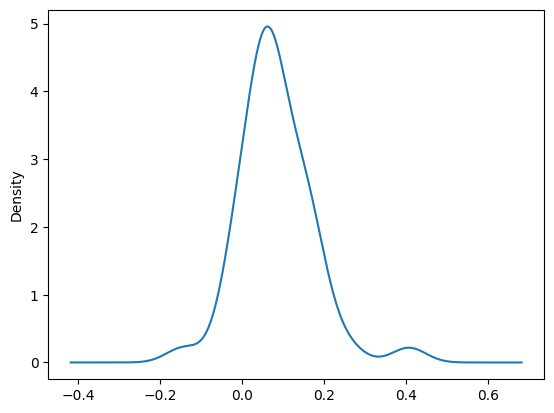

In [ ]:
result_CI['Estimate_W_LR'].plot(kind='density')
print('Skewness value:',skew(np.abs(result_CI['Estimate_W_LR']))) # Symmetric highly skew left, median=mean

In [ ]:
#CI_DEGs=GE_Profile_WGS[result_CI[result_CI['Estimate_W_LR']>=0.15].index]
#CI_DEGs=GE_Profile_WGS[result_CI[result_CI['Estimate_LR']>=0.15].index]
#CI_DEGs=GE_Profile_WGS[result_CI[result_CI['Estimate_DML']>=0.15].index]
#CI_DEGs=GE_Profile_WGS[result_CI[result_CI['Estimate_W_DML']>=0.15].index]
#CI_DEGs=GE_Profile_WGS[result_CI[result_CI['Estimate_DRL']>=0.15].index]
#CI_DEGs=GE_Profile_WGS[result_CI[result_CI['Estimate_W_DRL']>=0.15].index]
#CI_DEGs=GE_Profile_WGS[result_CI[result_CI['Estimate_MLX_']>=0.15].index]
#CI_DEGs=GE_Profile_WGS[result_CI[result_CI['Estimate_W_MLX']>=0.15].index]
#CI_DEGs=GE_Profile_WGS[result_CI[result_CI['Estimate_MLS']>=0.15].index]
#CI_DEGs=GE_Profile_WGS[result_CI[result_CI['Estimate_W_MLS']>=0.15].index]
#CI_DEGs=GE_Profile_WGS[result_CI[result_CI['Estimate_MLAdaptation']>=0.15].index]
#CI_DEGs=GE_Profile_WGS[result_CI[result_CI['Estimate_W_MLAdaptation']>=0.15].index]
#CI_DEGs=GE_Profile_WGS[result_CI[result_CI['Estimate_LDRL']>=0.15].index]
#CI_DEGs=GE_Profile_WGS[result_CI[result_CI['Estimate_W_LDRL']>=0.15].index]
#CI_DEGs=GE_Profile_WGS[result_CI[result_CI['Estimate_LinearDML']>=0.15].index]
#CI_DEGs=GE_Profile_WGS[result_CI[result_CI['Estimate_W_LinearDML']>=0.15].index]
#CI_DEGs=GE_Profile_WGS[result_CI[result_CI['Estimate_SparseDML']>=0.15].index]
#CI_DEGs=GE_Profile_WGS[result_CI[result_CI['Estimate_W_SparseDML']>=0.15].index]
#CI_DEGs=GE_Profile_WGS[result_CI[result_CI['Estimate_KernelDML']>=0.15].index]
CI_DEGs=GE_Profile_WGS[result_CI[result_CI['Estimate_W_KernelDML']>=0.15].index]

In [ ]:
CI_DEGs

,cg08223924,cg13897627,cg24576995,cg11820931,cg04094178,cg01970336,cg27203983,cg00576086,cg03267139,cg05081953,...,cg01573635,cg27537125,cg09873544,cg05579652,cg27219221,cg19319037,cg27583655,cg18025409,cg23156348,cg22641201
C3L-00977-02,0.619444,0.519399,0.412828,-0.423344,-0.221490,-0.678005,-2.471126,-0.601530,0.316551,-1.427331,...,0.050937,-2.574389,0.488929,-4.222453,2.210612,-1.741567,1.371278,-2.866945,-3.737814,-3.946311
C3L-00994-04,0.450862,0.927383,0.564328,0.522735,0.045030,-0.105659,-2.339620,-0.243070,0.661131,-1.191043,...,0.019296,-1.989978,0.538308,-4.471926,1.499506,-0.803770,1.774375,-2.617906,-3.884483,-3.344570
C3L-00994-07,1.466095,2.048056,2.024402,1.447290,2.398232,2.440734,-0.263025,1.949794,1.590329,-0.082898,...,1.370344,-1.332284,2.254976,-3.565354,3.283575,1.636239,2.971934,-1.099350,-2.410569,-1.629552
C3L-00995-02,0.640666,0.864629,0.583265,0.196946,0.267540,-0.803026,-2.592420,0.306887,0.450888,-1.339837,...,-0.102015,-2.596420,0.422363,-4.428492,1.423034,-0.968519,1.756421,-2.885404,-4.131821,-3.077425
C3L-00995-06,1.147058,1.980787,0.855593,1.098774,2.078080,1.147477,-0.703581,1.663969,1.445896,-0.319572,...,1.082079,-1.027014,1.616464,-3.123974,3.097791,1.647642,2.985789,-1.223159,-3.435170,-2.424183
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C3N-04278-01,-0.518190,0.073127,-0.303466,-0.592365,0.240257,-0.061100,-3.414421,1.049478,0.217391,-1.683587,...,-0.405551,-2.516232,0.349092,-4.788833,1.151543,-1.683514,2.192242,-2.222352,-3.726761,-3.533151
C3N-04278-05,1.756254,2.180482,2.349880,1.417930,2.793292,1.244771,-0.677973,1.134293,1.455882,0.064473,...,1.150496,-1.329527,2.155932,-3.280836,3.826969,-0.411469,2.704508,-2.155251,-1.636258,-1.490614
C3N-04279-01,-0.647191,-0.808017,-0.585341,-1.201651,-1.050928,-1.671533,-3.765784,-0.993168,-0.382444,-2.788317,...,-1.232060,-3.058160,-0.428585,-4.987645,0.487820,-1.630654,1.671778,-3.298336,-4.066388,-4.250722
C3N-04280-03,-0.294401,-0.205555,-0.238537,-1.100175,-1.456964,-1.571752,-2.771267,-0.439327,-0.323110,-1.860118,...,-1.081584,-3.187937,-0.683640,-4.951551,1.122871,-1.378020,1.573721,-3.147265,-4.577928,-4.235804


In [ ]:
CI_DEGs.to_csv(CancerType+ " " + Epigentetics_File+"_CI_W_KernelDML_0.15.csv")

#####All

In [ ]:
#GE_Profile_WGS = pd.read_csv('Statistical_DEGs.csv',index_col=0)
GE_Profile_WGS = pd.read_csv('Association_PA_DEGs_List_C1_P8_Responders_Vs_Non_Responders.csv',index_col=0)
Clinical_data = pd.read_csv('C1_P8_Responders_Vs_Non_Responders.csv',index_col=0)

GE_Profile_WGS['Label']=Clinical_data['Label']
GE_Profile_WGS=GE_Profile_WGS.dropna()

In [ ]:
#GE_Profile_WGS['gender']=Clinical_data['gender']
#GE_Profile_WGS['age']=Clinical_data['age']
GE_Profile_WGS['treatment_group']=Clinical_data['treatment_group']
GE_Profile_WGS['Label']=Clinical_data['Label']

In [ ]:
temp_cols=GE_Profile_WGS.columns.tolist()
#index=GE_Profile_WGS.columns.get_loc("treatment_group")
index=GE_Profile_WGS.columns.get_loc("Label")
new_cols=temp_cols[index:index+1] + temp_cols[0:index] + temp_cols[index+1:]
GE_Profile_WGS=GE_Profile_WGS[new_cols]
print(GE_Profile_WGS)

            Label  treatment_group    PRSSL1  C11ORF65  LOC100134816  \
GSM1105440      0                0  7.705496  6.868457      7.156559   
GSM1105441      0                1  7.822903  6.626063      6.964392   
GSM1105444      0                0  7.711693  6.944764      7.023721   
GSM1105445      0                0  8.088402  6.872709      7.177290   
GSM1105448      0                1  7.544518  6.726544      6.992798   
GSM1105449      0                0  8.010893  6.969686      6.978993   
GSM1105452      1                1  8.115313  6.912580      7.485311   
GSM1105453      1                1  8.223969  6.912645      7.288774   
GSM1105456      1                1  8.068872  7.225763      7.186371   
GSM1105457      0                1  8.016119  7.002545      7.099966   
GSM1105460      0                1  7.744217  6.730196      7.246298   
GSM1105461      0                1  7.735563  6.736825      6.899388   
GSM1105464      0                1  7.974421  6.980555      7.42

In [ ]:
GE_Profile_WGS['treatment_group']=GE_Profile_WGS['treatment_group'].astype('bool')
GE_Profile_WGS['Label']=GE_Profile_WGS['Label'].astype('bool')

In [ ]:
GE_Profile_WGS

,Label,treatment_group,PRSSL1,C11ORF65,LOC100134816,GYPE,TP53I3,MFSD2B,CDKN2C,LOC100127983,...,BMP2K,LOC728045,LOC646931,LYPD6B,SPNS2,BAG2,ARPP-21,HERC2P4,CAPN13,FZD5
GSM1105440,False,False,7.705496,6.868457,7.156559,7.132381,6.923224,7.124058,6.601086,6.831295,...,6.678733,6.668650,6.925150,6.671132,6.942137,6.942268,6.857977,6.646053,6.824060,6.857110
GSM1105441,False,True,7.822903,6.626063,6.964392,7.010144,6.872384,7.074821,6.582712,6.718979,...,6.616066,6.845835,6.742765,6.723051,6.948308,6.947757,6.701460,6.718742,6.907183,6.830004
GSM1105444,False,False,7.711693,6.944764,7.023721,7.076325,6.963161,7.099107,6.598663,6.837615,...,6.766410,6.725077,6.910681,6.764853,6.877393,6.934268,6.782938,6.644373,6.795199,6.773901
GSM1105445,False,False,8.088402,6.872709,7.177290,7.166069,6.993004,7.155360,6.770472,6.854583,...,6.830680,6.696887,6.899547,6.772373,6.989483,7.066740,6.734836,6.681958,6.804766,6.888052
GSM1105448,False,True,7.544518,6.726544,6.992798,7.114091,6.807980,7.028410,6.711151,6.884056,...,6.689892,6.777737,6.859621,6.721678,6.868058,6.954138,6.882703,6.756511,6.819798,6.769398
GSM1105449,False,False,8.010893,6.969686,6.978993,7.062112,6.979022,7.110604,6.808775,6.915195,...,6.842867,6.792383,6.786677,6.831020,6.863589,7.102051,6.904505,6.537086,6.824854,6.806645
GSM1105452,True,True,8.115313,6.912580,7.485311,7.324759,7.220075,7.278145,6.828036,7.311954,...,6.901633,6.768372,7.098507,6.981487,7.122615,7.132581,7.101735,6.865478,7.208948,6.948695
GSM1105453,True,True,8.223969,6.912645,7.288774,7.262855,7.111821,7.232807,6.793581,7.169870,...,7.027106,6.710567,7.097008,6.931460,7.128355,7.023533,7.001691,6.851739,6.819761,7.032253
GSM1105456,True,True,8.068872,7.225763,7.186371,7.626327,7.306215,7.256346,7.476349,7.162036,...,6.742481,6.900933,6.906304,6.967421,7.489974,7.226663,7.025423,6.662937,6.974113,6.921871
GSM1105457,False,True,8.016119,7.002545,7.099966,7.432507,6.964970,7.087538,6.797978,6.966796,...,6.770224,6.806669,6.925592,6.837764,7.119663,7.057532,6.948118,6.815847,6.970394,6.821673


In [ ]:
! pip install pygraphviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached pygraphviz-1.11.zip (120 kB)
  Preparing metadata (setup.py) ... done
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for pygraphviz
  Running setup.py clean for pygraphviz
Failed to build pygraphviz
ERROR: Could not build wheels for pygraphviz, which is required to install pyproject.toml-based projects


In [ ]:
GE_Profile_WGS.columns.to_list()[2:200]

['PRSSL1',
 'C11ORF65',
 'LOC100134816',
 'GYPE',
 'TP53I3',
 'MFSD2B',
 'CDKN2C',
 'LOC100127983',
 'LOC649800',
 'CRISP2',
 'ATL2',
 'HS.385619',
 'COMMD4',
 'CDK8',
 'LOC100131792',
 'FBXL5',
 'HS.551244',
 'RFESD',
 'ARL4A',
 'ZNF254',
 'HS.149005',
 'SDR9C7',
 'TFDP2',
 'UBFD1',
 'RFESD.1',
 'IL22',
 'LOC729870',
 'LOC100130269',
 'FRMPD2',
 'TLL2',
 'LOC647130',
 'ATP5S',
 'HS.107801',
 'MMP28',
 'NSUN3',
 'ITM2B',
 'TFR2',
 'LOC646947',
 'ATP5S.1',
 'GABRD',
 'DKFZP434B061',
 'SNORD117',
 'DACH1',
 'LOC440905',
 'RPL41',
 'LOC100133609',
 'DEFB132',
 'WDR51B',
 'MAPKSP1',
 'HS.574023',
 'LOC283767',
 'ASPA',
 'C1S',
 'LOC100131271',
 'LOC643614',
 'LOC728368',
 'PNMT',
 'LOC643116',
 'TMEM56',
 'CCRL1',
 'LOC401286',
 'KIAA1906',
 'ILDR2',
 'PGM2L1',
 'LOC150763',
 'NUDT4P1',
 'MAOA',
 'LOC646782',
 'KRTAP22-2',
 'C9ORF40',
 'HS.509146',
 'SFRP2',
 'LOC642771',
 'B4GALNT3',
 'GYPA',
 'SNORA72',
 'HS.170508',
 'BPGM',
 'FNDC3A',
 'POFUT2',
 'LOC646862',
 'SEMA7A',
 'LOC646949',
 

[scatterd] >WARNING> Causal Graph not provided. DoWhy will construct a graph based on data inputs.


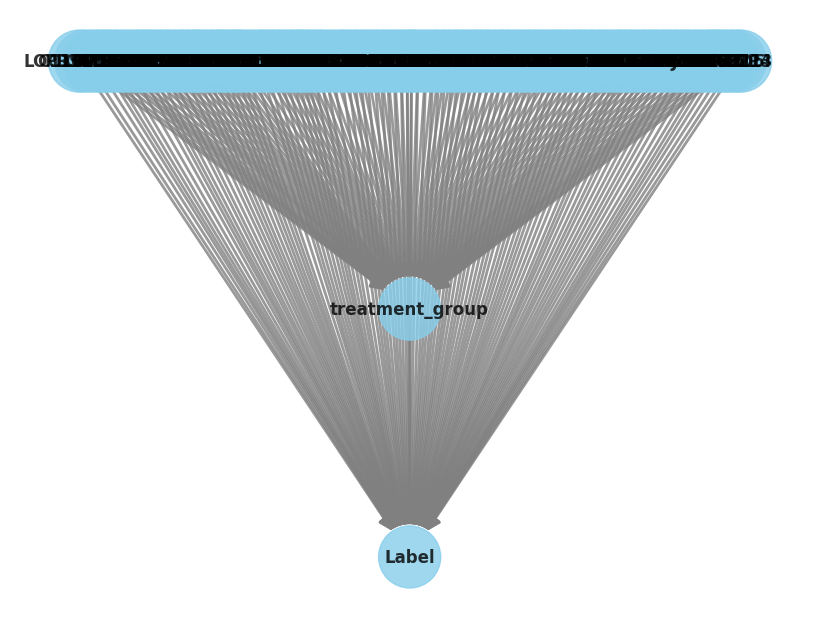

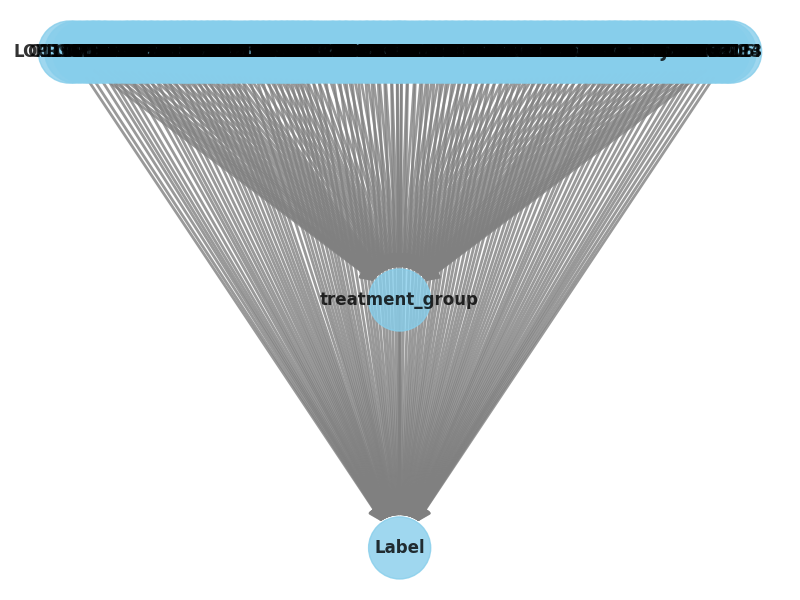

In [ ]:
#! pip install numpy==1.23.1
#! pip install dowhy


import dowhy
from dowhy import CausalModel


model= CausalModel(
        data = GE_Profile_WGS,
        treatment='treatment_group',
        outcome='Label',
        common_causes=GE_Profile_WGS.columns.to_list()[2:200]
        )
model.view_model(layout="dot")
from IPython.display import Image, display
display(Image(filename="causal_model.png"))

In [ ]:
identified_estimand = model.identify_effect(proceed_when_unidentifiable=True, method_name="maximal-adjustment")
print(identified_estimand)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
        d                                                                     
──────────────────(E[Label|LOC440905,SPNS2,ARPP-21,LOC283767,BAG2,C11ORF65,HS.
d[treatment_group]                                                            

                                                                              
574023,CHIC1,LOC100134816,ZNF254,DKFZP434B061,LOC649800,PGM2L1,LOC646947,LOC64
                                                                              

                                                                              
6862,SNORD117,KRTAP22-2,LOC728368,LOC647130,C1S,HS.509146,LOC653907,FZD5,LOC64
                                                                              

                                                                              
6782,ASPA,NMNAT3,CRISP2,RFESD.1,MAPKSP1,B4GALNT3,RFESD,CDK8,FNDC3A,HS.551244,L
                   

In [ ]:
estimate = model.estimate_effect(identified_estimand,
        method_name="backdoor.linear_regression", test_significance=True
)

print(estimate)

print("Causal Estimate is " + str(estimate.value))
data_1 = GE_Profile_WGS[GE_Profile_WGS["treatment_group"]==1]
data_0 = GE_Profile_WGS[GE_Profile_WGS["treatment_group"]==0]

print("ATE", np.mean(data_1["Label"])- np.mean(data_0["Label"]))

*** Causal Estimate ***

## Identified estimand
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
        d                                                                     
──────────────────(E[Label|LOC440905,SPNS2,ARPP-21,LOC283767,BAG2,C11ORF65,HS.
d[treatment_group]                                                            

                                                                              
574023,CHIC1,LOC100134816,ZNF254,DKFZP434B061,LOC649800,PGM2L1,LOC646947,LOC64
                                                                              

                                                                              
6862,SNORD117,KRTAP22-2,LOC728368,LOC647130,C1S,HS.509146,LOC653907,FZD5,LOC64
                                                                              

                                                                              
6782,ASPA,NMNAT3,CRISP2,RFESD.1,MAPKSP1,B4GALNT3,R

divide by zero encountered in divide
invalid value encountered in double_scalars
divide by zero encountered in double_scalars


In [ ]:
estimate = model.estimate_effect(identified_estimand,
        method_name="backdoor.propensity_score_matching"
)

print("Causal Estimate is " + str(estimate.value))
data_1 = GE_Profile_WGS[GE_Profile_WGS["treatment_group"]==1]
data_0 = GE_Profile_WGS[GE_Profile_WGS["treatment_group"]==0]

print("ATE", np.mean(data_1["Label"])- np.mean(data_0["Label"]))

Causal Estimate is 0.5166666666666667
ATE 0.19642857142857145


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


In [ ]:
estimate = model.estimate_effect(identified_estimand,
        method_name="backdoor.propensity_score_stratification", method_params={'num_strata':2, 'clipping_threshold':1}
)

print("Causal Estimate is " + str(estimate.value))
print("ATE", np.mean(data_1["Label"])- np.mean(data_0["Label"]))

Causal Estimate is 0.04901960784313725
ATE 0.19642857142857145


In [ ]:
estimate = model.estimate_effect(identified_estimand,
        method_name="backdoor.propensity_score_weighting"
)

print("Causal Estimate is " + str(estimate.value))

print("ATE", np.mean(data_1["Label"])- np.mean(data_0["Label"]))

Causal Estimate is 0.17549982872057662
ATE 0.19642857142857145


In [ ]:
refute_results=model.refute_estimate(identified_estimand, estimate,
        method_name="random_common_cause")
print(refute_results)

Refute: Add a random common cause
Estimated effect:0.14177479236993892
New effect:0.14177479236993887
p value:1.0



In [ ]:
print(round(float(str(refute_results).split(" ")[7].split(":")[1].split("\n")[0]),4))

0.2136


In [ ]:
res_placebo=model.refute_estimate(identified_estimand, estimate,
        method_name="placebo_treatment_refuter", placebo_type="permute")
print(res_placebo)

Refute: Use a Placebo Treatment
Estimated effect:0.14177479236993892
New effect:-0.1341860030636659
p value:0.32



In [ ]:
res_subset=model.refute_estimate(identified_estimand, estimate,
        method_name="data_subset_refuter", subset_fraction=0.9)
print(res_subset)

Refute: Use a subset of data
Estimated effect:0.14177479236993892
New effect:0.13512108617108873
p value:0.8



###Visualisation

In [ ]:
HDG_GE_Profile_WGS

GEO ID,ILMN_1746032,ILMN_2333219,ILMN_1784756,ILMN_1669633,ILMN_3241313,ILMN_1683781,ILMN_1703803,ILMN_1680343,ILMN_1782679,ILMN_1759312,...,ILMN_1679301,ILMN_1734783,ILMN_1719202,ILMN_1720027,ILMN_2100834,ILMN_1769673,ILMN_1666420,ILMN_3249439,ILMN_1653163,Label
GSM1105441,7.047550,6.741471,6.717545,8.932346,6.691742,6.973758,6.659551,6.890587,6.790582,6.598128,...,6.872523,6.752870,7.167526,7.446976,6.657085,7.210274,6.775098,6.691160,6.821844,2
GSM1105448,6.879572,6.810473,6.678937,8.678802,6.823162,6.943406,6.694185,6.955728,6.641125,6.644600,...,6.824676,6.733116,7.034608,7.335534,6.768915,7.418180,6.791347,6.781613,6.887496,2
GSM1105452,7.011605,7.051145,6.895947,8.862416,6.886278,7.105912,7.110870,6.843439,6.890523,6.831350,...,6.988754,6.580024,7.323953,7.576401,6.877983,7.657114,6.888702,6.872717,7.199847,1
GSM1105453,7.042045,6.921219,6.792540,9.289423,6.811814,7.220055,6.867580,6.984382,6.884030,6.812641,...,7.159433,6.584729,7.176878,7.433426,6.818047,7.679883,6.900847,6.869673,7.079992,1
GSM1105456,7.027359,7.290292,6.876220,9.957726,6.799501,7.186308,6.758936,6.984973,6.803820,6.878370,...,7.009121,6.925997,7.170986,8.383310,6.673532,7.622225,6.918223,6.881485,7.330339,1
GSM1105457,6.989146,7.001463,6.755311,9.229387,6.904861,6.880349,6.745580,7.040798,6.792807,6.758752,...,6.826121,6.751727,7.254706,7.668155,6.766058,7.551784,6.782699,6.946109,7.034225,2
GSM1105460,6.770811,6.848324,6.777538,8.765799,6.904199,6.857348,6.653546,7.025804,6.693702,6.724080,...,6.800077,6.642241,6.960551,7.200886,6.764097,7.243703,6.837692,6.690163,6.953036,2
GSM1105461,6.886920,6.850146,6.566365,8.769036,6.742995,6.886210,6.767652,6.835594,6.728129,6.611523,...,6.700147,6.581896,6.882430,7.182285,6.793637,7.201939,6.794804,6.774224,7.002303,2
GSM1105464,7.059154,7.109789,6.609588,9.032250,6.755125,6.945491,6.766162,6.858143,6.895008,6.760048,...,6.936733,6.840268,7.244924,7.512935,6.748014,7.385057,6.837765,6.908560,7.095989,2
GSM1105465,6.779974,6.856351,6.737349,8.450708,6.810561,6.829215,6.776313,6.989627,6.757057,6.752183,...,6.903495,6.719420,7.226909,7.688245,6.670186,7.425164,6.847342,6.707827,6.996140,2


In [ ]:
HDG_GE_Profile_WGS_DEGs=HDG_GE_Profile_WGS[HDG_GE_Profile_WGS_DEG_Results[HDG_GE_Profile_WGS_DEG_Results['Adj_p-value_BH']<0.1].index]
Gene_names = pd.read_csv('Gene Symbol.csv',index_col=9)
Gene_names.iloc[Gene_names.index.isin(HDG_GE_Profile_WGS_DEGs.columns)]['ILMN_Gene']

HDG_GE_Profile_WGS_DEGs.columns=Gene_names.iloc[Gene_names.index.isin(HDG_GE_Profile_WGS_DEGs.columns)]['ILMN_Gene']


In [ ]:
HDG_GE_Profile_WGS_DEGs.to_csv('DEGs_List_C2_P3_Lithium_Responders_Vs_Lithium_Non_Responders2.csv')

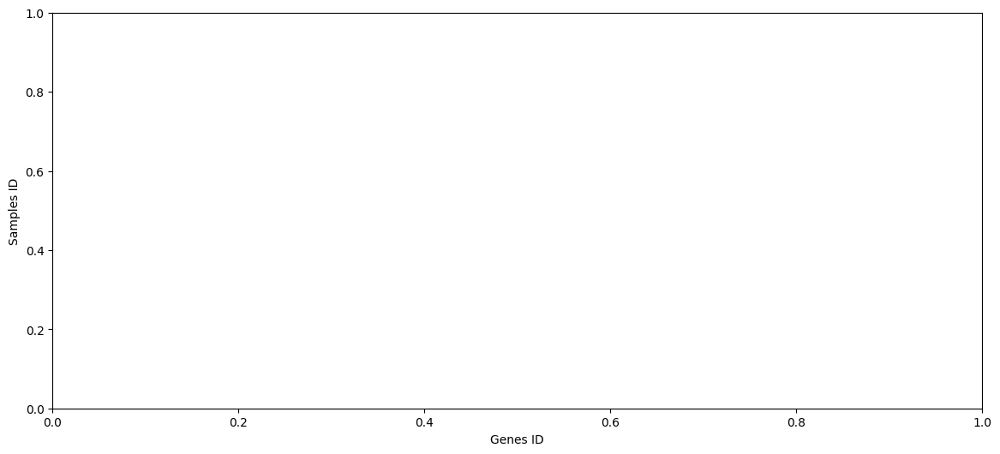

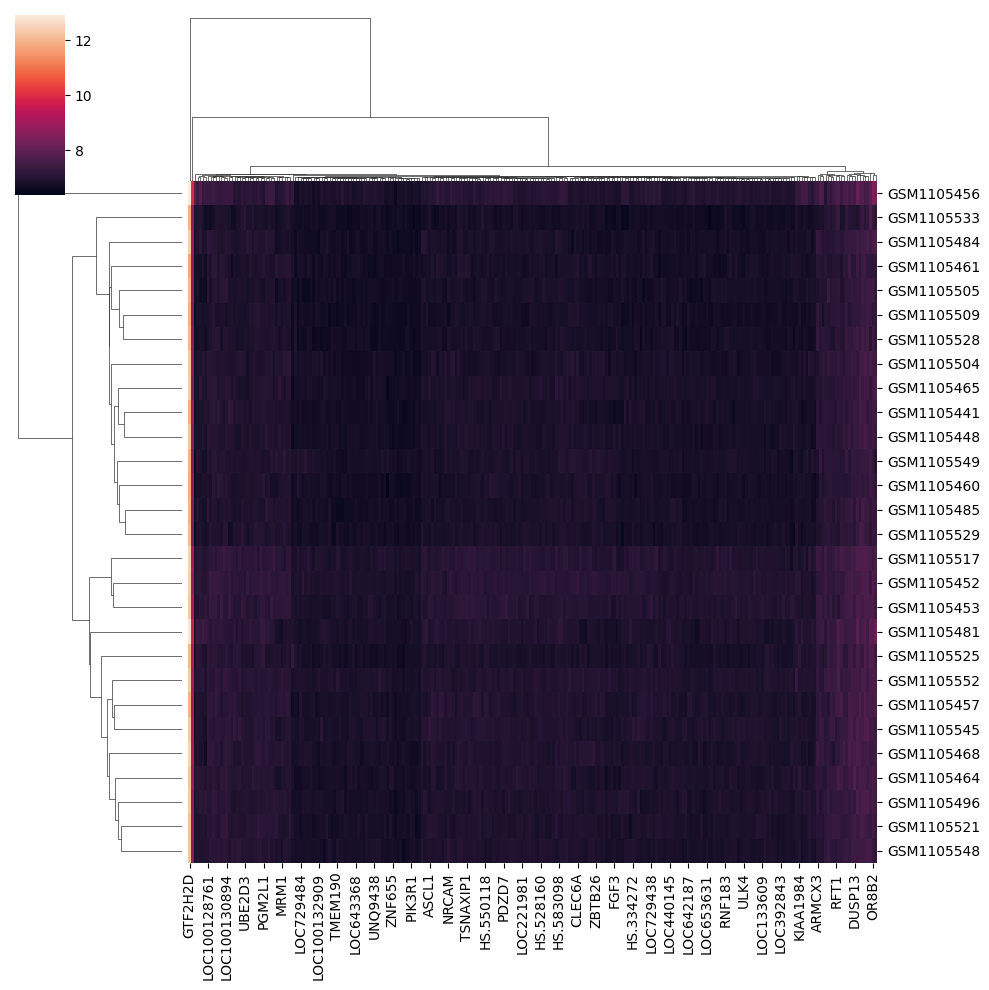

In [ ]:
import seaborn as sns
fig, ax = plt.subplots(figsize=(14, 6))
#sns.heatmap(HDG_GE_Profile_WGS[HDG_GE_Profile_WGS_DEG_Results[HDG_GE_Profile_WGS_DEG_Results['Adj_p-value_BH']<0.1].index])
#sns.heatmap(HDG_GE_Profile_WGS_DEGs)
GE_Profile_WGS = pd.read_csv('DEGs_List_C2_P3_Lithium_Responders_Vs_Lithium_Non_Responders2.csv',index_col=0)
sns.clustermap(GE_Profile_WGS)
ax.set_ylabel('Samples ID')
ax.set_xlabel('Genes ID')
plt.show()

<Axes: >

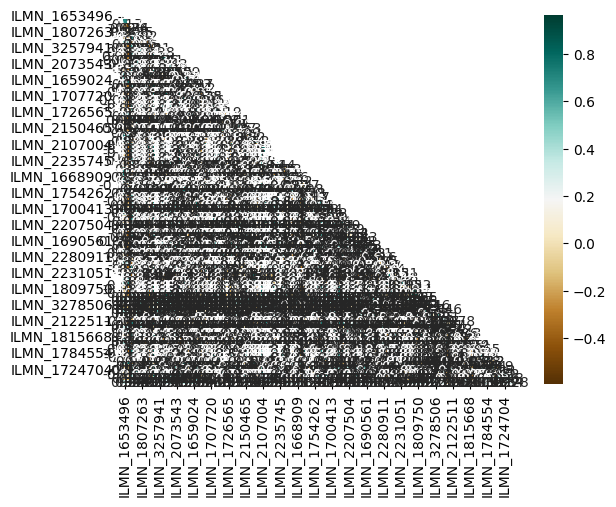

In [ ]:
import seaborn as sns
GE_Profile_WGS = pd.read_csv('Statistical_DEGs.csv',index_col=0)
mask = np.triu(np.ones_like(GE_Profile_WGS.corr()))
sns.heatmap(GE_Profile_WGS.corr(),mask=mask,annot=True,cmap='BrBG')